# Installing and Importing Packages

In [217]:
import pandas as pd
import numpy as np
import gc
import numpy as np
from random import randint

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn import metrics
from sklearn.model_selection import KFold
from sklearn.compose import ColumnTransformer
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import cdist
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import FastICA
from scipy.stats import kurtosis

from sklearn.random_projection import GaussianRandomProjection


import torch
from torch import nn, optim
from torch.nn import functional as F
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from keras.utils import to_categorical

import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense

import time

np.random.seed(42)

# Importing Data and Processing

In [218]:
url = 'https://raw.githubusercontent.com/AaronScherf/ML_As1_SL/main/housing.csv'
housing = pd.read_csv(url)
# remove outliers of over 500000 in value
housing.drop(housing[housing['median_house_value'] > 500000].index, inplace=True)
housing = housing.sample(frac = 0.7,random_state=42).reset_index() # reduce sample and shuffle data
y_housing = pd.DataFrame(housing['median_house_value'])
X_housing = housing.drop(['median_house_value','index'],axis=1)
housing_cols = X_housing.columns

In [160]:
X_housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
0,-116.96,32.80,24.0,2493.0,693.0,1420.0,643.0,1.8357,<1H OCEAN
1,-117.14,32.93,14.0,1946.0,463.0,1205.0,390.0,4.2109,<1H OCEAN
2,-117.29,34.14,52.0,1683.0,266.0,646.0,256.0,4.0481,INLAND
3,-124.01,40.97,21.0,1513.0,319.0,943.0,301.0,3.5380,<1H OCEAN
4,-121.38,38.62,34.0,2352.0,610.0,1127.0,592.0,2.2000,INLAND
...,...,...,...,...,...,...,...,...,...
13767,-121.43,38.52,30.0,3657.0,945.0,2925.0,899.0,1.3927,INLAND
13768,-118.30,34.06,47.0,1390.0,872.0,2860.0,827.0,1.4680,<1H OCEAN
13769,-122.49,37.69,35.0,2644.0,456.0,1465.0,430.0,4.9375,NEAR OCEAN
13770,-117.69,33.66,5.0,4246.0,689.0,1933.0,722.0,6.9501,<1H OCEAN


In [219]:
# categorize housing data
y_housing['median_house_value'] = y_housing['median_house_value'] > y_housing['median_house_value'].median()
y_housing = y_housing.astype(int)
y_housing

,median_house_value
0,0
1,0
2,0
3,0
4,0
...,...
13767,0
13768,0
13769,1
13770,1


In [220]:
new_housing_cols = list(housing_cols.drop('ocean_proximity'))
[new_housing_cols.append(x) for x in list(X_housing[X_housing.columns[-1]].unique())[1:]]
new_housing_cols

['longitude',
 'latitude',
 'housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income',
 'INLAND',
 'NEAR OCEAN',
 'NEAR BAY',
 'ISLAND']

In [221]:

'''processing numerical attributes'''
housing_numeric = X_housing.columns[0:8]

num_pipeline=Pipeline([('imputer',SimpleImputer(strategy='median')),('std_scaler',StandardScaler())])
housing_num_tr=num_pipeline.fit_transform(X_housing[housing_numeric])

from sklearn.compose import ColumnTransformer

'''handling categorical and numerical attributes and combining them into a single pipeline'''

num_attribs=list(X_housing[housing_numeric])
cat_attribs=['ocean_proximity']
full_pipeline=ColumnTransformer([("num",num_pipeline,num_attribs),("cat",OneHotEncoder(drop='first'),cat_attribs)])

X_housing=full_pipeline.fit_transform(X_housing)
y_housing = np.array(y_housing.astype(int))

X_housing = pd.DataFrame(X_housing,columns=new_housing_cols)
X_housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,INLAND,NEAR OCEAN,NEAR BAY,ISLAND
0,1.298913,-1.327794,-0.346593,-0.062532,0.356380,-0.019734,0.359101,-1.180753,0.0,0.0,0.0,0.0
1,1.209107,-1.267116,-1.145951,-0.307694,-0.181784,-0.202372,-0.289040,0.333091,0.0,0.0,0.0,0.0
2,1.134269,-0.702341,1.891607,-0.425569,-0.642733,-0.677229,-0.632325,0.229329,1.0,0.0,0.0,0.0
3,-2.218475,2.485603,-0.586401,-0.501762,-0.518721,-0.424934,-0.517043,-0.095785,0.0,0.0,0.0,0.0
4,-0.906315,1.388726,0.452764,-0.125728,0.162173,-0.268631,0.228448,-0.948565,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
13767,-0.931261,1.342050,0.133021,0.459165,0.946021,1.258727,1.014929,-1.463101,1.0,0.0,0.0,0.0
13768,0.630360,-0.739682,1.491929,-0.556890,0.775212,1.203512,0.830477,-1.415108,0.0,0.0,0.0,0.0
13769,-1.460116,0.954643,0.532700,0.005145,-0.198163,0.018492,-0.186567,0.796192,0.0,0.0,0.0,1.0
13770,0.934701,-0.926384,-1.865372,0.723151,0.347021,0.416047,0.561486,2.078931,0.0,0.0,0.0,0.0


In [164]:
X_housing.isnull().values.any()

False

In [222]:
# feature selection to reduce dimensions of housing data

# define feature selection
#fs = SelectKBest(score_func=f_classif, k=5)
# apply feature selection
#fs.fit(X_housing, y_housing.ravel())
#cols_idxs = fs.get_support(indices=True)
#X_housing = X_housing.iloc[:,cols_idxs]
#X_housing

In [223]:
url = 'https://raw.githubusercontent.com/AaronScherf/ML_As1_SL/main/data.csv'
bankrupt = pd.read_csv(url)
y_bankrupt = pd.DataFrame(bankrupt['Bankrupt?'].values.astype(int))
X_bankrupt = bankrupt.drop('Bankrupt?', axis=1)
X_bankrupt.drop([' Liability-Assets Flag',' Net Income Flag'],axis=1, inplace=True)
bankrupt_cols = X_bankrupt.columns

In [167]:
X_bankrupt.describe()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Current Liability to Current Assets,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000
mean,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,0.781381,...,0.031506,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,0.047578
std,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,0.012679,...,0.030845,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,0.781567,...,0.018034,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,0.024477
50%,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,0.781635,...,0.027597,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,0.033798
75%,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,0.781735,...,0.038375,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [224]:
'''processing numerical attributes'''

num_pipeline=Pipeline([('imputer',SimpleImputer(strategy='median')),('std_scaler',StandardScaler())])
bankrupt_num_tr=num_pipeline.fit_transform(X_bankrupt)

'''handling categorical and numerical attributes and combining them into a single pipeline'''

num_attribs=list(X_bankrupt)
full_pipeline=ColumnTransformer([("num",num_pipeline,num_attribs)])

X_bankrupt=full_pipeline.fit_transform(X_bankrupt)
y_bankrupt = np.array(y_bankrupt.astype(int))

X_bankrupt = pd.DataFrame(X_bankrupt,columns=bankrupt_cols)

In [169]:
X_bankrupt

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Current Liability to Current Assets,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
0,-2.217909,-2.045798,-2.400361,-0.383334,-0.382638,0.016456,-0.023516,-0.020165,-0.087479,-0.031281,...,2.812493,-2.254317,-0.049491,-0.084274,-0.383465,-0.861611,0.680171,-0.060031,-0.098978,-0.622067
1,-0.673828,-0.311068,-0.598450,0.135068,0.136307,0.014671,0.014799,0.015966,-0.005957,0.009823,...,0.527485,-0.309033,-0.049491,-0.021388,0.135253,-0.029804,0.240685,15.129816,0.364559,-0.535573
2,-1.303672,-0.908420,-1.319910,-0.383759,-0.388177,0.007858,-0.061111,-0.051183,-0.142238,-0.086566,...,-0.199721,-0.820510,-0.049491,-0.005984,-0.383698,-0.249820,0.679247,-0.062961,-0.125015,-0.621960
3,-1.735886,-1.636209,-1.556340,-1.441418,-1.441832,-0.004257,-0.017313,-0.008676,-0.024491,-0.011077,...,1.158899,-1.691222,-0.049491,-0.080226,-1.441526,-0.392864,0.093765,-0.053903,-0.052562,-0.471826
4,-0.661778,-0.307745,-0.508050,-0.541238,-0.540708,0.016758,0.013703,0.016186,-0.013254,0.013300,...,0.525867,-0.316008,-0.049491,-0.032052,-0.541255,-0.029564,-0.128014,-0.178037,0.776395,-0.241715
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,-0.189395,-0.291959,-0.168181,-0.206277,-0.204969,0.018215,0.017036,0.018197,-0.010092,0.016277,...,-0.115286,-0.194231,-0.049491,-0.024011,-0.206217,-0.002968,-0.052524,-0.030437,0.063215,-0.353693
6815,-0.494676,-0.310237,-0.477627,-0.569328,-0.568828,0.018223,0.017455,0.017919,-0.009248,0.016145,...,-0.001180,-0.198659,-0.049491,0.001317,-0.569333,-0.006633,-0.154404,-0.033992,0.049970,-0.185856
6816,-0.534845,-0.379194,-0.534996,0.147411,0.135029,0.017628,0.016412,0.017153,-0.009919,0.013012,...,-0.776979,-0.247517,-0.049491,0.019653,0.147305,-0.018166,-0.316446,-0.047870,-0.015101,1.001206
6817,0.017875,0.019594,0.007403,-0.005811,-0.004720,0.024494,0.024099,0.023223,-0.011175,0.022233,...,-0.278510,0.100366,-0.049491,0.003493,-0.005931,0.046934,-0.194852,-0.045898,-0.004270,-0.071364


In [225]:
# define feature selection
fs = SelectKBest(score_func=f_classif, k=10)
# apply feature selection
fs.fit(X_bankrupt, y_bankrupt.ravel())
cols_idxs = fs.get_support(indices=True)
X_bankrupt = X_bankrupt.iloc[:,cols_idxs]
X_bankrupt

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Persistent EPS in the Last Four Seasons,Per Share Net profit before tax (Yuan ¥),Debt ratio %,Net worth/Assets,Net profit before tax/Paid-in capital,Retained Earnings to Total Assets,Net Income to Total Assets
0,-2.217909,-2.045798,-2.400361,-1.794106,-1.375150,1.750845,-1.750845,-1.460495,-1.232594,-2.254317
1,-0.673828,-0.311068,-0.598450,-0.597379,-0.435312,1.075727,-1.075727,-0.446793,-0.143474,-0.309033
2,-1.303672,-0.908420,-1.319910,-1.450153,-1.252562,1.749724,-1.749724,-1.126595,-0.971327,-0.820510
3,-1.735886,-1.636209,-1.556340,-1.055034,-1.077762,0.710131,-0.710131,-1.142029,-1.088734,-1.691222
4,-0.661778,-0.307745,-0.508050,-0.489361,-0.480715,-0.123674,0.123674,-0.495543,-0.816926,-0.316008
...,...,...,...,...,...,...,...,...,...,...
6814,-0.189395,-0.291959,-0.168181,-0.367130,-0.369478,0.212203,-0.212203,-0.376975,-0.356845,-0.194231
6815,-0.494676,-0.310237,-0.477627,-0.364287,-0.349046,-0.258249,0.258249,-0.354438,-0.082288,-0.198659
6816,-0.534845,-0.379194,-0.534996,-0.537684,-0.335426,-1.376904,1.376904,-0.338760,-0.106889,-0.247517
6817,0.017875,0.019594,0.007403,-0.014649,0.036878,-0.485905,0.485905,-0.007065,0.190903,0.100366


In [226]:
import imblearn
from imblearn.over_sampling import SMOTE

# oversample bankrupt cases with SMOTE to provide more examples for classification
oversample = SMOTE(sampling_strategy=0.1,random_state=42)
X_bankrupt, y_bankrupt = oversample.fit_resample(X_bankrupt, y_bankrupt)
y_bankrupt = np.array(y_bankrupt)
X_bankrupt

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Persistent EPS in the Last Four Seasons,Per Share Net profit before tax (Yuan ¥),Debt ratio %,Net worth/Assets,Net profit before tax/Paid-in capital,Retained Earnings to Total Assets,Net Income to Total Assets
0,-2.217909,-2.045798,-2.400361,-1.794106,-1.375150,1.750845,-1.750845,-1.460495,-1.232594,-2.254317
1,-0.673828,-0.311068,-0.598450,-0.597379,-0.435312,1.075727,-1.075727,-0.446793,-0.143474,-0.309033
2,-1.303672,-0.908420,-1.319910,-1.450153,-1.252562,1.749724,-1.749724,-1.126595,-0.971327,-0.820510
3,-1.735886,-1.636209,-1.556340,-1.055034,-1.077762,0.710131,-0.710131,-1.142029,-1.088734,-1.691222
4,-0.661778,-0.307745,-0.508050,-0.489361,-0.480715,-0.123674,0.123674,-0.495543,-0.816926,-0.316008
...,...,...,...,...,...,...,...,...,...,...
7253,-0.874685,-0.649140,-0.742008,-0.910582,-0.795096,1.330660,-1.330660,-0.834351,-0.310329,-0.642445
7254,-0.759760,-1.434942,-0.991382,-1.085723,-0.917837,1.085655,-1.085655,-0.959009,-1.045672,-1.503261
7255,-2.192039,-1.986506,-2.308824,-1.775551,-1.404786,1.705216,-1.705216,-1.493435,-1.283596,-2.300936
7256,-0.642317,-1.031953,-0.850437,-1.058087,-0.889377,1.951217,-1.951217,-0.887605,-0.930069,-0.998519


In [282]:
X_bankrupt = X_bankrupt.rename(columns=lambda x: x.strip()[:20])

# Explore Data

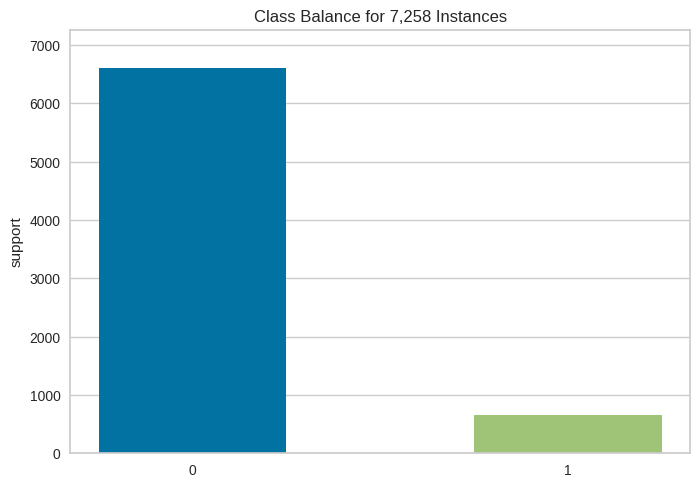

<Axes: title={'center': 'Class Balance for 7,258 Instances'}, ylabel='support'>

In [172]:
from yellowbrick.target import ClassBalance

# Class balance for bankruptcy data
visualizer = ClassBalance(labels=["0", "1"])

visualizer.fit(y_bankrupt)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

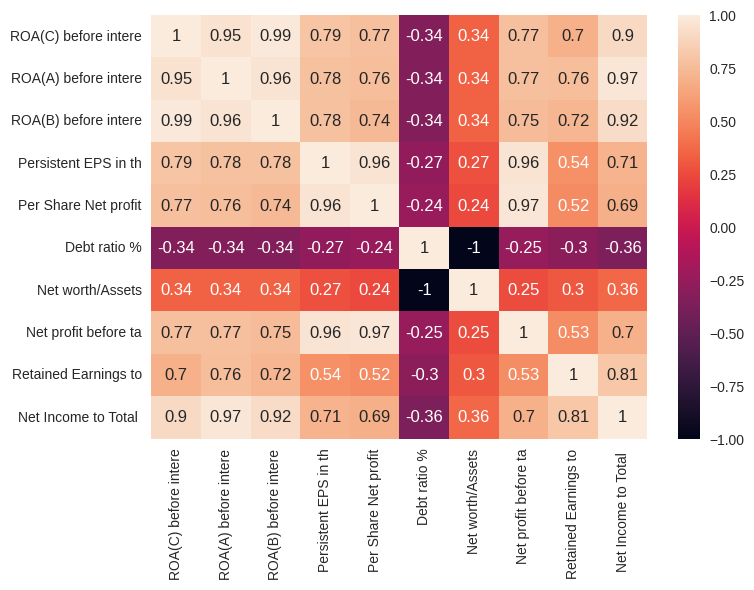

In [284]:

#plotting the heatmap for correlation
ax = sns.heatmap(round(X_bankrupt.corr(),2), annot=True)

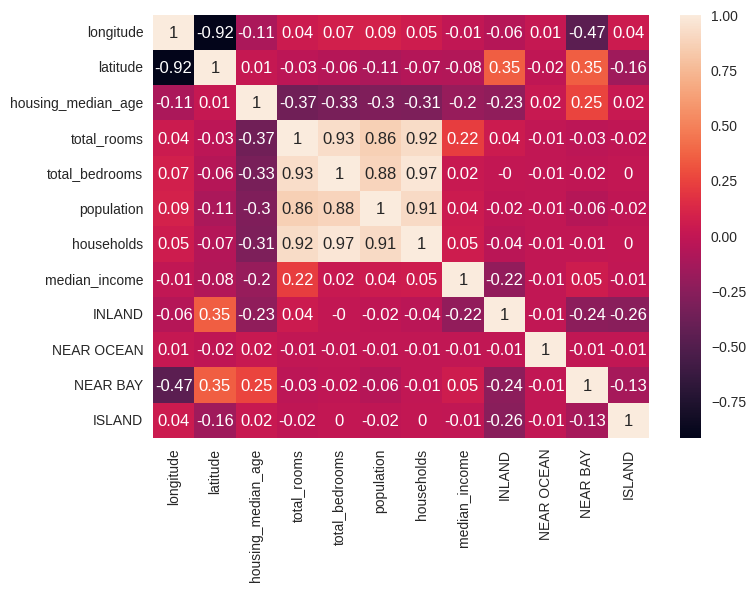

In [174]:

#plotting the heatmap for correlation
ax = sns.heatmap(round(X_housing.corr(),2), annot=True)

# Clustering Algorithms


Expectation Maximization

Clustering Algorithm of Your Choice

Distance measurement of choice

https://scikit-learn.org/stable/modules/clustering.html

Need to choose clusters in unsupervised fasion

Try yellowbrick elbow plot?
https://www.scikit-yb.org/en/latest/api/cluster/elbow.html

In [227]:
# Expectation Maximization via GMM
# https://scikit-learn.org/stable/modules/mixture.html#expectation-maximization

def gmm_plots(X_data,y_data,max_iter,max_cluster,text_pos):
    # determine optimal cluster number using elbow curve for each covariance type
    X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.2, stratify=y_data, random_state=42)
    X_train = pd.DataFrame(X_train)
    X_test = pd.DataFrame(X_test)

    def elbow_report(X,cov_type,max_iter,max_cluster):
        meandist = []
        n_clusters = range(2,max_cluster)
        for n_cluster in n_clusters:
            gmm = GaussianMixture(n_components=n_cluster,covariance_type=cov_type,max_iter=max_iter,random_state=42)
            gmm.fit(X)
            dist_sum = sum(
                np.min(
                  cdist(X, gmm.means_, metric='euclidean'),
                  axis=1
                ) / X.shape[0]
              )
            meandist.append(dist_sum)
        plt.plot(n_clusters,meandist,'bx-')
        plt.xlabel('Number of Clusters')
        plt.ylabel('Mean Euclidean Distance')
        plt.title('GMM Elbow Plot for '+cov_type)
        plt.show()
        return meandist

    elbow_cluster_dict = {"spherical":0, "diag":0, "tied":0, "full":0}
    for cov_type in ["spherical", "diag", "tied", "full"]:
        meandist = elbow_report(X=X_train,cov_type=cov_type,max_iter=max_iter,max_cluster=max_cluster)
        elbow_cluster_dict[cov_type] = np.argmin(meandist)

    print(elbow_cluster_dict)

    def sillhoutte_report(X,cov_type,max_iter,max_cluster):
        sil_list = []
        n_clusters = range(2,max_cluster)
        for n_cluster in n_clusters:
            gmm = GaussianMixture(n_components=n_cluster,covariance_type=cov_type,max_iter=max_iter,random_state=42)
            gmm.fit(X)
            sil_score = silhouette_score(X, gmm.predict(X))
            sil_list.append(sil_score)
        plt.plot(n_clusters,sil_list,'bx-')
        plt.xlabel('Values of K')
        plt.ylabel('Silhouette score')
        plt.title('GMM Silhouette analysis for '+cov_type)
        _ = plt.xticks(np.arange(2,max_cluster))
        plt.show()

        print(f"Best K: {np.argmax(sil_list)+2}")
        return sil_list


    sil_cluster_dict = {"spherical":0, "diag":0, "tied":0, "full":0}
    for cov_type in ["spherical", "diag", "tied", "full"]:
        sil_list = sillhoutte_report(X=X_train,cov_type=cov_type,max_iter=max_iter,max_cluster=max_cluster)
        sil_cluster_dict[cov_type] = np.argmax(sil_list)+2

    print(sil_cluster_dict)

    def make_ellipses(gmm, ax,colors):
        for n, color in enumerate(colors):
            if gmm.covariance_type == "full":
                covariances = gmm.covariances_[n][:2, :2]
            elif gmm.covariance_type == "tied":
                covariances = gmm.covariances_[:2, :2]
            elif gmm.covariance_type == "diag":
                covariances = np.diag(gmm.covariances_[n][:2])
            elif gmm.covariance_type == "spherical":
                covariances = np.eye(gmm.means_.shape[1]) * gmm.covariances_[n]
            v, w = np.linalg.eigh(covariances)
            u = w[0] / np.linalg.norm(w[0])
            angle = np.arctan2(u[1], u[0])
            angle = 180 * angle / np.pi  # convert to degrees
            v = 2.0 * np.sqrt(2.0) * np.sqrt(v)
            ell = mpl.patches.Ellipse(
                gmm.means_[n, :2], v[0], v[1], angle=180 + angle, color=color
            )
            ell.set_clip_box(ax.bbox)
            ell.set_alpha(0.5)
            ax.add_artist(ell)
            ax.set_aspect("equal", "datalim")

    # collect estimator output
    est_out =[]

    # Try GMMs using different types of covariances, using optimal number of clusters per covariance type
    estimators = {
        cov_type: GaussianMixture(
            n_components=sil_cluster_dict[cov_type], covariance_type=cov_type, max_iter=max_iter, random_state=42
        )
        for cov_type in ["spherical", "diag", "tied", "full"]
    }

    n_estimators = len(estimators)

    plt.figure(figsize=(3 * n_estimators // 2, 6))
    plt.subplots_adjust(
        bottom=0.01, top=0.95, hspace=0.15, wspace=0.05, left=0.01, right=0.99
    )


    for index, (name, estimator) in enumerate(estimators.items()):

        # Train the other parameters using the EM algorithm.
        estimator.fit(X_train)
        est_out.append(estimator)
        y_train_pred = estimator.predict(X_train)
        y_test_pred = estimator.predict(X_test)

        h = plt.subplot(2, n_estimators // 2, index + 1)
        colors = []
        n_clusters = sil_cluster_dict[estimator.covariance_type]
        for i in range(n_clusters):
            colors.append('#%06X' % randint(0, 0xFFFFFF))

        for n, color in enumerate(colors):
            data = pd.DataFrame(X_train)[y_train_pred == n]
            plt.scatter(
                data.iloc[:, 0], data.iloc[:, 1], s=0.8, color=color, label=n
            )
        # Plot the test data with crosses
        for n, color in enumerate(colors):
            data = pd.DataFrame(X_test)[y_test_pred == n]
            plt.scatter(data.iloc[:, 0], data.iloc[:, 1], marker="x", color=color)


        train_accuracy = np.mean(y_train_pred.ravel() == y_train.ravel()) * 100
        plt.text(0.05, text_pos[0], "Train accuracy: %.1f" % train_accuracy, transform=h.transAxes)

        test_accuracy = np.mean(y_test_pred.ravel() == y_test.ravel()) * 100
        plt.text(0.05, text_pos[1], "Test accuracy: %.1f" % test_accuracy, transform=h.transAxes)

        plt.xticks(())
        plt.yticks(())
        make_ellipses(gmm=estimator, ax=h, colors=colors)
        title = 'GMM: '+name
        plt.title(title)

        lgnd = plt.legend(scatterpoints=1, loc="upper right", prop=dict(size=8))
        for i in range(len(colors)):
            lgnd.legend_handles[i]._sizes = [20]

    plt.show()

    return est_out

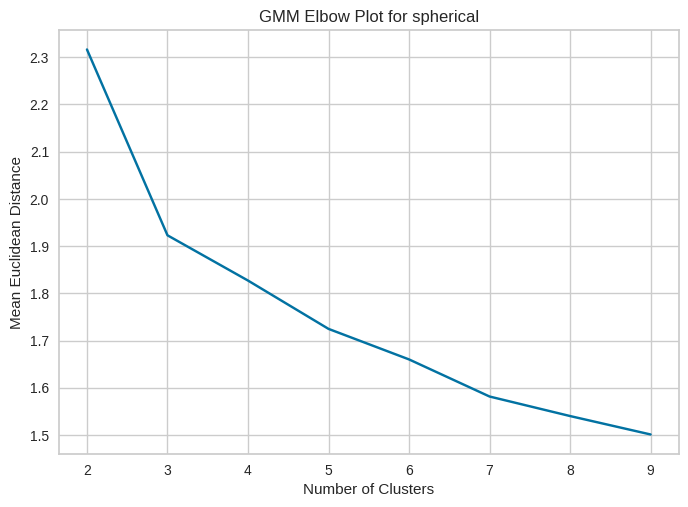

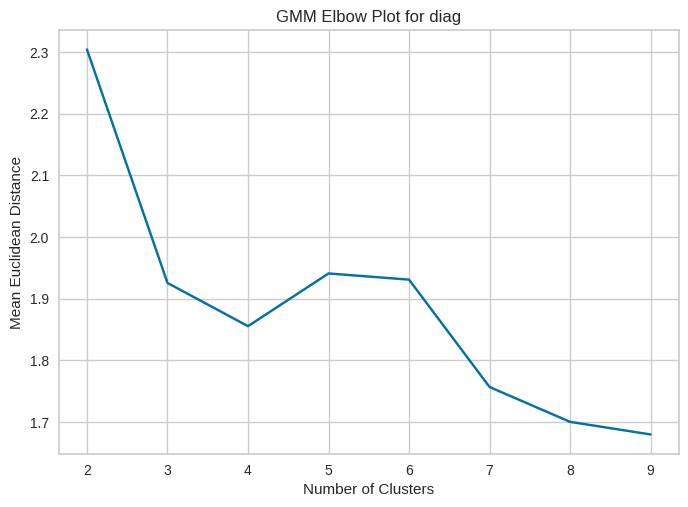

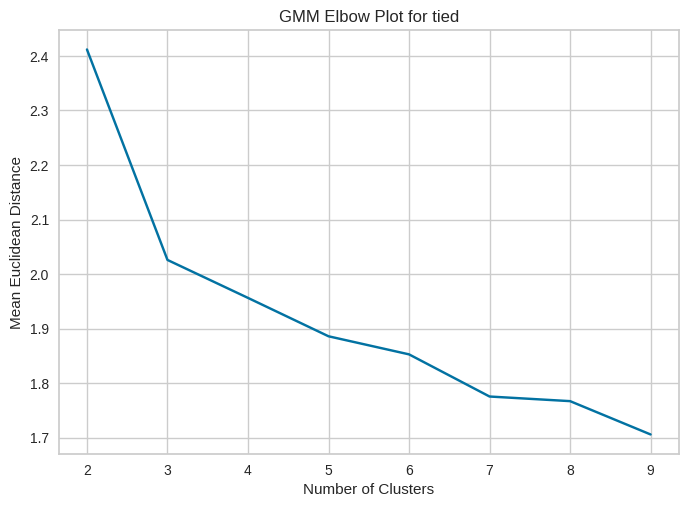

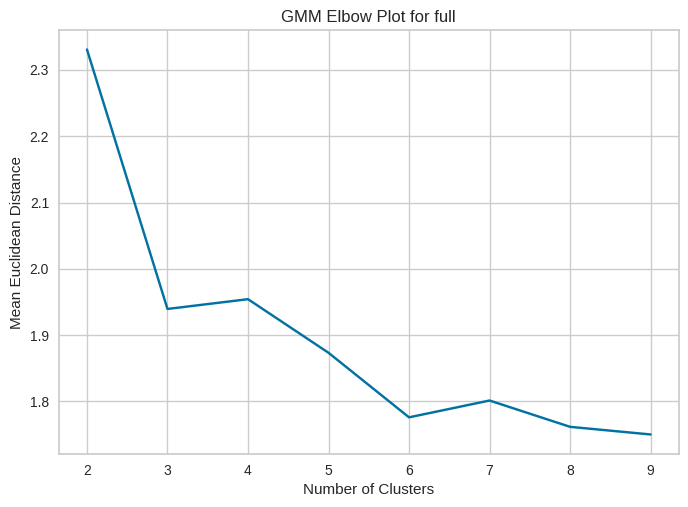

{'spherical': 7, 'diag': 7, 'tied': 7, 'full': 7}


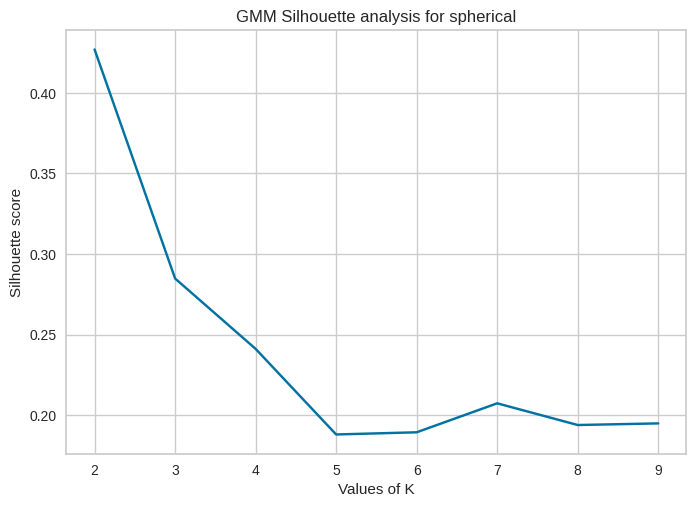

Best K: 2


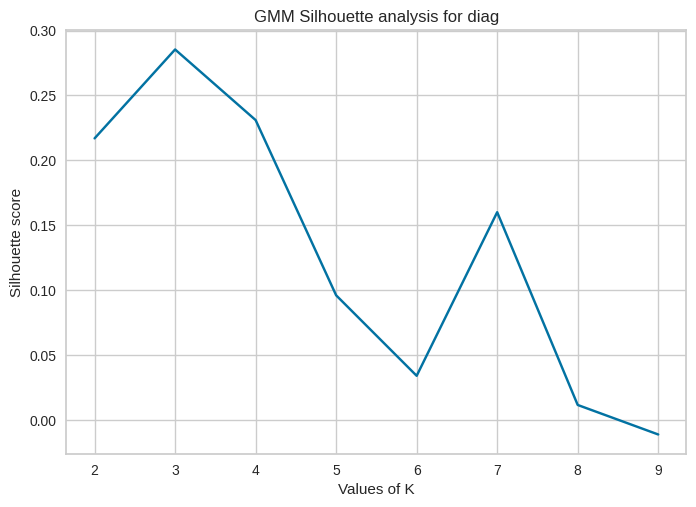

Best K: 3


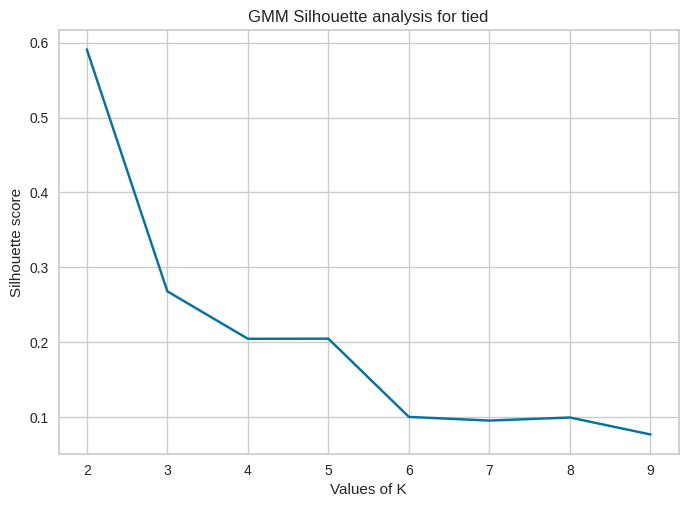

Best K: 2


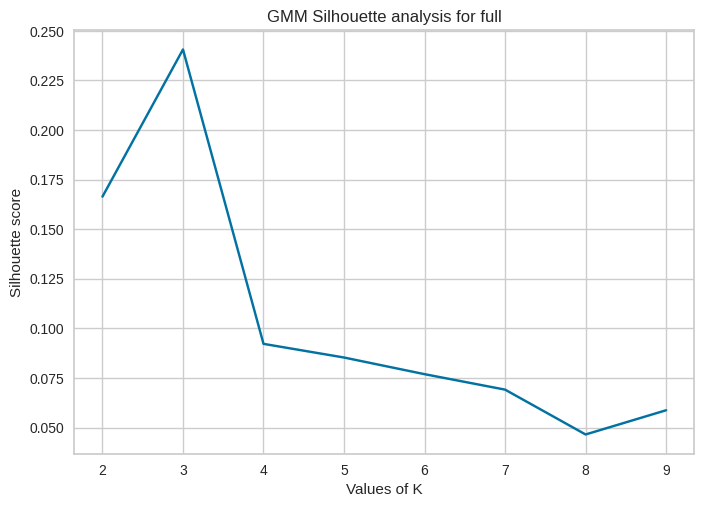

Best K: 3
{'spherical': 2, 'diag': 3, 'tied': 2, 'full': 3}


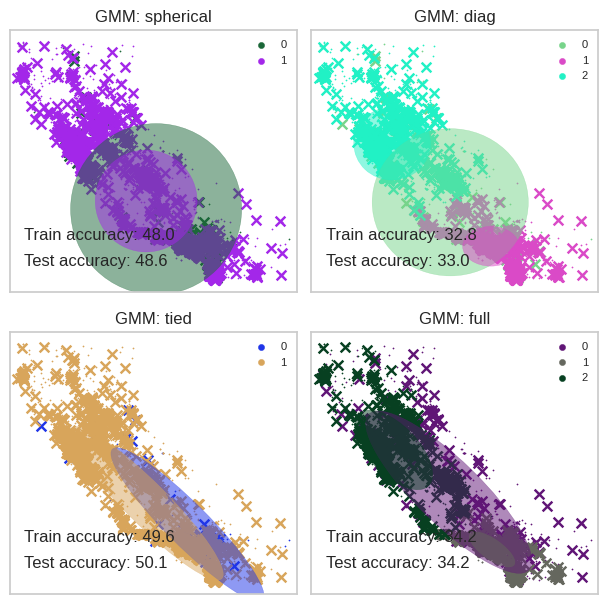

In [176]:
housing_gmm_est = gmm_plots(X_data=X_housing,y_data=y_housing,max_iter=2000,max_cluster=10,text_pos=[0.2,0.1])

In [177]:
gmm_y_housing = housing_gmm_est[2].predict(X_housing) # tied method produces lowest test error

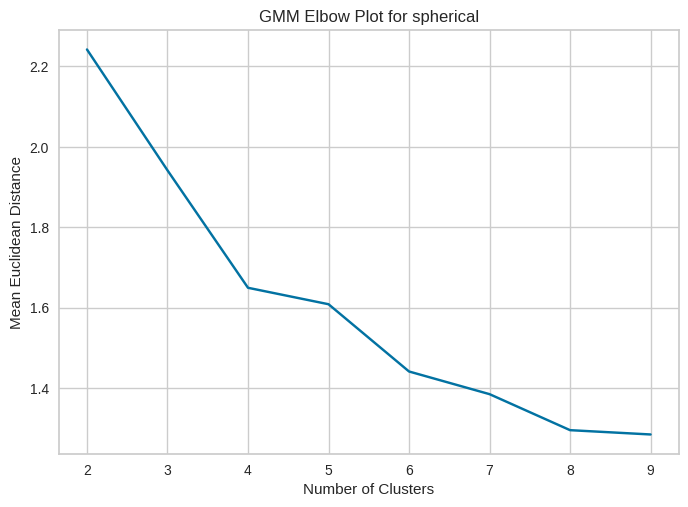

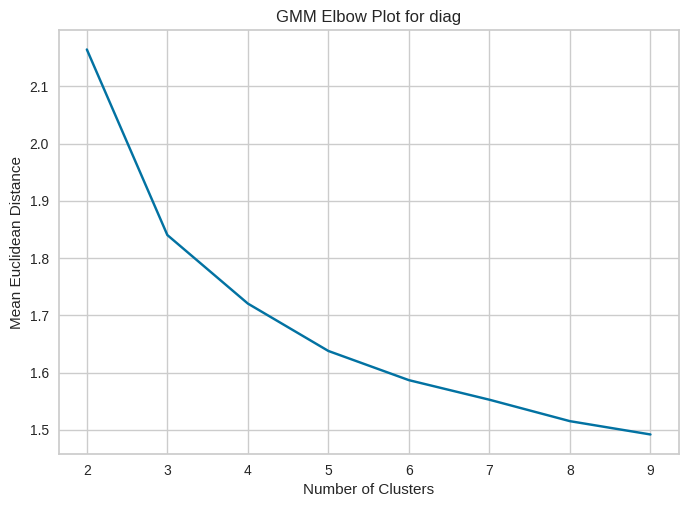

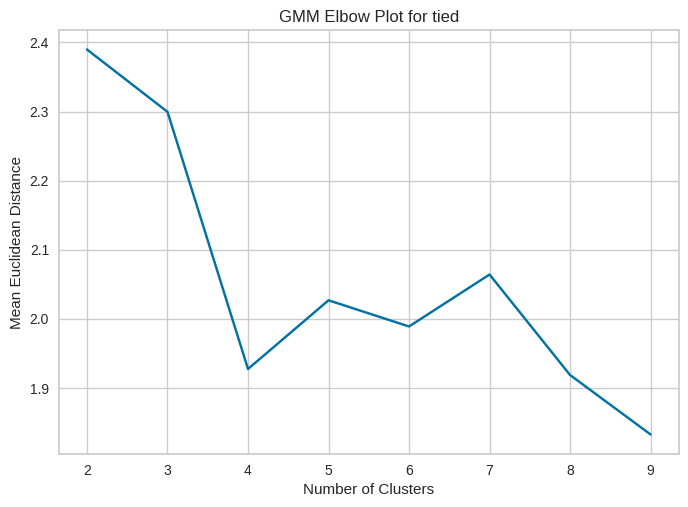

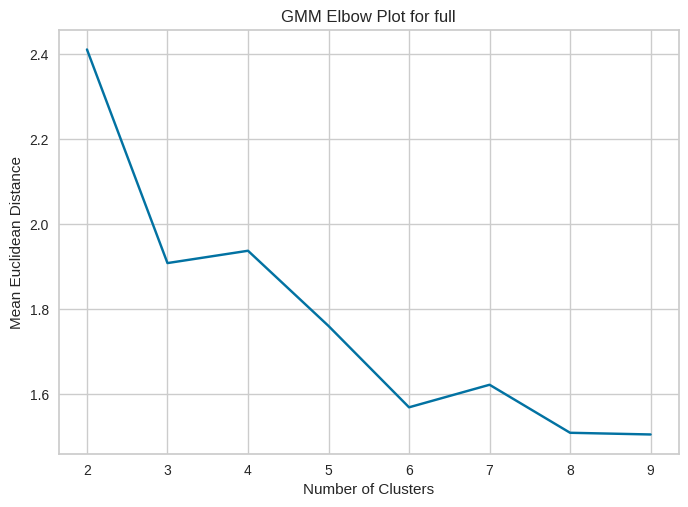

{'spherical': 7, 'diag': 7, 'tied': 7, 'full': 7}


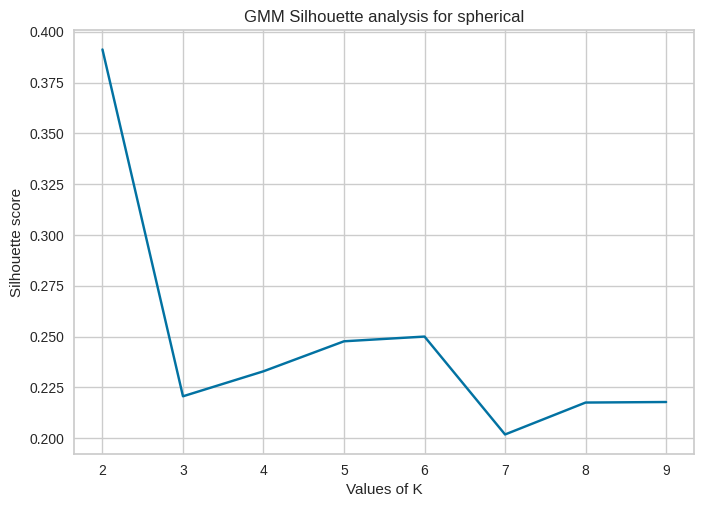

Best K: 2


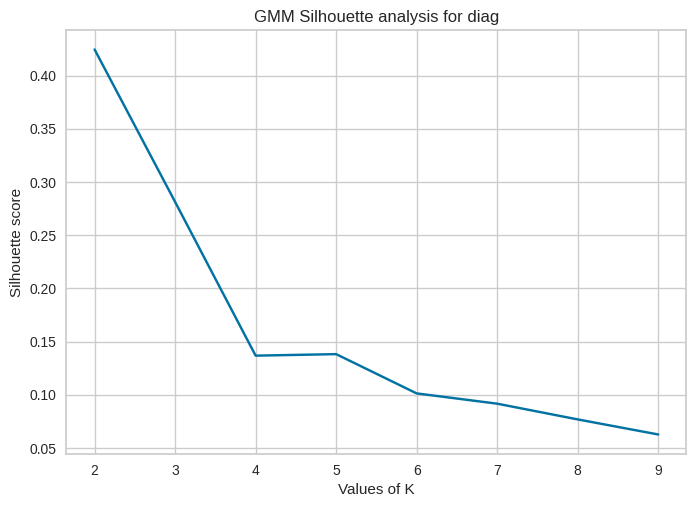

Best K: 2


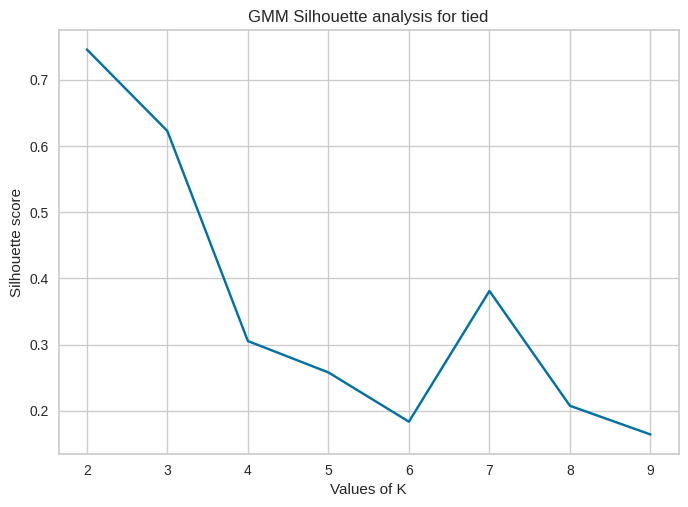

Best K: 2


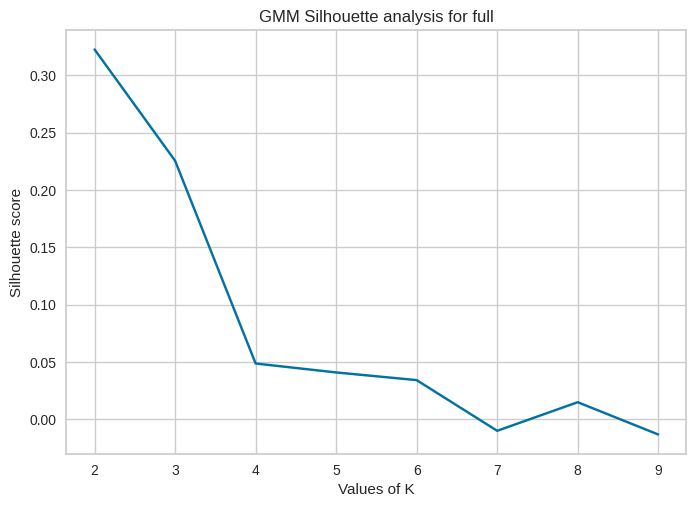

Best K: 2
{'spherical': 2, 'diag': 2, 'tied': 2, 'full': 2}


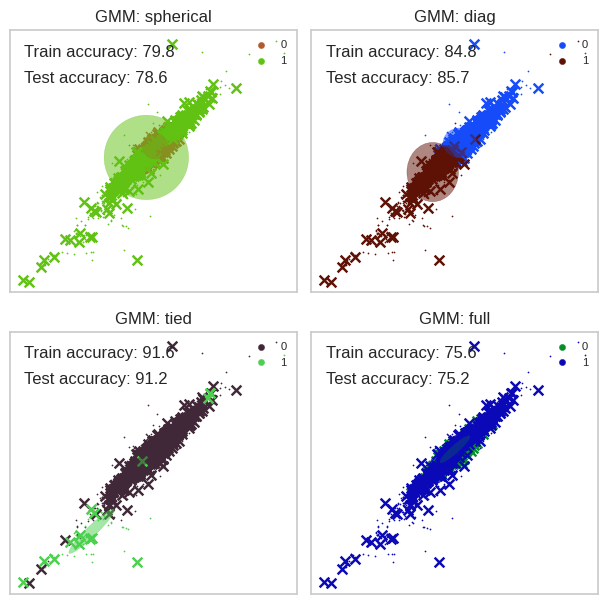

In [178]:
bankrupt_gmm_est = gmm_plots(X_data=X_bankrupt,y_data=y_bankrupt,max_iter=500,max_cluster=10,text_pos=[0.9,0.8])

In [228]:
def kmeans_plots(X_data,y_data,max_iter,max_cluster,text_pos):
    # determine optimal cluster number using elbow curve for each covariance type
    X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.2, stratify=y_data, random_state=42)
    X_train = pd.DataFrame(X_train)
    X_test = pd.DataFrame(X_test)

    def elbow_report(X,alg_type,max_iter,max_cluster):
        meandist = []
        n_clusters = range(2,max_cluster)
        for n_cluster in n_clusters:
            kmeans = KMeans(n_clusters=n_cluster,algorithm=alg_type,random_state=42,n_init='auto')
            kmeans.fit(X)
            dist_sum = sum(
                np.min(
                  cdist(X, kmeans.cluster_centers_, metric='euclidean'),
                  axis=1
                ) / X.shape[0]
              )
            meandist.append(dist_sum)
        plt.plot(n_clusters,meandist,'bx-')
        plt.xlabel('Number of Clusters')
        plt.ylabel('Mean Euclidean Distance')
        plt.title('KMeans Elbow Plot for '+alg_type)
        plt.show()
        return meandist

    elbow_cluster_dict = {"lloyd":0, "elkan":0}
    for alg_type in ["lloyd", "elkan"]:
        meandist = elbow_report(X=X_train,alg_type=alg_type,max_iter=max_iter,max_cluster=max_cluster)
        elbow_cluster_dict[alg_type] = np.argmin(meandist)

    print(elbow_cluster_dict)

    def sillhoutte_report(X,alg_type,max_iter,max_cluster):
        sil_list = []
        n_clusters = range(2,max_cluster)
        for n_cluster in n_clusters:
            kmeans = KMeans(n_clusters=n_cluster,algorithm=alg_type,random_state=42,n_init='auto')
            kmeans.fit(X)
            sil_score = silhouette_score(X, kmeans.predict(X))
            sil_list.append(sil_score)
        plt.plot(n_clusters,sil_list,'bx-')
        plt.xlabel('Values of K')
        plt.ylabel('Silhouette score')
        plt.title('KMeans Silhouette analysis for '+alg_type)
        _ = plt.xticks(np.arange(2,max_cluster))
        plt.show()

        print(f"Best K: {np.argmax(sil_list)+2}")
        return sil_list


    sil_cluster_dict = {"lloyd":0, "elkan":0}
    for alg_type in ["lloyd", "elkan"]:
        sil_list = sillhoutte_report(X=X_train,alg_type=alg_type,max_iter=max_iter,max_cluster=max_cluster)
        sil_cluster_dict[alg_type] = np.argmax(sil_list)+2

    print(sil_cluster_dict)

    # collect estimator output
    est_out =[]

    # Try KMeans using different types of algorithms, using optimal number of clusters per covariance type
    estimators = {
        alg_type: KMeans(
            n_clusters=sil_cluster_dict[alg_type], algorithm=alg_type, max_iter=max_iter, random_state=42,n_init='auto'
        )
        for alg_type in ["lloyd", "elkan"]
    }

    n_estimators = len(estimators)

    plt.figure(figsize=(3 * n_estimators // 2, 6))
    plt.subplots_adjust(
        bottom=0.01, top=0.95, hspace=0.15, wspace=0.05, left=0.01, right=0.99
    )


    for index, (name, estimator) in enumerate(estimators.items()):

        # Train the other parameters using the EM algorithm.
        estimator.fit(X_train)
        est_out.append(estimator)
        y_train_pred = estimator.predict(X_train)
        y_test_pred = estimator.predict(X_test)

        h = plt.subplot(2, n_estimators // 2, index + 1)
        colors = []
        for i in range(sil_cluster_dict[estimator.algorithm]):
            colors.append('#%06X' % randint(0, 0xFFFFFF))

        for n, color in enumerate(colors):
            data = pd.DataFrame(X_train)[y_train_pred == n]
            plt.scatter(
                data.iloc[:, 0], data.iloc[:, 1], s=0.8, color=color, label=n
            )
        # Plot the test data with crosses
        for n, color in enumerate(colors):
            data = pd.DataFrame(X_test)[y_test_pred == n]
            plt.scatter(data.iloc[:, 0], data.iloc[:, 1], marker="x", color=color)

        train_accuracy = np.mean(y_train_pred.ravel() == y_train.ravel()) * 100
        plt.text(0.05, text_pos[0], "Train accuracy: %.1f" % train_accuracy, transform=h.transAxes)

        test_accuracy = np.mean(y_test_pred.ravel() == y_test.ravel()) * 100
        plt.text(0.05, text_pos[1], "Test accuracy: %.1f" % test_accuracy, transform=h.transAxes)

        plt.xticks(())
        plt.yticks(())
        title = 'KMeans: '+name
        plt.title(title)

        lgnd = plt.legend(scatterpoints=1, loc="upper right", prop=dict(size=8))
        for i in range(len(colors)):
            lgnd.legend_handles[i]._sizes = [20]

    plt.show()

    return est_out

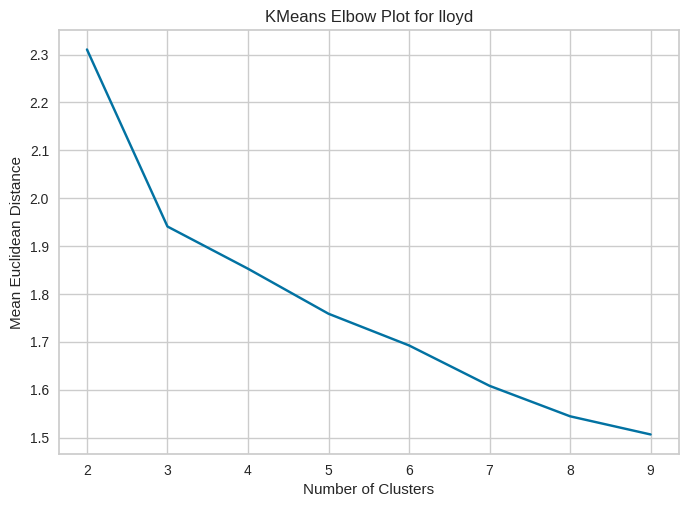

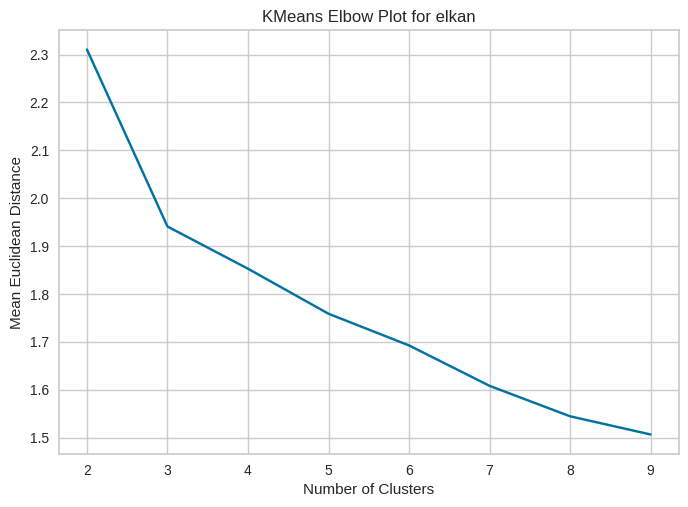

{'lloyd': 7, 'elkan': 7}


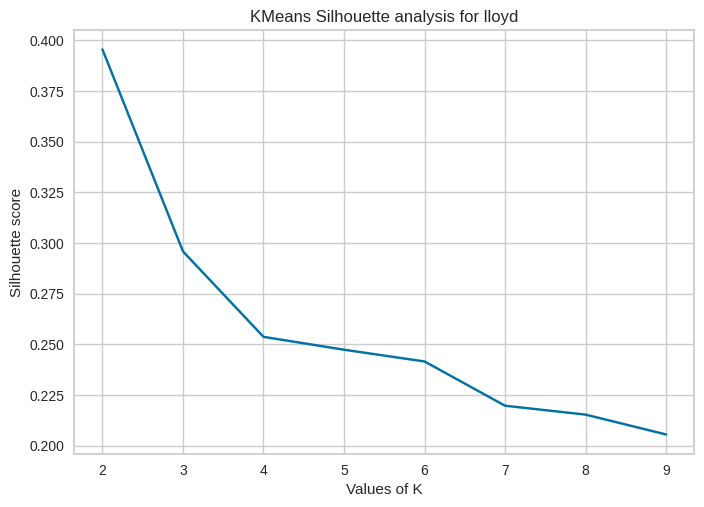

Best K: 2


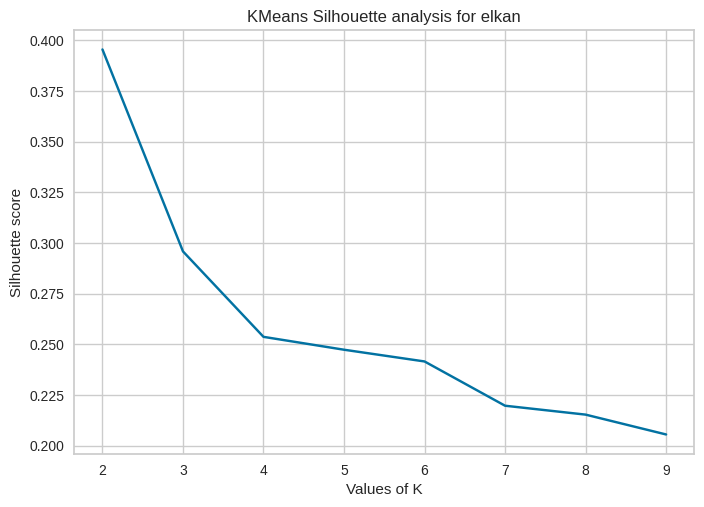

Best K: 2
{'lloyd': 2, 'elkan': 2}


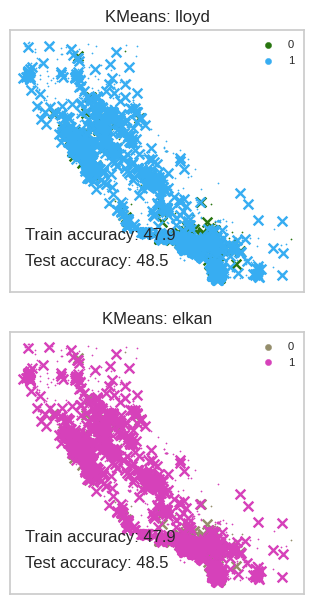

In [180]:
housing_kmeans_est = kmeans_plots(X_data=X_housing,y_data=y_housing,max_iter=3000,max_cluster=10,text_pos=[0.2,0.1])

In [181]:
kmeans_y_housing = housing_kmeans_est[0].predict(X_housing)

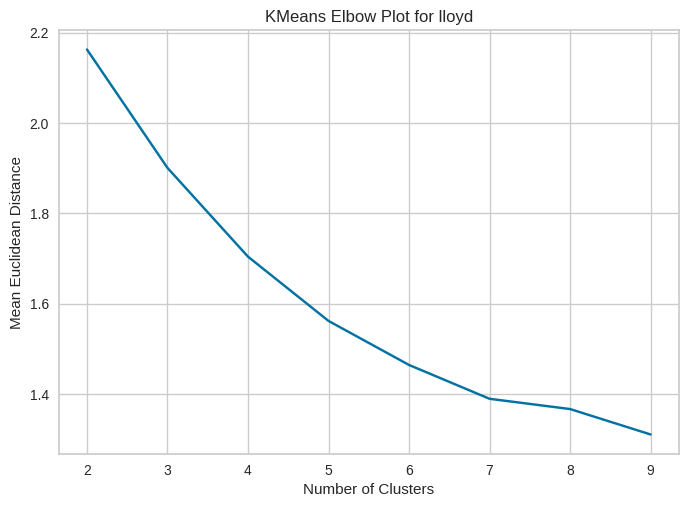

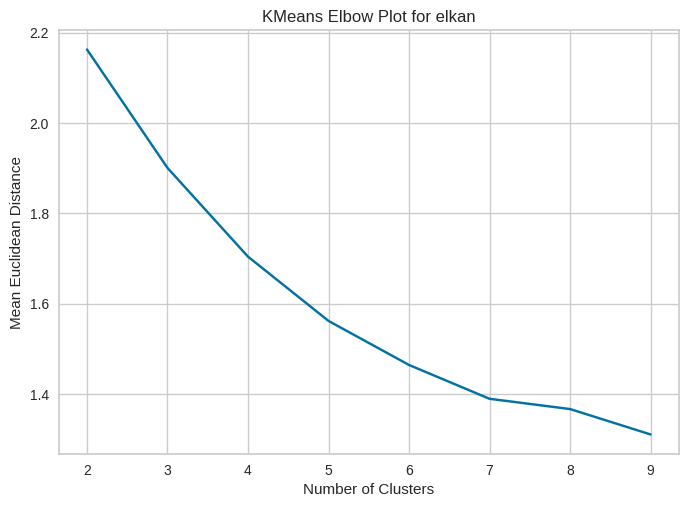

{'lloyd': 7, 'elkan': 7}


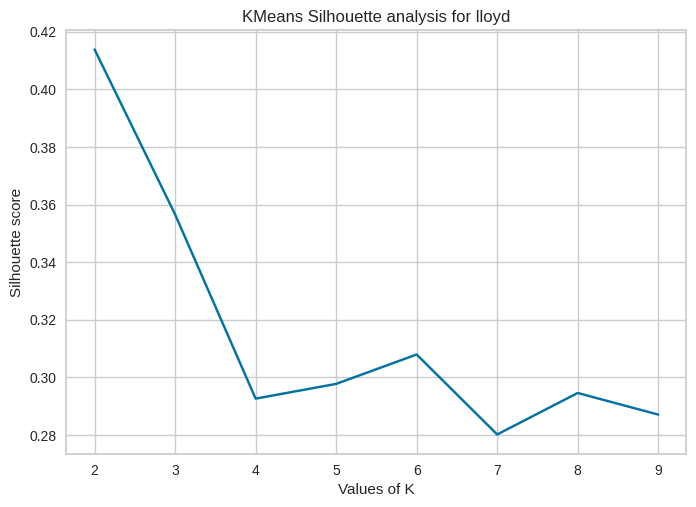

Best K: 2


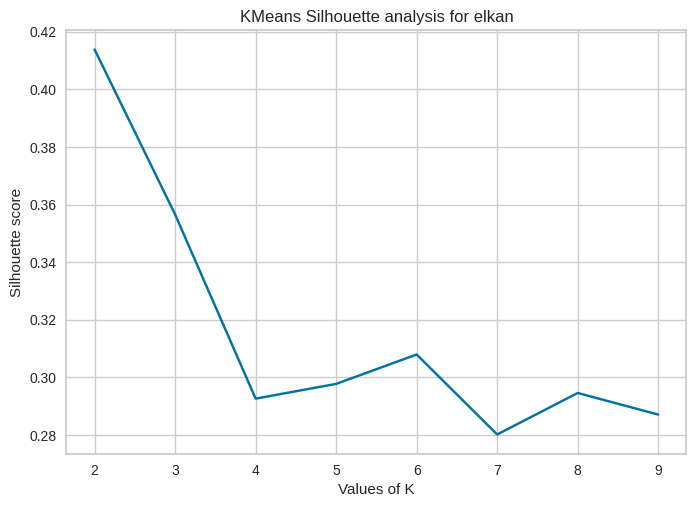

Best K: 2
{'lloyd': 2, 'elkan': 2}


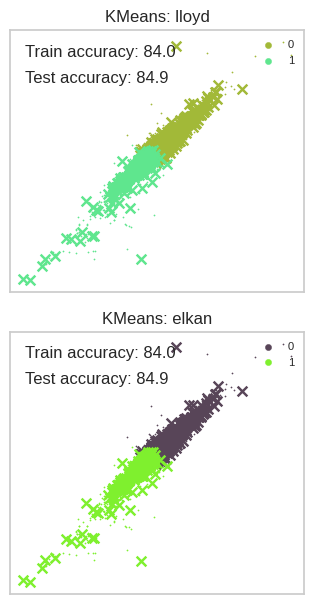

In [182]:
kmeans_bankrupt_est = kmeans_plots(X_data=X_bankrupt,y_data=y_bankrupt,max_iter=2000,max_cluster=10,text_pos=[0.9,0.8])

# Dimensionality Reduction Algorithms

Linear:
- PCA
- ICA
- Randomized Projections

Non-linear:
- Manifold Learning Algorithm of Your Choice


For PCA, take a look at the distribution of eigenvalues for choosing the number of components. You may take this literally and look at the raw eigenvalues and corresponding eigenvectors or use a surrogate metric like explained variance.



In [183]:
def pca_plot(n_components,X,y):
    pca = PCA(n_components=n_components,random_state=42)
    components = pca.fit_transform(X)
    labels = {
        str(i): f"PC {i+1} ({var:.1f}%)"
        for i, var in enumerate(pca.explained_variance_ratio_ * 100)
        }
    fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(components.shape[1]),
    color=pd.DataFrame(y).iloc[:,0]
        )
    fig.update_traces(diagonal_visible=False)
    fig.show()
    print("Total Variance Explained: ", sum(pca.explained_variance_ratio_))
    return components

In [184]:
pca_housing = pca_plot(n_components=5,X=X_housing,y=y_housing)

Total Variance Explained:  0.9526824290800577


In [185]:
pca_bankrupt = pca_plot(n_components=5,X=X_bankrupt,y=y_bankrupt)

Total Variance Explained:  0.9906832890675369


For ICA, look at kurtosis for choosing the number of components. You may look at the raw kurtosis values of each components or take an average and look into maximizing this absolute average to choose the appropriate number of components. If you're feeling more adventurous, there's ways to filter out a subset of components and project only the ones you care about!

Elbow plots for kurtosis?

Fit FastICA with # of component ranging from 1 to # of features .

Find the average kurtosis across components (in the transformed/reduced data)

Find the # of components that has the maximum average kurtosis

In [247]:
# https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.FastICA.html

def ica_plot(max_cluster,y,X,max_iter):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
    X_train = pd.DataFrame(X_train)
    X_test = pd.DataFrame(X_test)

    def elbow_report(X,max_iter,max_cluster):
        av_kurtosis = []
        n_clusters = range(2,max_cluster)
        for n_cluster in n_clusters:
            ica = FastICA(n_components=n_cluster,random_state=42,whiten='unit-variance',max_iter=max_iter)
            ica.fit(X)
            kurt = kurtosis(ica.components_).mean()
            av_kurtosis.append(kurt)
        plt.plot(n_clusters,av_kurtosis,'bx-')
        plt.xlabel('Number of Clusters')
        plt.ylabel('Average Kurtosis')
        plt.title('ICA DM')
        plt.show()
        return av_kurtosis

    av_kurtosis = elbow_report(X=X_train,max_iter=max_iter,max_cluster=max_cluster)
    opt_cluster = np.argmax(av_kurtosis)+2

    print(opt_cluster, av_kurtosis)

    ica = FastICA(n_components=opt_cluster,
         random_state=42,
         whiten='unit-variance',max_iter=max_iter)
    components = ica.fit_transform(X)
    print(round(kurtosis(ica.components_).mean(),2))
    labels = {
        str(i): f"IC {i+1}"
        for i, var in enumerate(ica.mean_)
        }
    fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(components.shape[1]),
    color=pd.DataFrame(y).iloc[:,0]
        )
    fig.update_traces(diagonal_visible=False)
    fig.show()
    return components

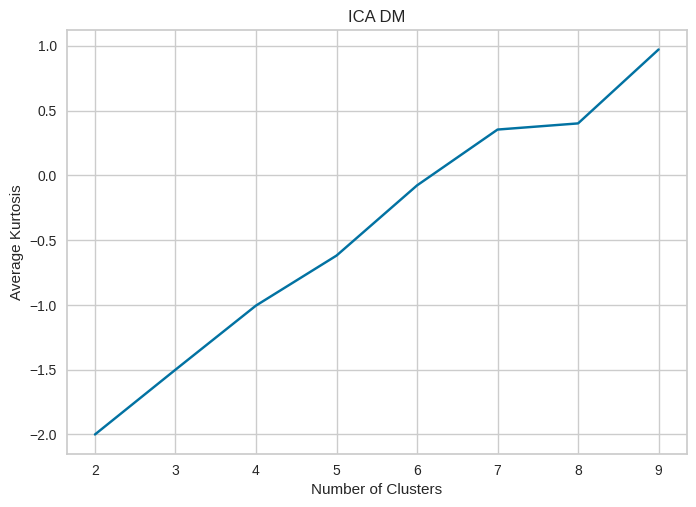

9 [-2.0, -1.5, -1.0050894007230122, -0.6193239286654594, -0.07761629078035537, 0.3533389754010629, 0.40087857633536866, 0.9714486074022788]
1.07


In [248]:
ica_housing = ica_plot(max_cluster=10,X=X_housing,y=y_housing,max_iter=1000)

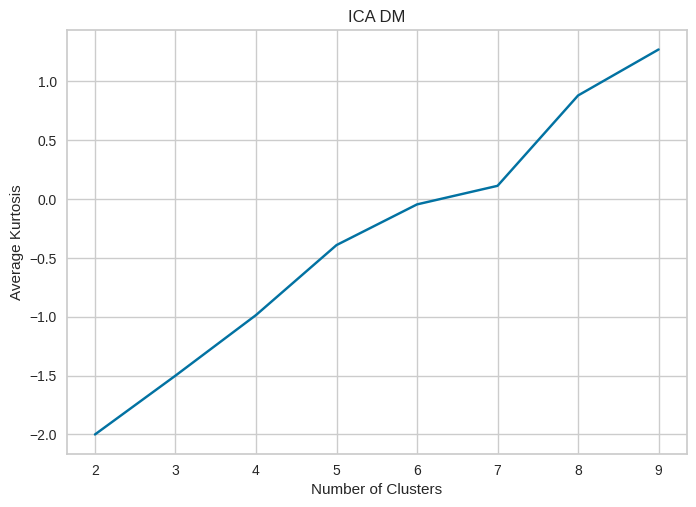

9 [-2.0, -1.5, -0.9853512155097277, -0.3907186548862918, -0.0448889944303227, 0.11291056579119288, 0.8806084464963357, 1.2715273493849177]
1.4


In [249]:
ica_bankrupt = ica_plot(max_cluster=10,X=X_bankrupt,y=y_bankrupt,max_iter=1000)

For RP, look at reconstruction error for choosing the number of components. As a hint, you can take the reconstruction error of the original and reconstructed data by taking the pseudo inverse of the projection matrix. That should be available to you via the SKLearn API.

Consider elbow plots of reconstruction error?

In [250]:
def grp_plot(max_cluster,X,y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
    X_train = pd.DataFrame(X_train,columns=X.columns)
    X_test = pd.DataFrame(X_test)

    def rec_error_calc(grp,X_new):
        X_new_inversed = grp.inverse_transform(X_new)
        X_new_again = grp.transform(X_new_inversed)
        reconstructed_data = np.dot(X_new.T, X_new_again)
        rec_error=reconstructed_data.mean()
        return rec_error

    def elbow_report(X,max_cluster):
        av_rec_error = []
        n_clusters = range(2,max_cluster)
        for n_cluster in n_clusters:
            grp = GaussianRandomProjection(n_components=n_cluster,random_state=42,compute_inverse_components=True)
            X_new = grp.fit_transform(np.array(X))
            rec_error = rec_error_calc(grp=grp,X_new=X_new)
            av_rec_error.append(rec_error)
        plt.plot(n_clusters,av_rec_error,'bx-')
        plt.xlabel('Number of Clusters')
        plt.ylabel('Reconstruction Error')
        plt.title('GRP Reconstruction Error')
        plt.show()
        return av_rec_error

    av_rec_error = elbow_report(X=X_train,max_cluster=max_cluster)
    opt_cluster = np.argmin(av_rec_error)+2

    print(opt_cluster, av_rec_error)

    grp = GaussianRandomProjection(n_components=opt_cluster,random_state=42,compute_inverse_components=True)
    components = grp.fit_transform(np.array(X))
    print(round(rec_error_calc(grp=grp,X_new=components),2))
    labels = {
        str(i): f"GRP {i+1}"
        for i, var in enumerate(range(len(components)))
        }
    fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(components.shape[1]),
    color=pd.DataFrame(y).iloc[:,0]
        )
    fig.update_traces(diagonal_visible=False)
    fig.show()
    return components

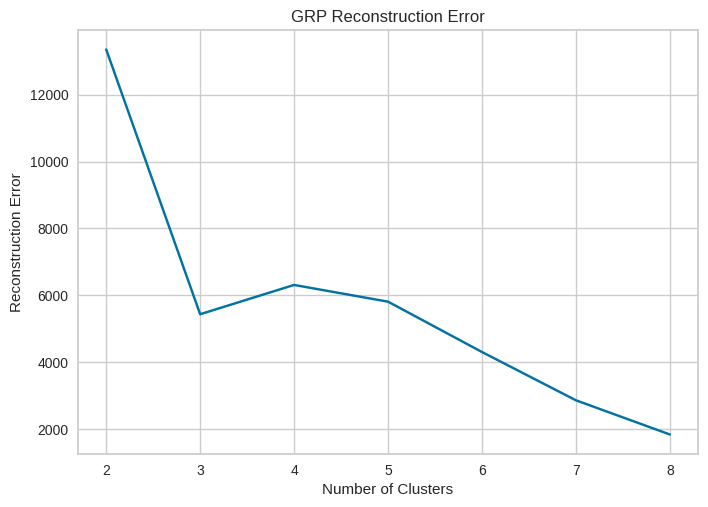

8 [13353.36991303022, 5433.909667228596, 6310.012615899571, 5809.414790113488, 4304.107314011502, 2859.6252366061685, 1837.0732949457815]
2313.22


In [251]:
grp_housing = grp_plot(max_cluster=9,X=X_housing,y=y_housing)

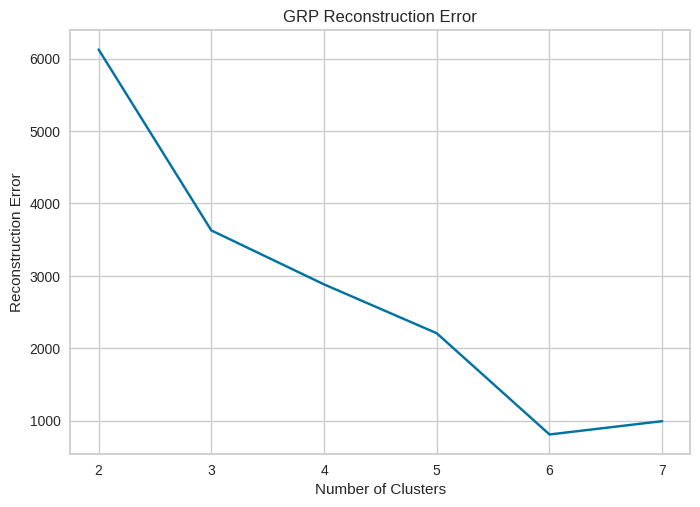

6 [6126.622457783491, 3628.2757469294575, 2882.959409751069, 2207.829311639349, 810.3637775988443, 994.1691621130211]
1045.63


In [252]:
grp_bankrupt = grp_plot(max_cluster=8,X=X_bankrupt,y=y_bankrupt)

In [271]:
from sklearn.manifold import LocallyLinearEmbedding

def lle_plot(n_neighbors,max_cluster,X,y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
    X_train = pd.DataFrame(X_train,columns=X.columns)
    X_test = pd.DataFrame(X_test)

    def elbow_report(X,max_cluster):
        av_rec_error = []
        n_clusters = range(4,max_cluster) # min of 4 clusters to prevent 2 clusters
        for n_cluster in n_clusters:
            lle = LocallyLinearEmbedding(n_neighbors=n_neighbors,n_components=n_cluster,random_state=42)
            lle.fit(X)
            rec_error = lle.reconstruction_error_
            av_rec_error.append(rec_error)
        plt.plot(n_clusters,av_rec_error,'bx-')
        plt.xlabel('Number of Clusters')
        plt.ylabel('Reconstruction Error')
        plt.title('LLE Reconstruction Error')
        plt.show()
        return av_rec_error

    av_rec_error = elbow_report(X=X_train,max_cluster=max_cluster)
    opt_cluster = np.argmin(av_rec_error)+4

    print(opt_cluster, av_rec_error)

    lle = LocallyLinearEmbedding(n_neighbors=n_neighbors,n_components=opt_cluster,random_state=42)
    components = lle.fit_transform(np.array(X))
    print(lle.reconstruction_error_)
    labels = {
        str(i): f"LLE {i+1}"
        for i, var in enumerate(range(len(components)))
        }
    fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(components.shape[1]),
    color=pd.DataFrame(y).iloc[:,0]
        )
    fig.update_traces(diagonal_visible=False)
    fig.show()
    return components

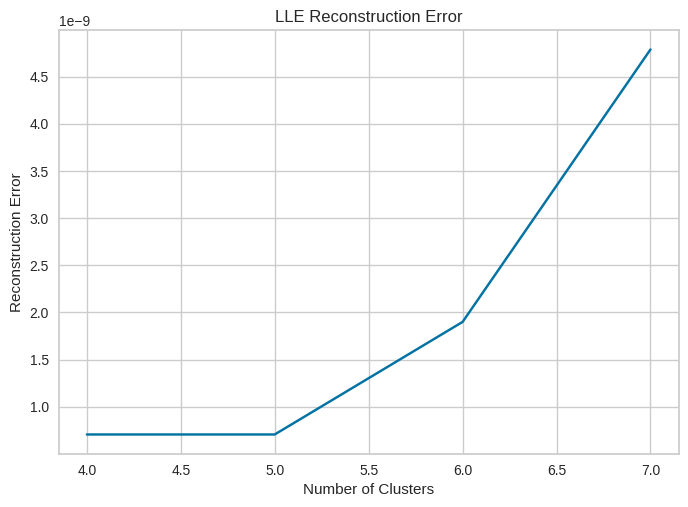

5 [7.06778401794327e-10, 7.067783994902567e-10, 1.8999608418560785e-09, 4.7877288549209785e-09]
1.999412828740862e-09


In [272]:
lle_housing = lle_plot(n_neighbors=10,max_cluster=8,X=X_housing,y=y_housing)

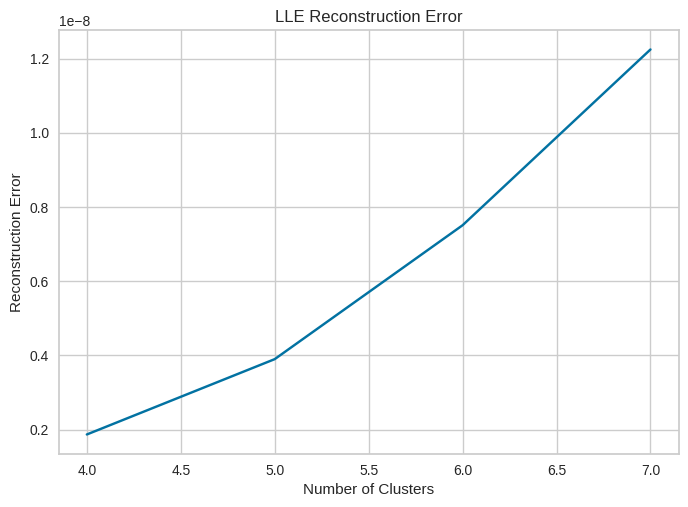

4 [1.868222442397656e-09, 3.899404058551219e-09, 7.509593214395239e-09, 1.2248705953680776e-08]
8.779468809661048e-10


In [256]:
lle_bankrupt = lle_plot(n_neighbors=10,max_cluster=8,X=X_bankrupt,y=y_bankrupt)

# Applying Clustering on Dimensionality Reduced Data

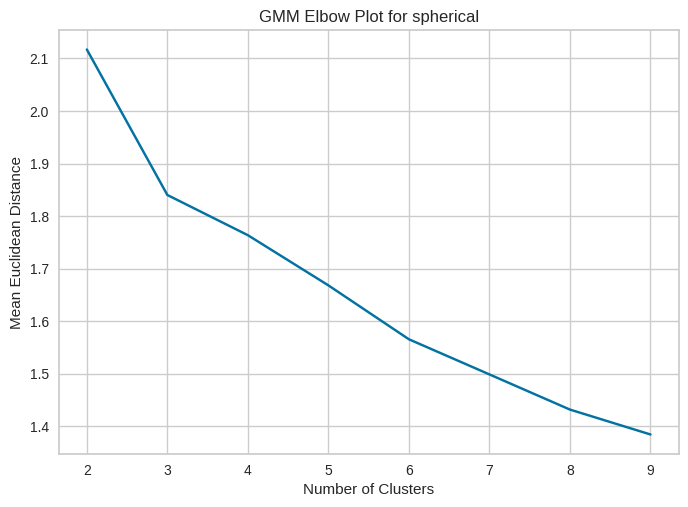

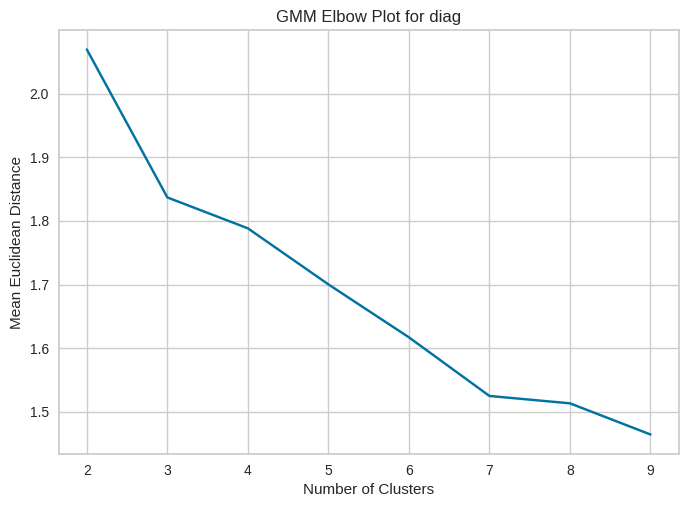

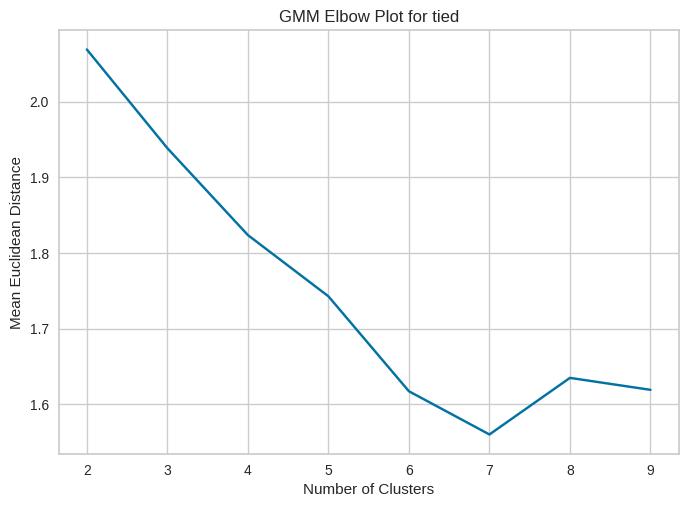

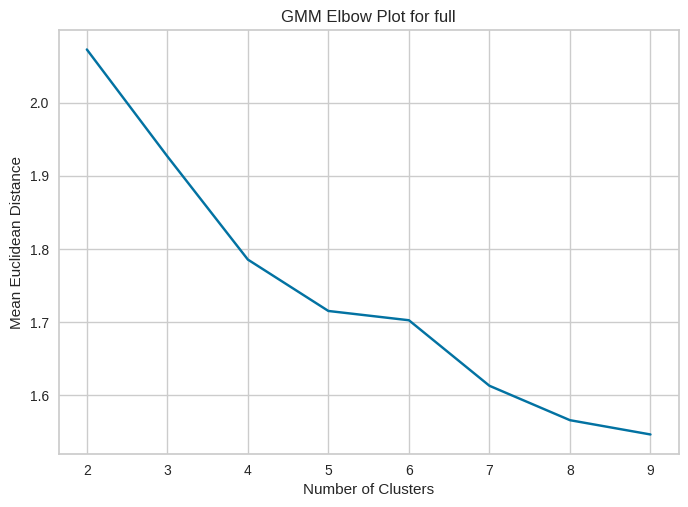

{'spherical': 7, 'diag': 7, 'tied': 5, 'full': 7}


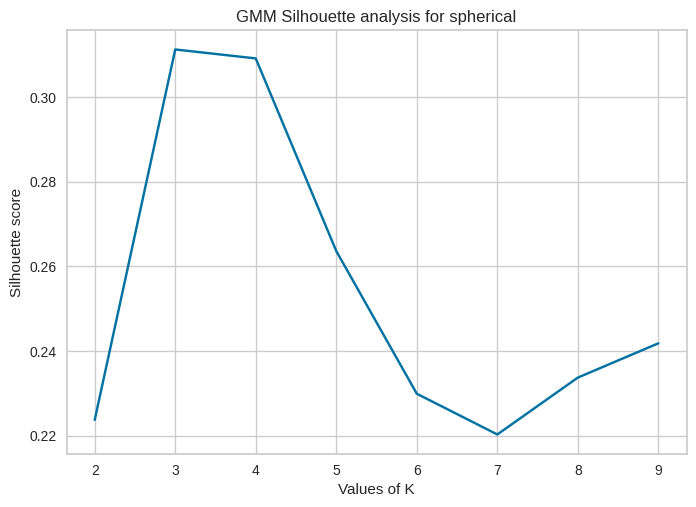

Best K: 3


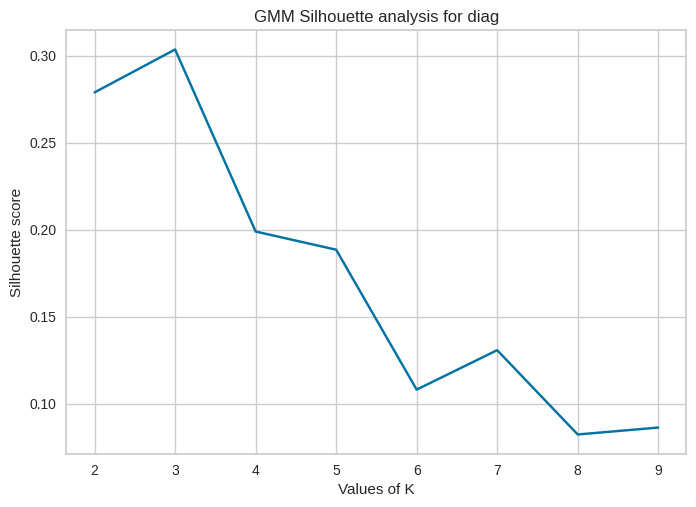

Best K: 3


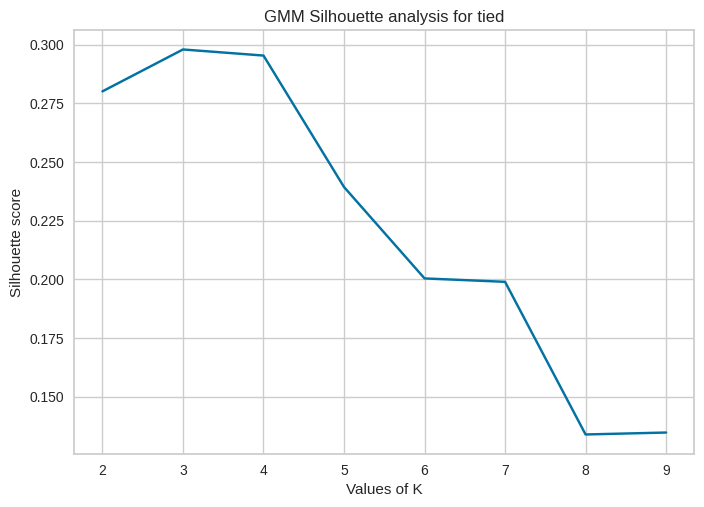

Best K: 3


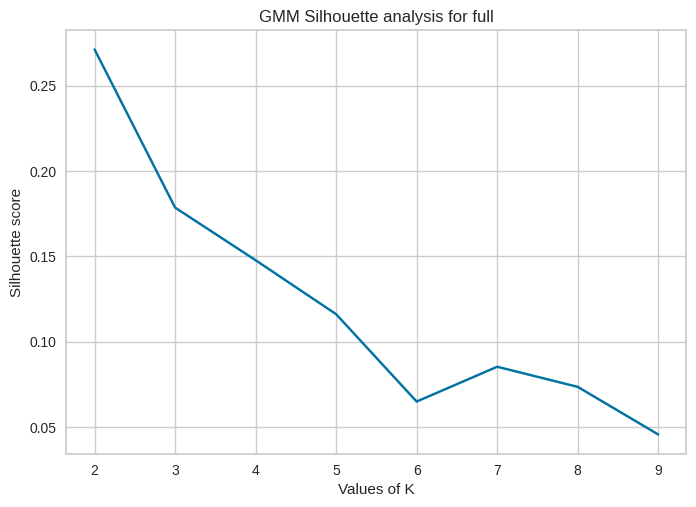

Best K: 2
{'spherical': 3, 'diag': 3, 'tied': 3, 'full': 2}


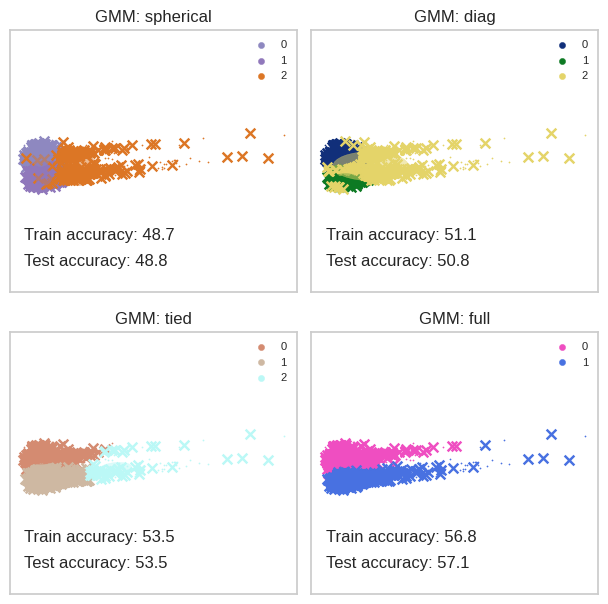

In [195]:
pca_housing_df = pd.DataFrame(pca_housing)
pca_housing_gmm_est = gmm_plots(X_data=pca_housing_df,y_data=y_housing,max_iter=2000,max_cluster=10,text_pos=[0.2,0.1])

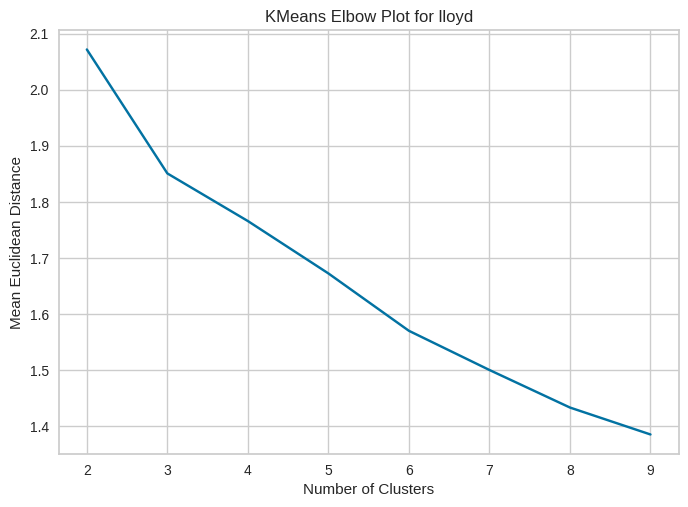

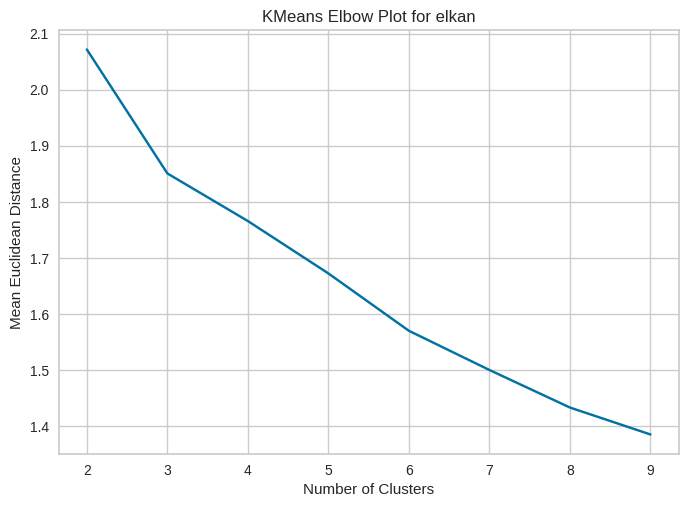

{'lloyd': 7, 'elkan': 7}


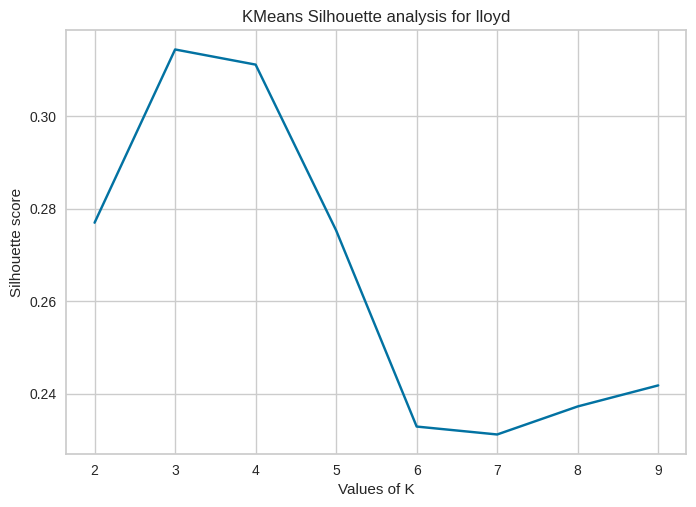

Best K: 3


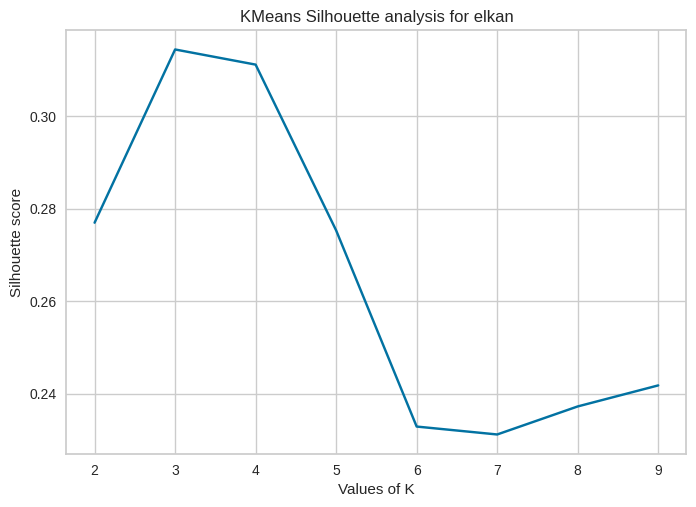

Best K: 3
{'lloyd': 3, 'elkan': 3}


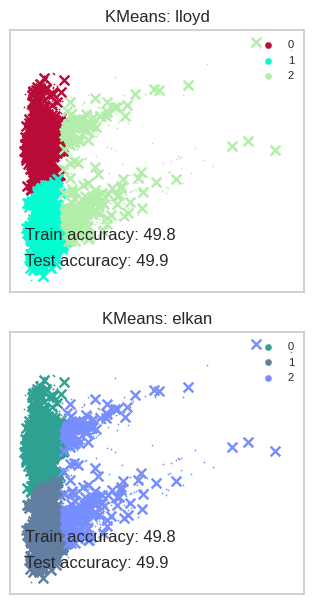

In [196]:
pca_housing_kmeans_est = kmeans_plots(X_data=pca_housing_df,y_data=y_housing,max_iter=5000,max_cluster=10,text_pos=[0.2,0.1])

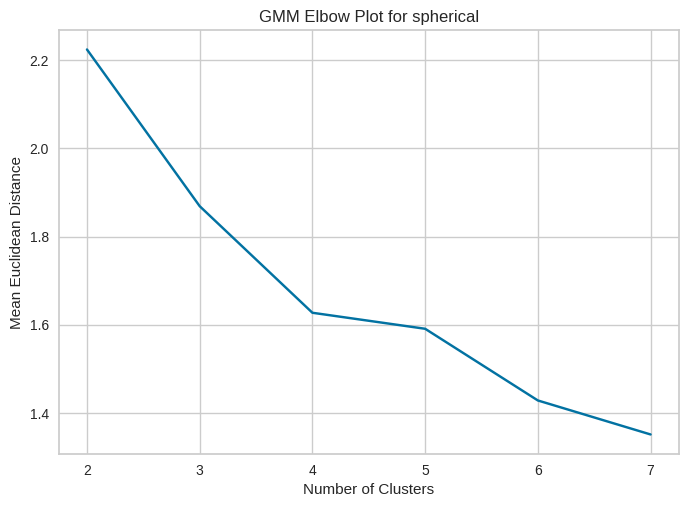

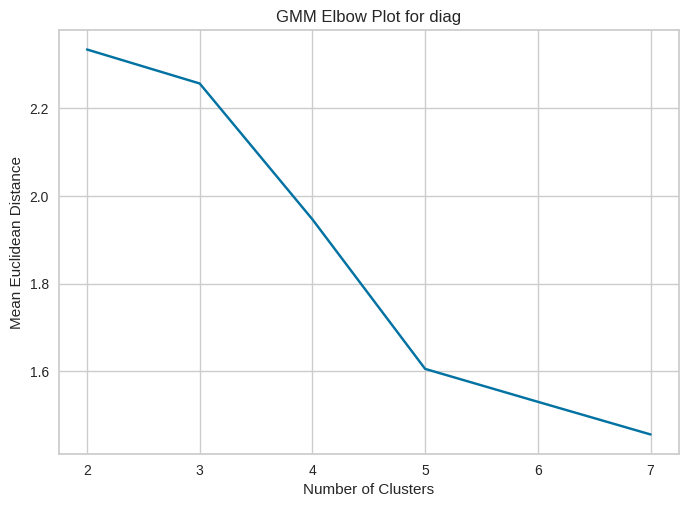

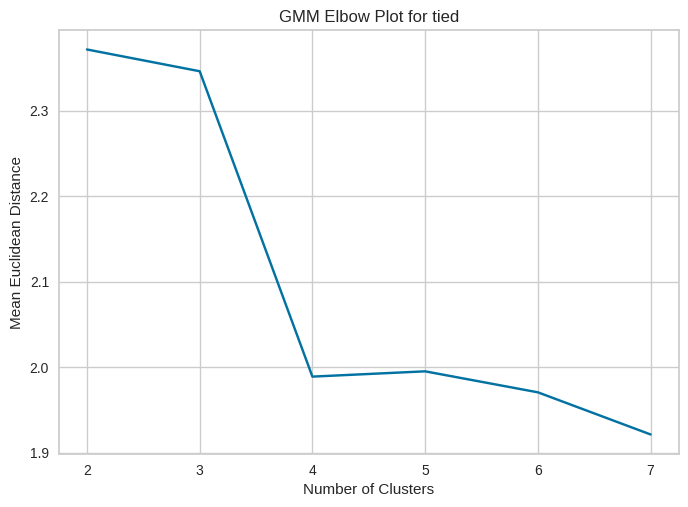

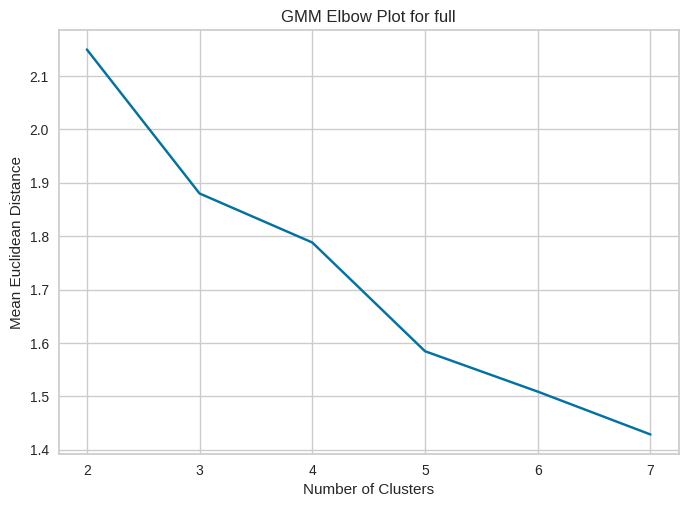

{'spherical': 5, 'diag': 5, 'tied': 5, 'full': 5}


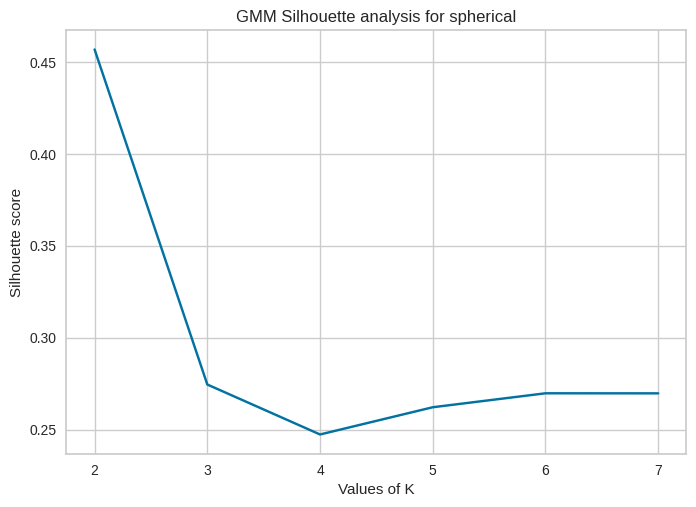

Best K: 2


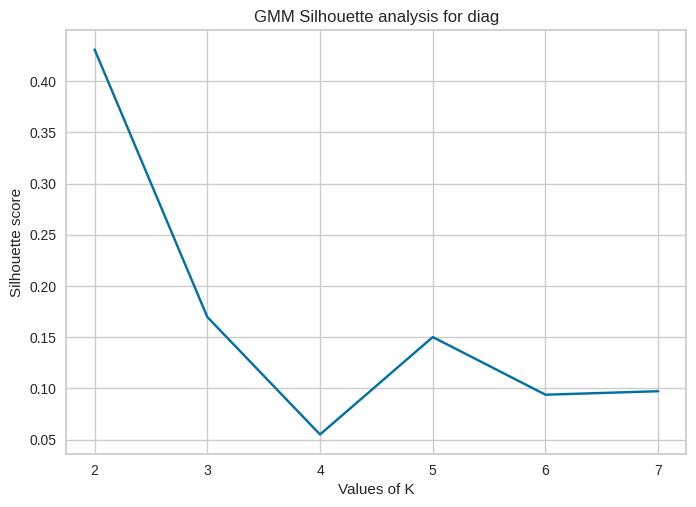

Best K: 2


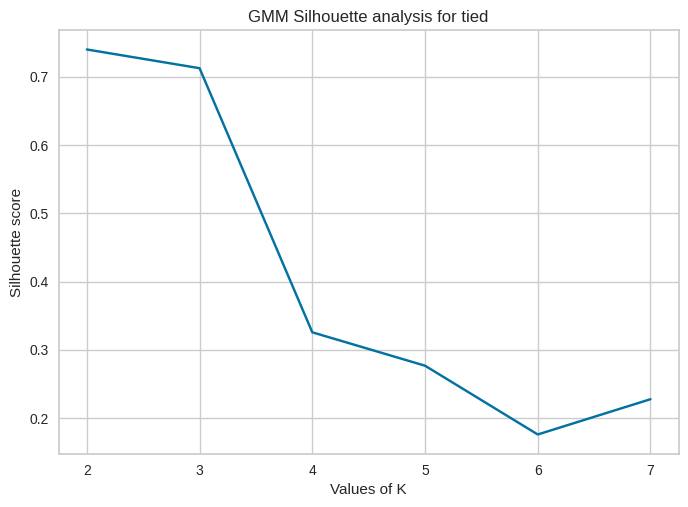

Best K: 2


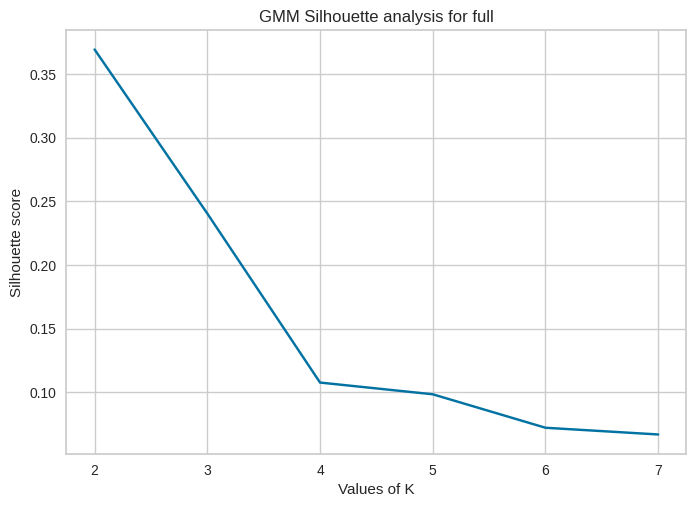

Best K: 2
{'spherical': 2, 'diag': 2, 'tied': 2, 'full': 2}


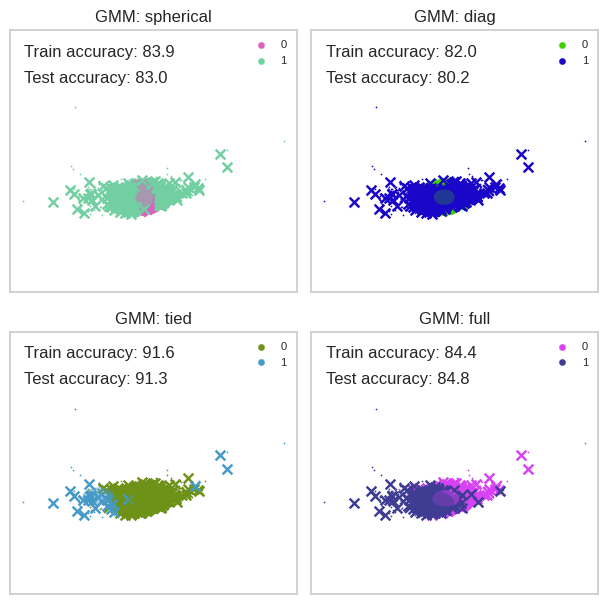

In [262]:
pca_bankrupt_df = pd.DataFrame(pca_bankrupt)
pca_bankrupt_gmm_est = gmm_plots(X_data=pca_bankrupt_df,y_data=y_bankrupt,max_iter=2000,max_cluster=8,text_pos=[0.9,0.8])

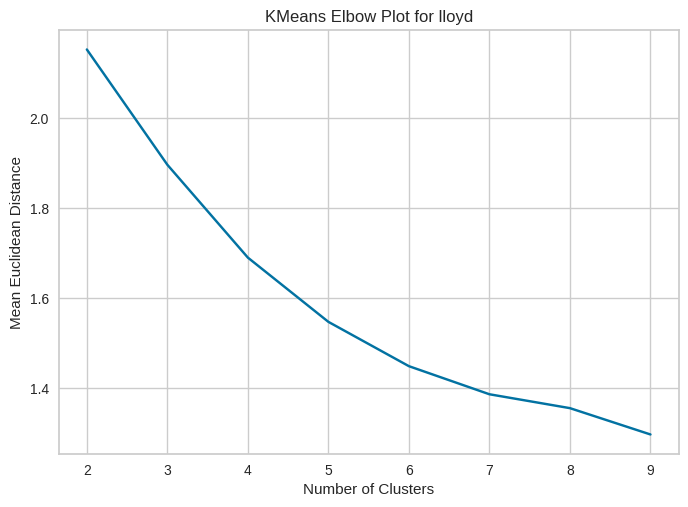

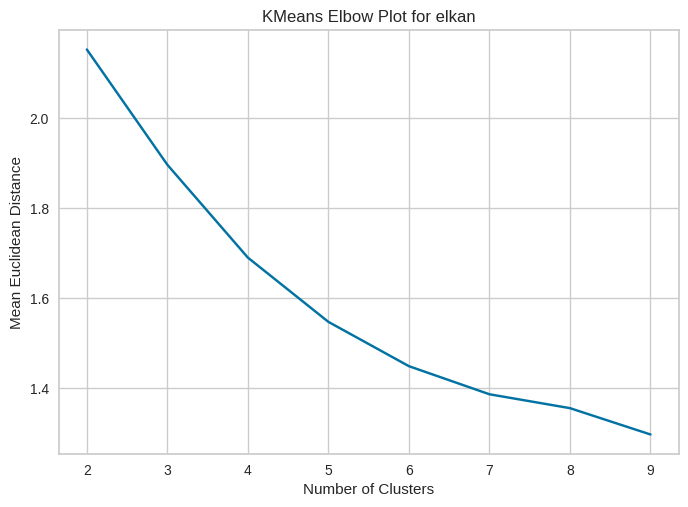

{'lloyd': 7, 'elkan': 7}


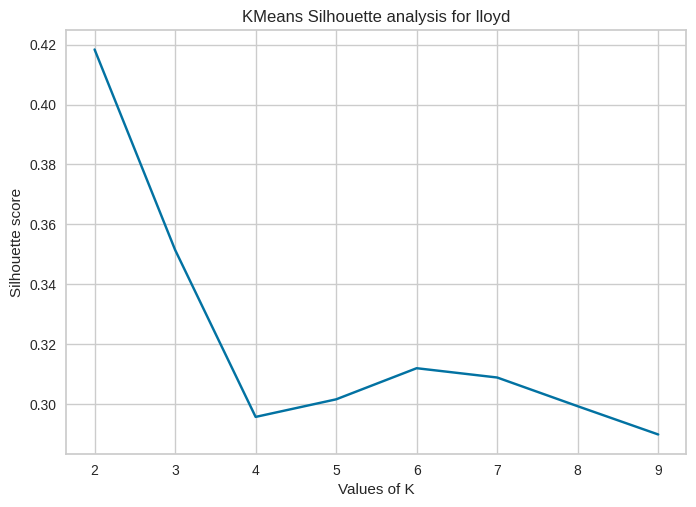

Best K: 2


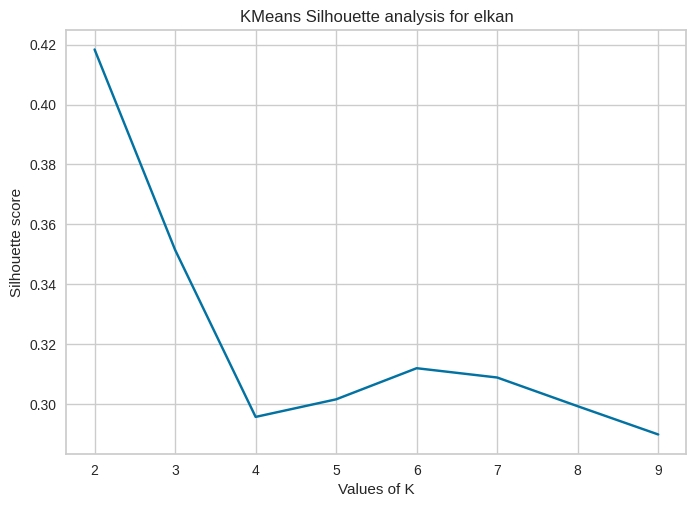

Best K: 2
{'lloyd': 2, 'elkan': 2}


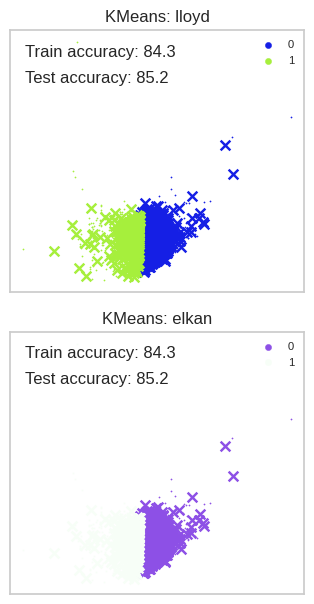

In [198]:
pca_bankrupt_kmeans_est = kmeans_plots(X_data=pca_bankrupt_df,y_data=y_bankrupt,max_iter=5000,max_cluster=10,text_pos=[0.9,0.8])

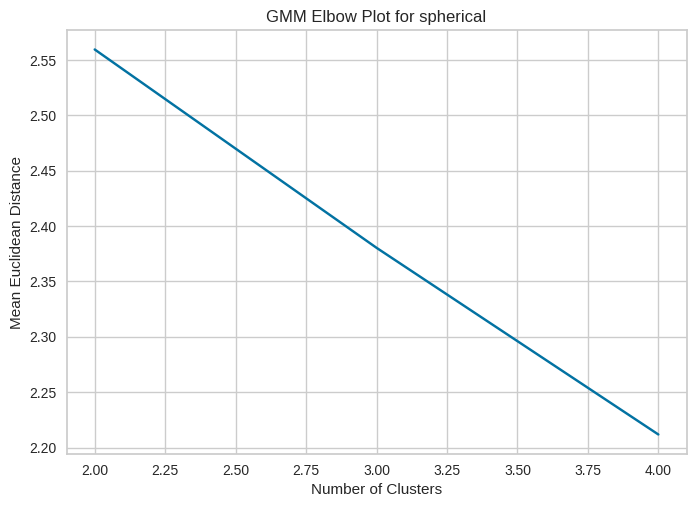

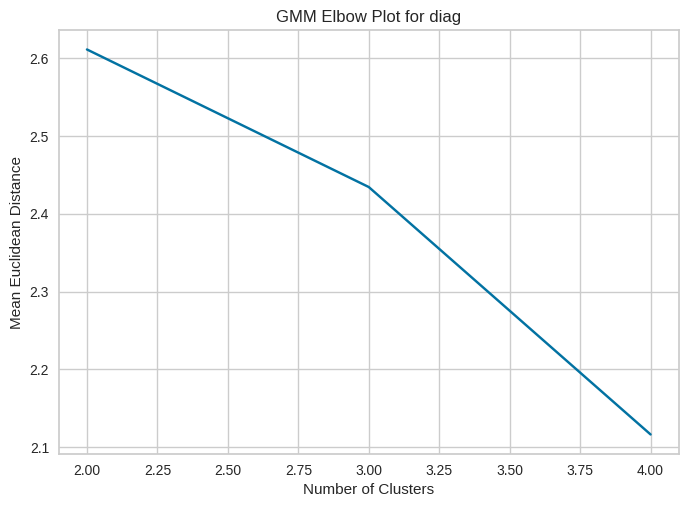

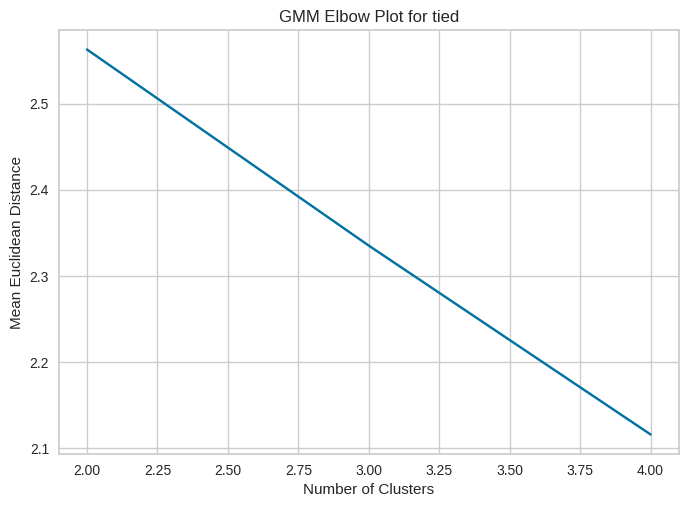

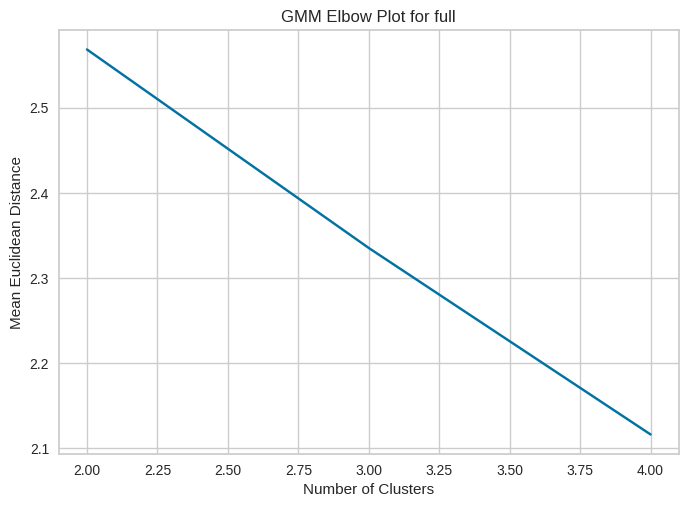

{'spherical': 2, 'diag': 2, 'tied': 2, 'full': 2}


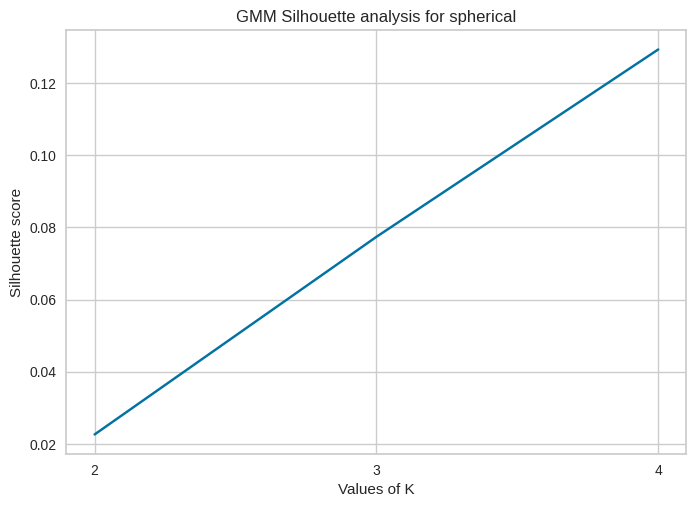

Best K: 4


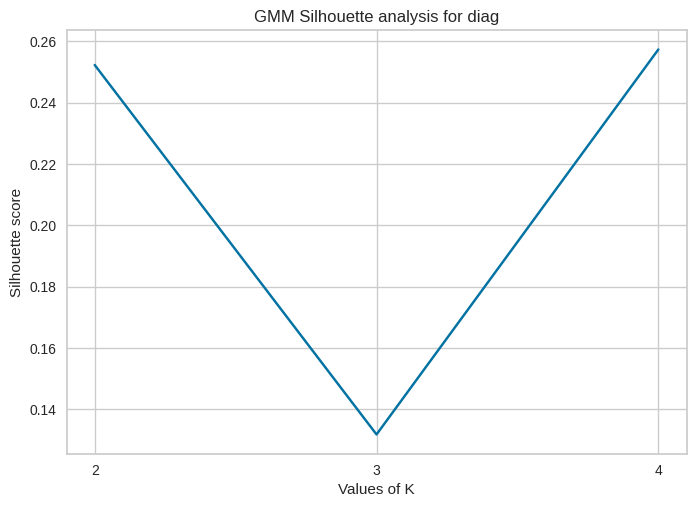

Best K: 4


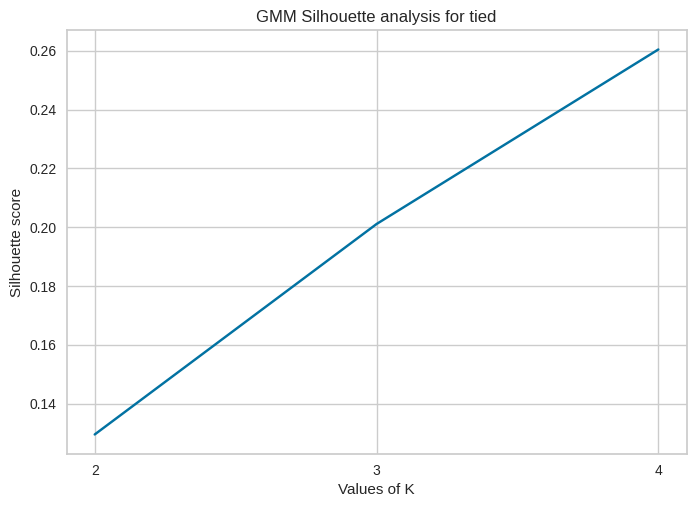

Best K: 4


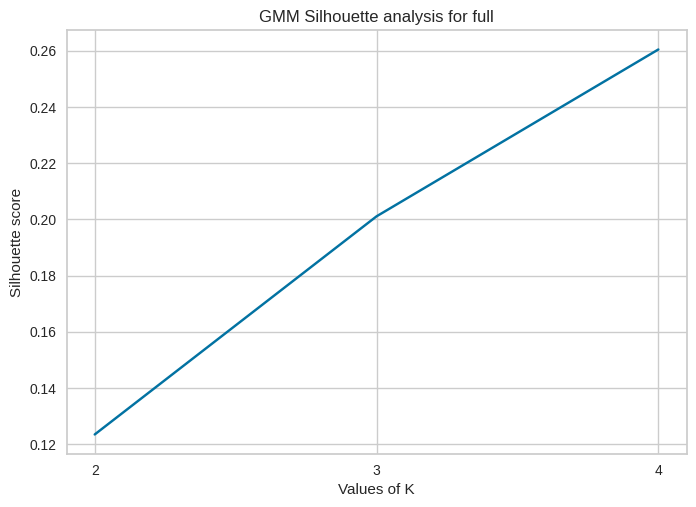

Best K: 4
{'spherical': 4, 'diag': 4, 'tied': 4, 'full': 4}


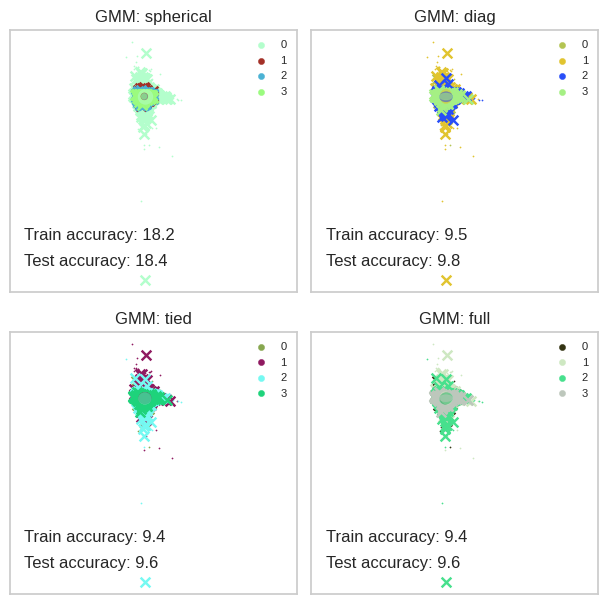

In [199]:
ica_housing_df = pd.DataFrame(ica_housing)
ica_housing_gmm_est = gmm_plots(X_data=ica_housing_df,y_data=y_housing,max_iter=2000,max_cluster=5,text_pos=[0.2,0.1])

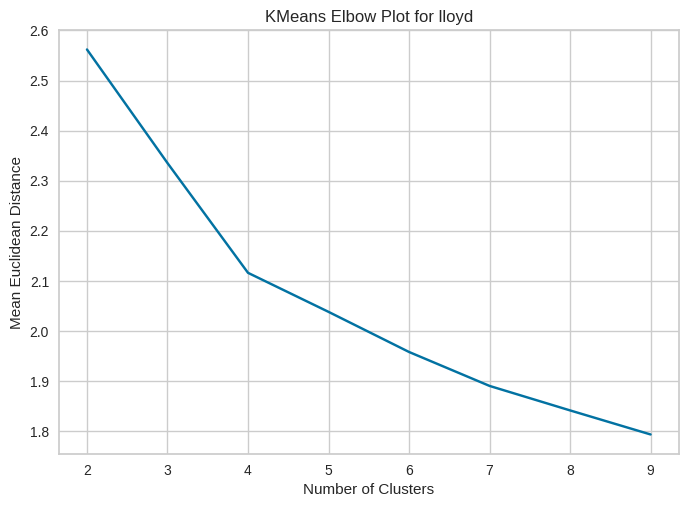

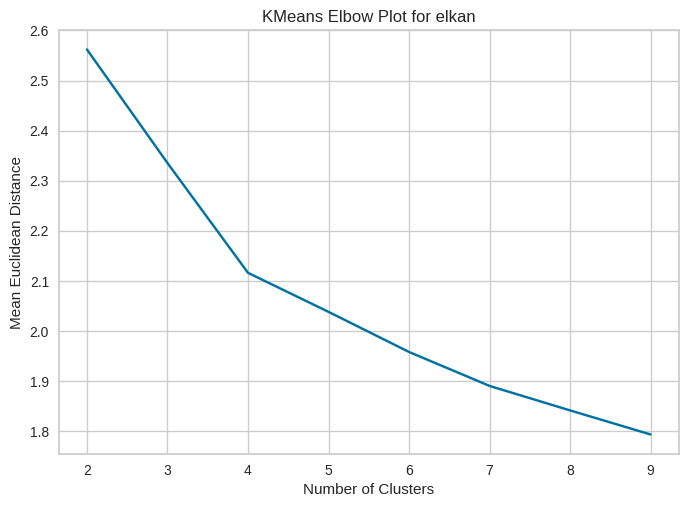

{'lloyd': 7, 'elkan': 7}


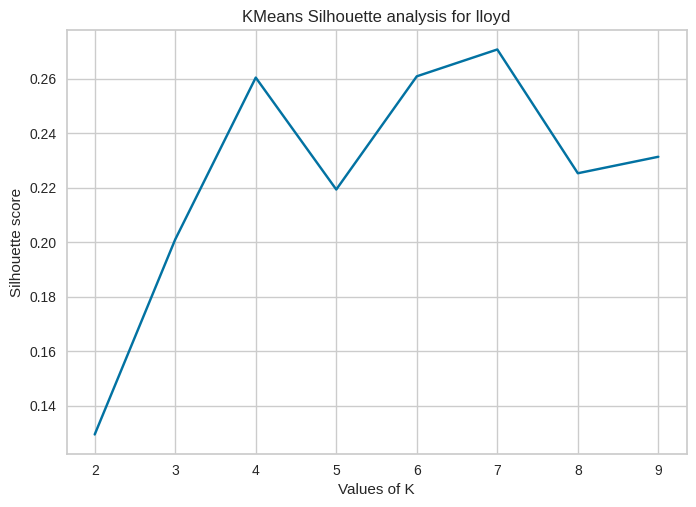

Best K: 7


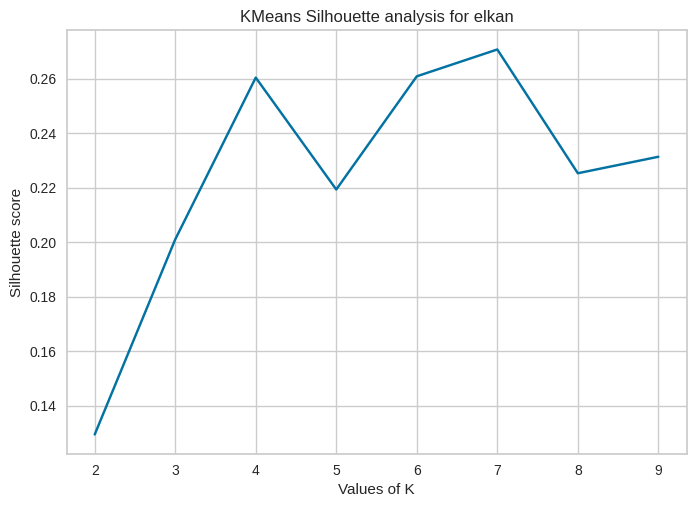

Best K: 7
{'lloyd': 7, 'elkan': 7}


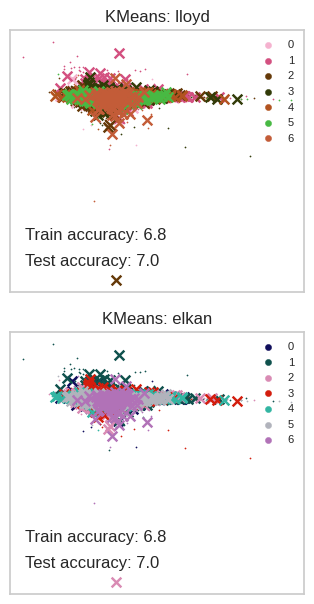

In [200]:
ica_housing_kmeans_est = kmeans_plots(X_data=ica_housing_df,y_data=y_housing,max_iter=5000,max_cluster=10,text_pos=[0.2,0.1])

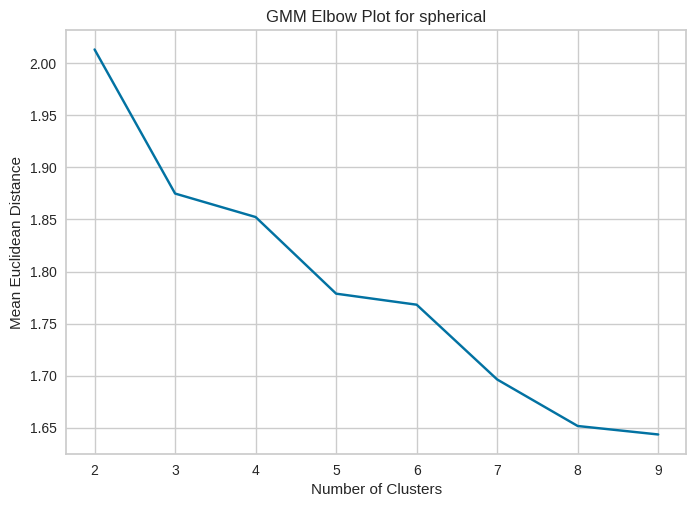

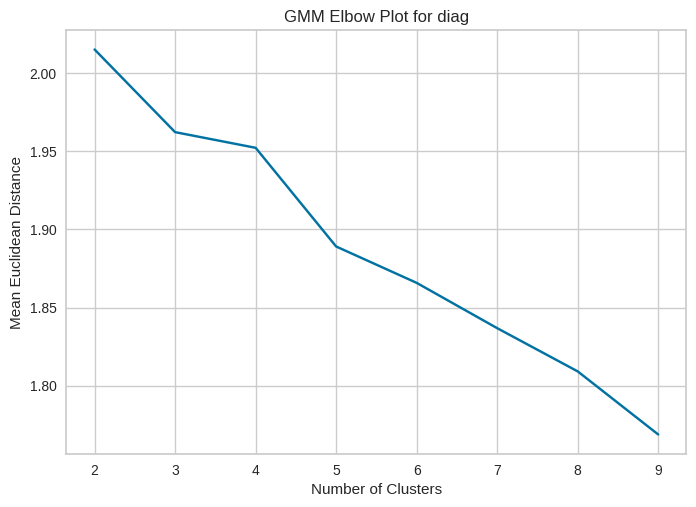

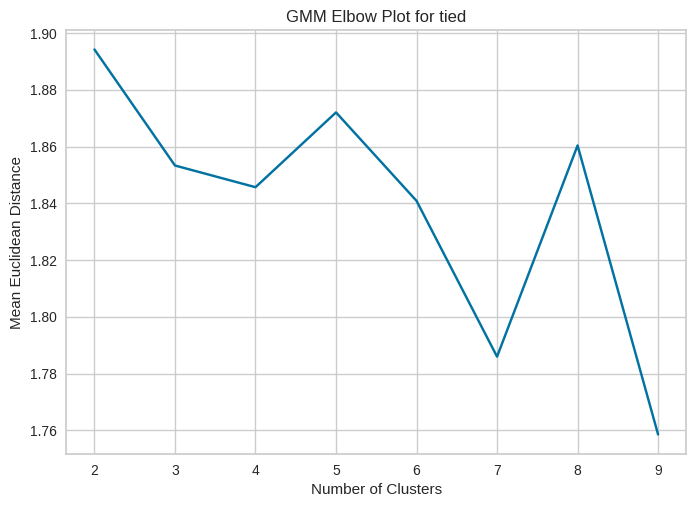

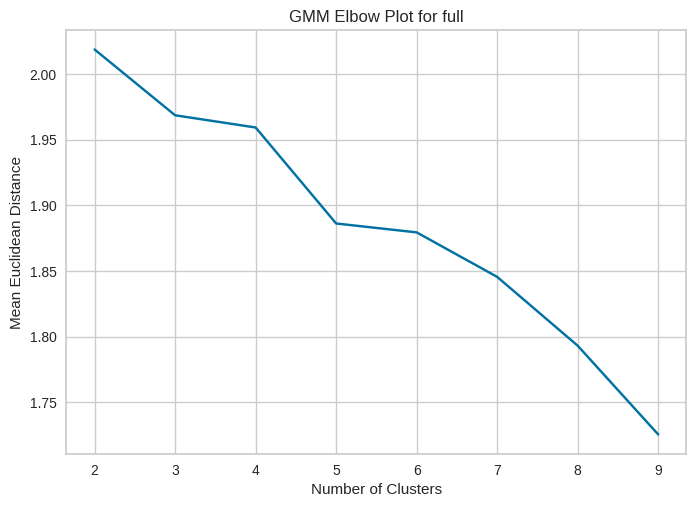

{'spherical': 7, 'diag': 7, 'tied': 7, 'full': 7}


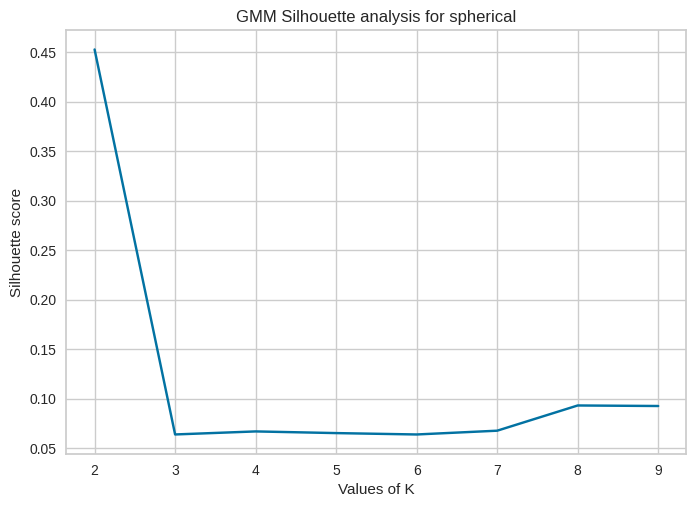

Best K: 2


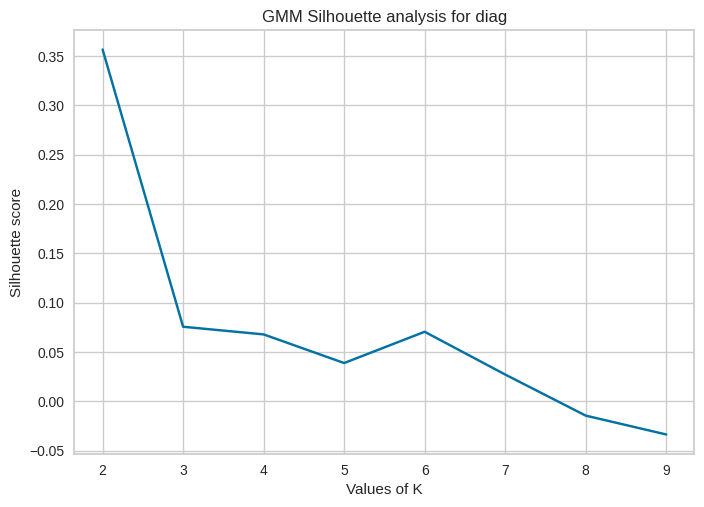

Best K: 2


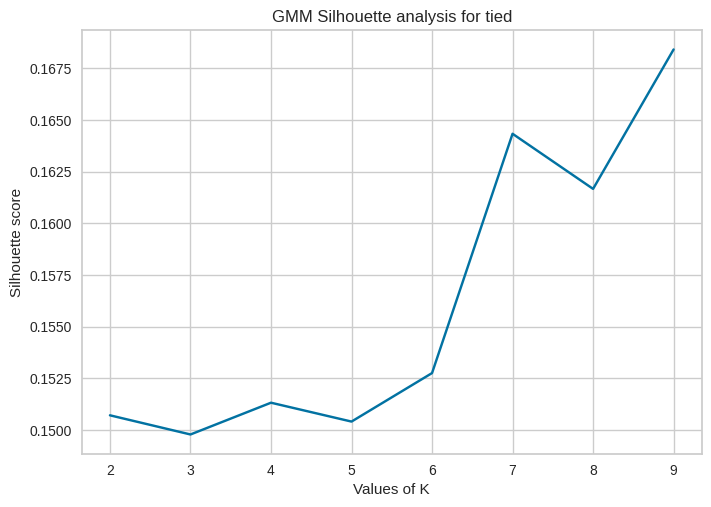

Best K: 9


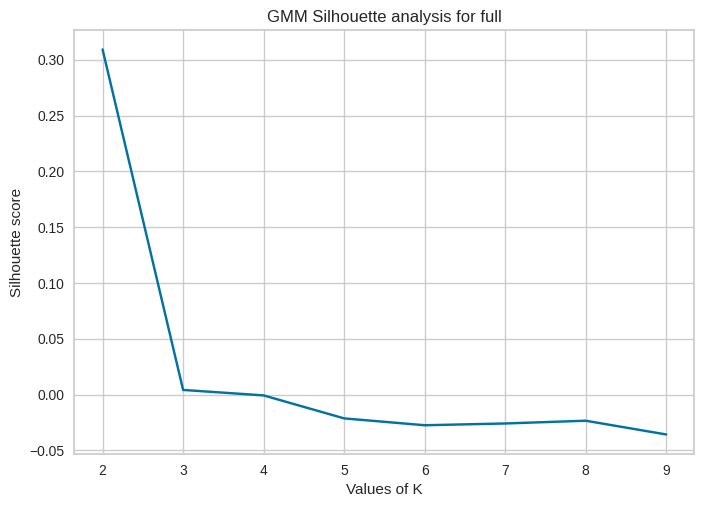

Best K: 2
{'spherical': 2, 'diag': 2, 'tied': 9, 'full': 2}


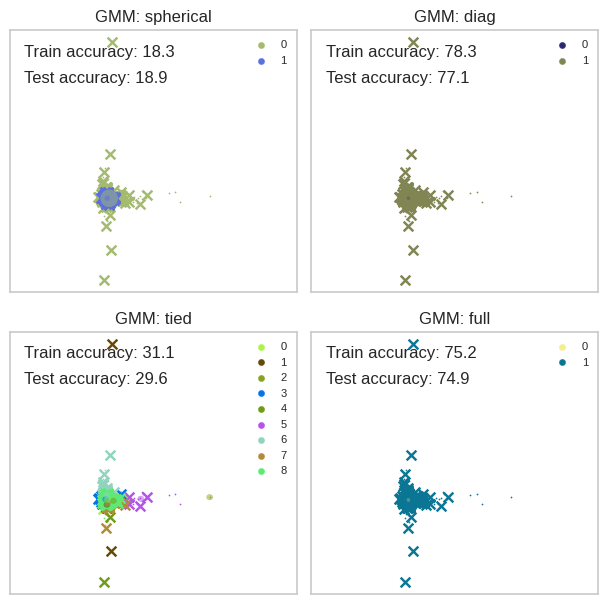

In [201]:
ica_bankrupt_df = pd.DataFrame(ica_bankrupt)
ica_housing_gmm_est = gmm_plots(X_data=ica_bankrupt_df,y_data=y_bankrupt,max_iter=2000,max_cluster=10,text_pos=[0.9,0.8])

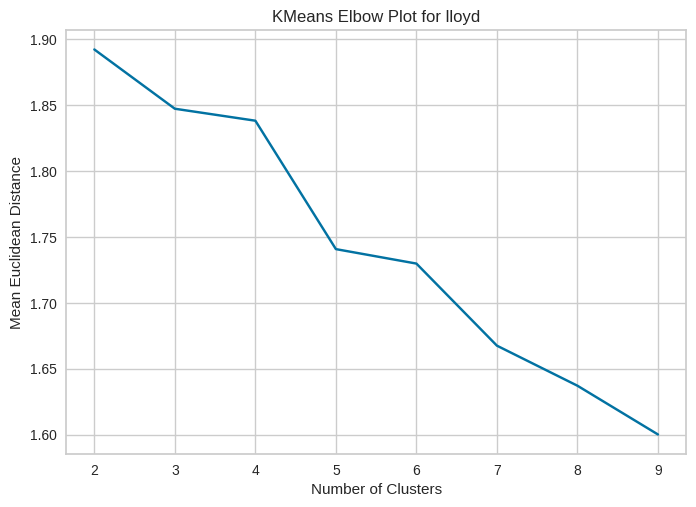

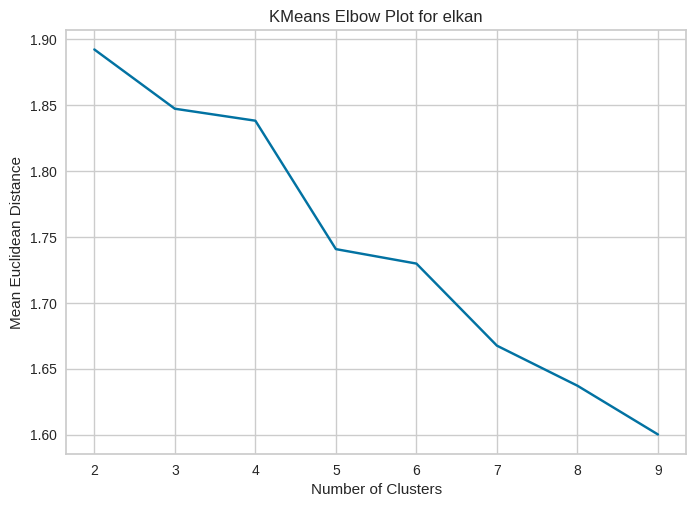

{'lloyd': 7, 'elkan': 7}


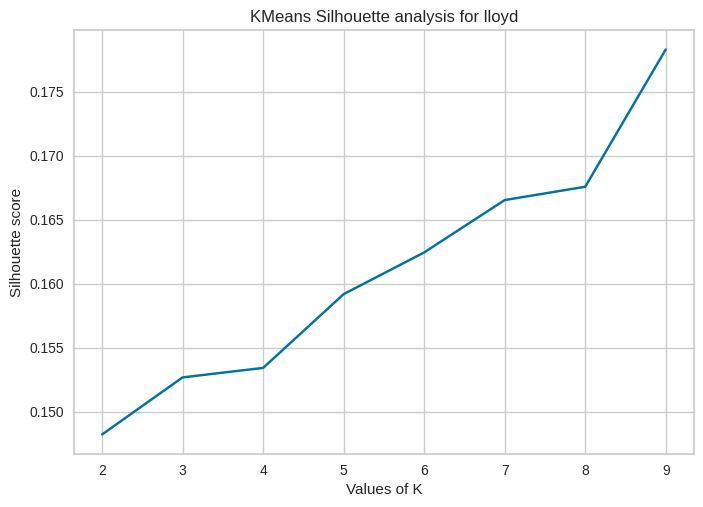

Best K: 9


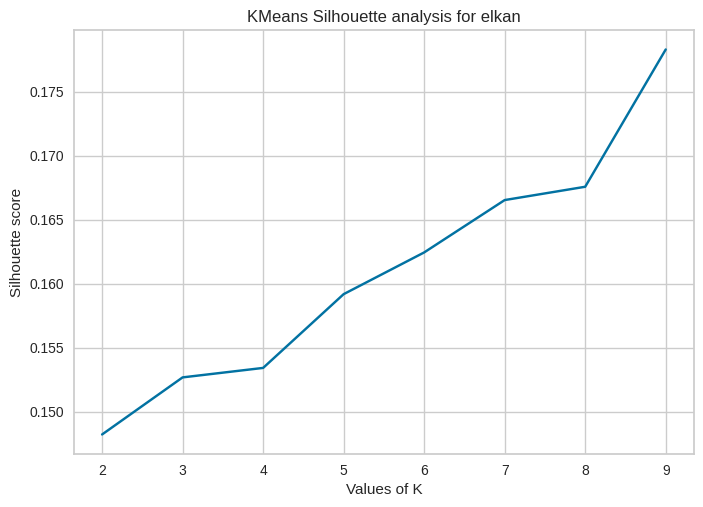

Best K: 9
{'lloyd': 9, 'elkan': 9}


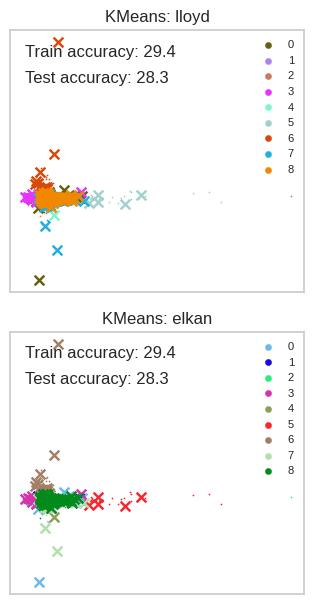

In [202]:
ica_housing_kmeans_est = kmeans_plots(X_data=ica_bankrupt_df,y_data=y_bankrupt,max_iter=5000,max_cluster=10,text_pos=[0.9,0.8])

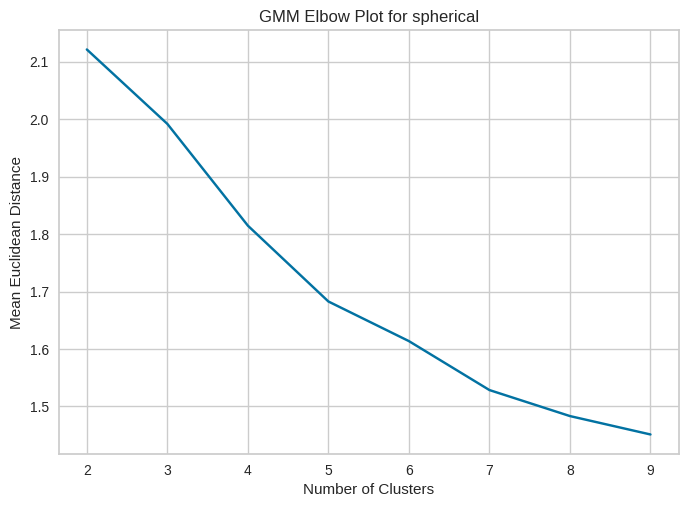

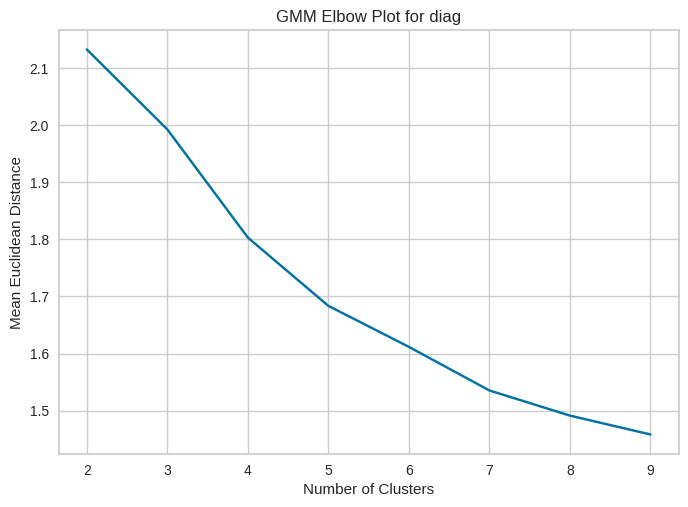

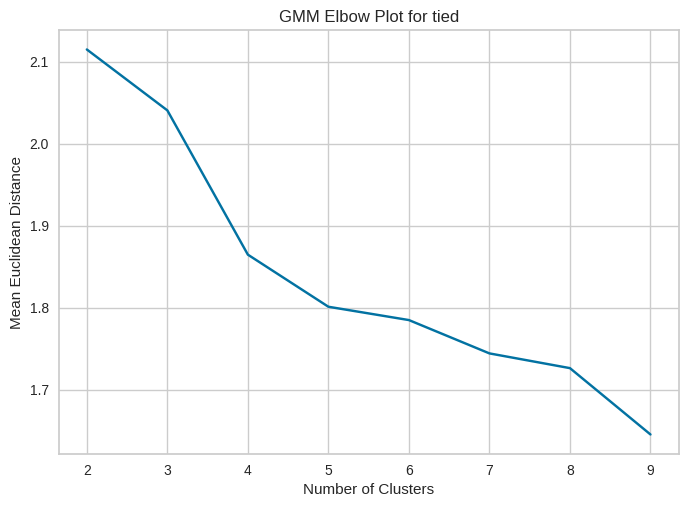

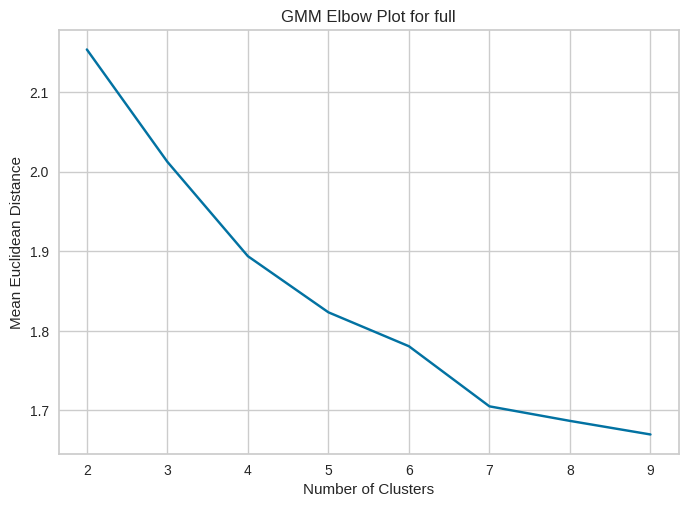

{'spherical': 7, 'diag': 7, 'tied': 7, 'full': 7}


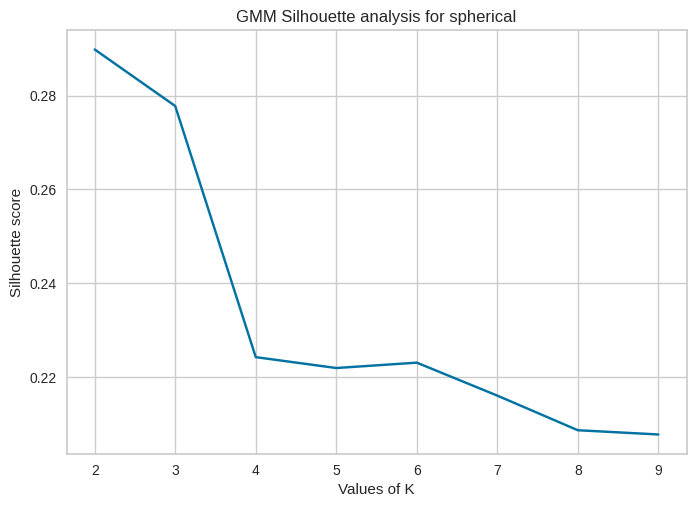

Best K: 2


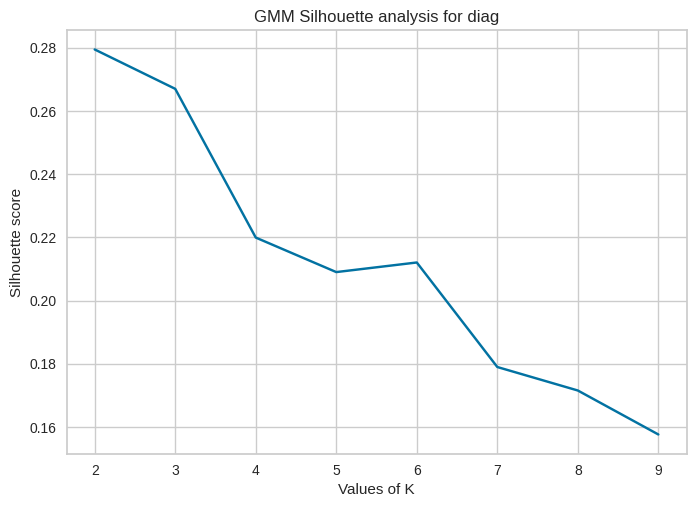

Best K: 2


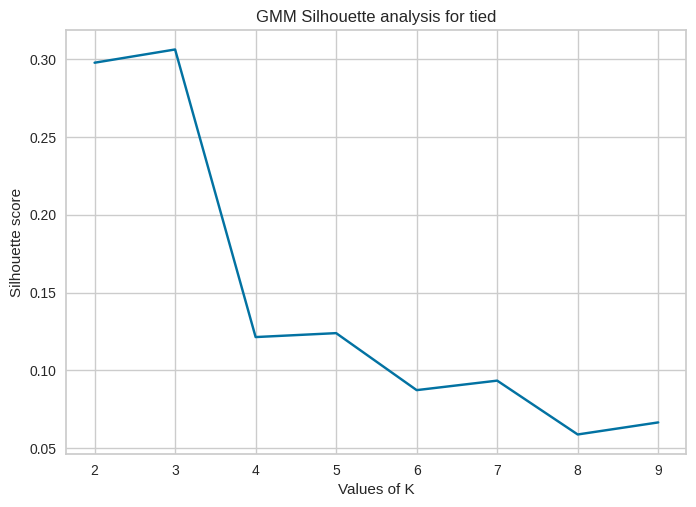

Best K: 3


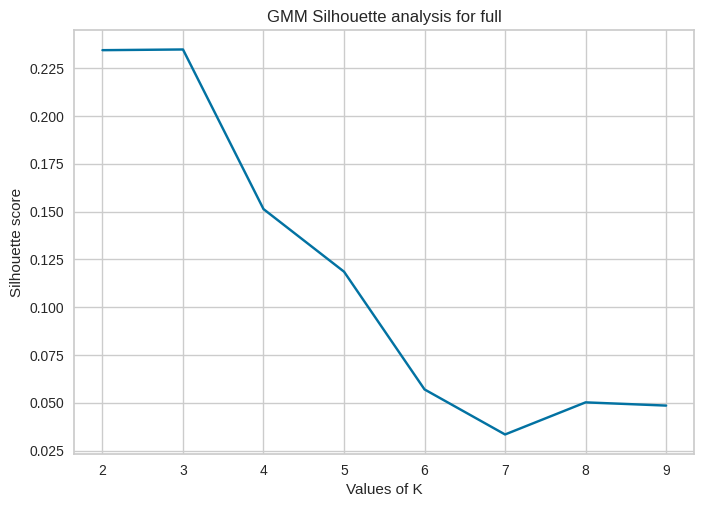

Best K: 3
{'spherical': 2, 'diag': 2, 'tied': 3, 'full': 3}


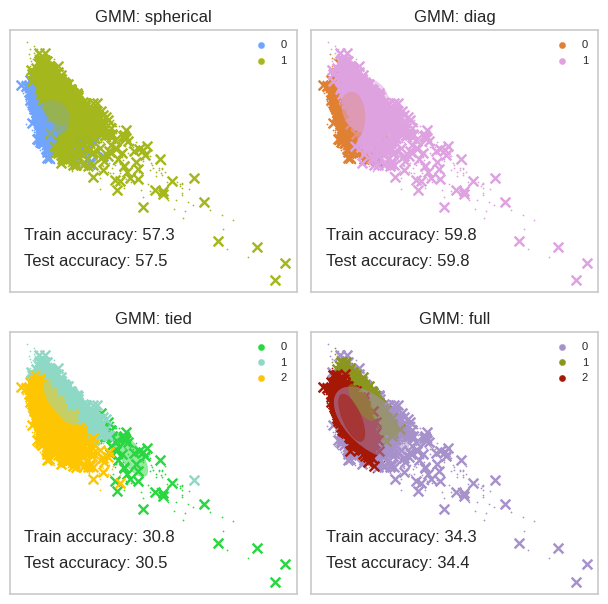

In [203]:
grp_housing_df = pd.DataFrame(grp_housing)
grp_housing_gmm_est = gmm_plots(X_data=grp_housing_df,y_data=y_housing,max_iter=2000,max_cluster=10,text_pos=[0.2,0.1])

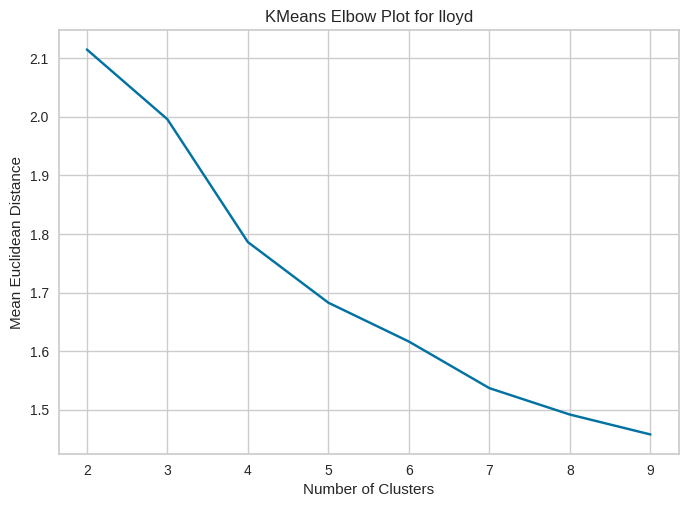

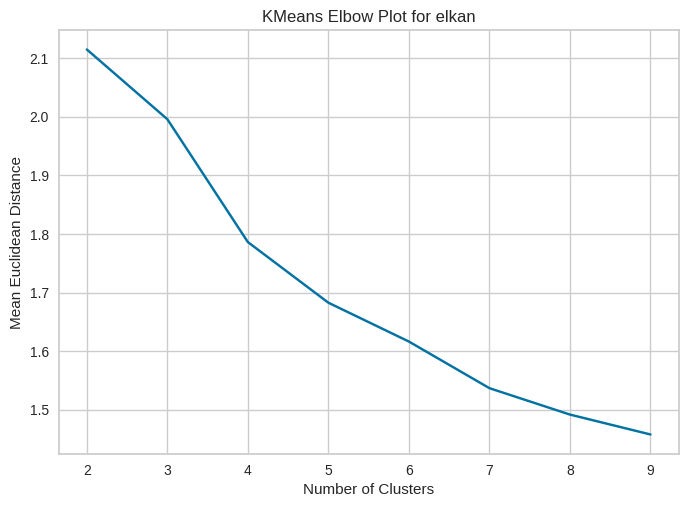

{'lloyd': 7, 'elkan': 7}


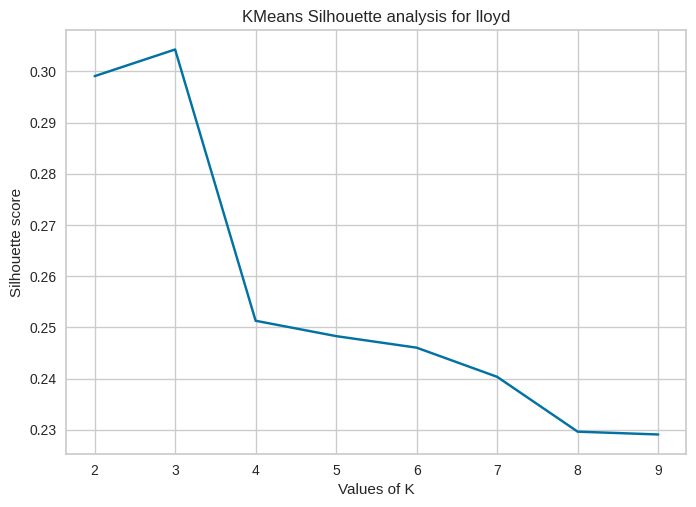

Best K: 3


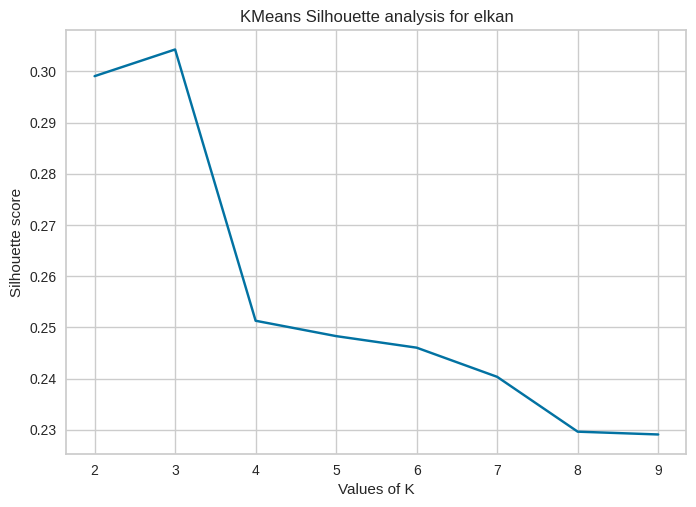

Best K: 3
{'lloyd': 3, 'elkan': 3}


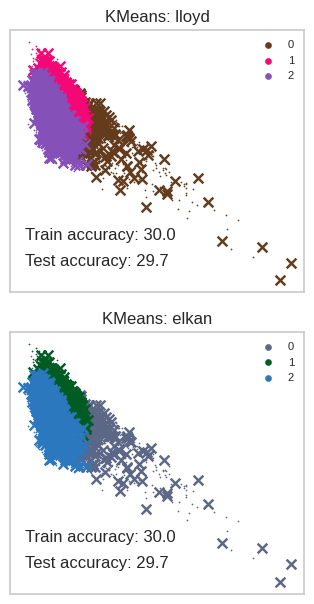

In [204]:
grp_housing_kmeans_est = kmeans_plots(X_data=grp_housing_df,y_data=y_housing,max_iter=5000,max_cluster=10,text_pos=[0.2,0.1])

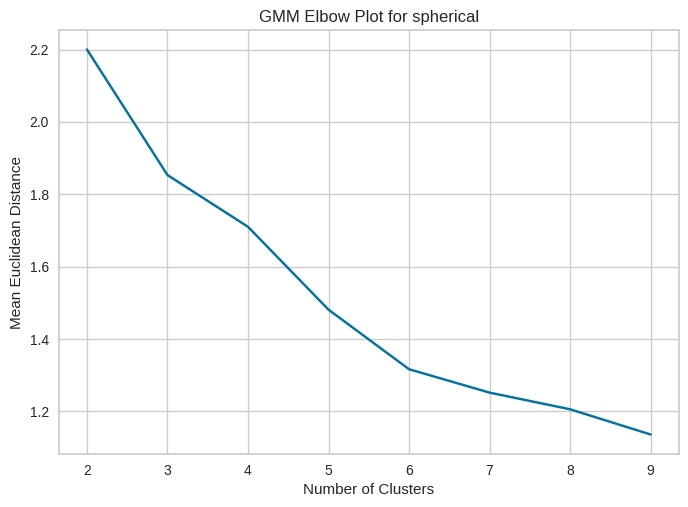

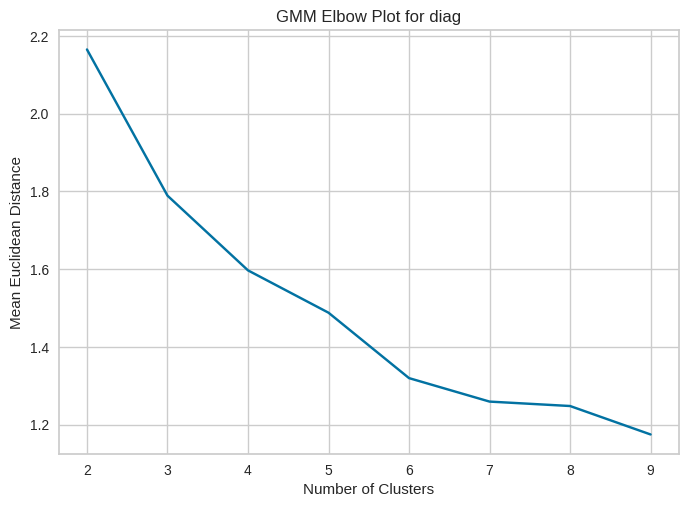

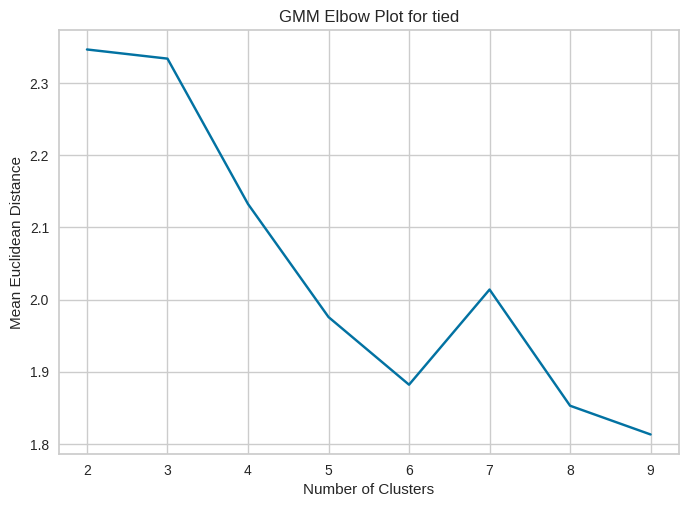

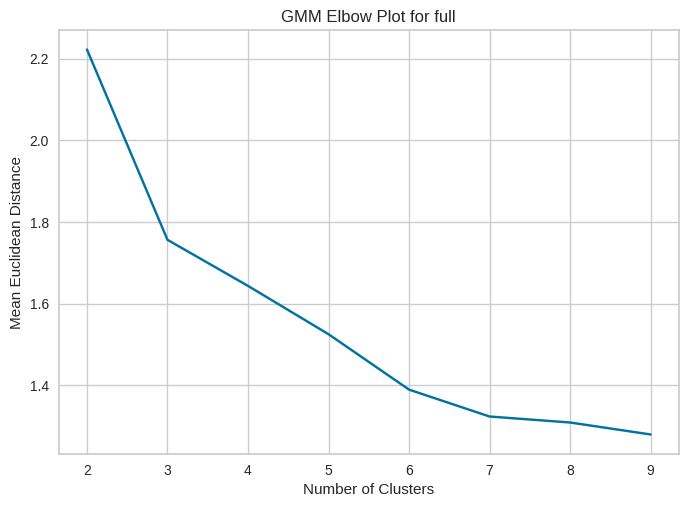

{'spherical': 7, 'diag': 7, 'tied': 7, 'full': 7}


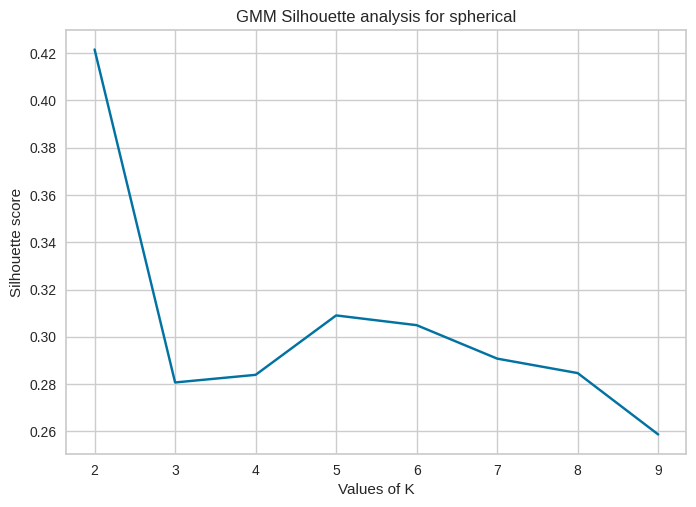

Best K: 2


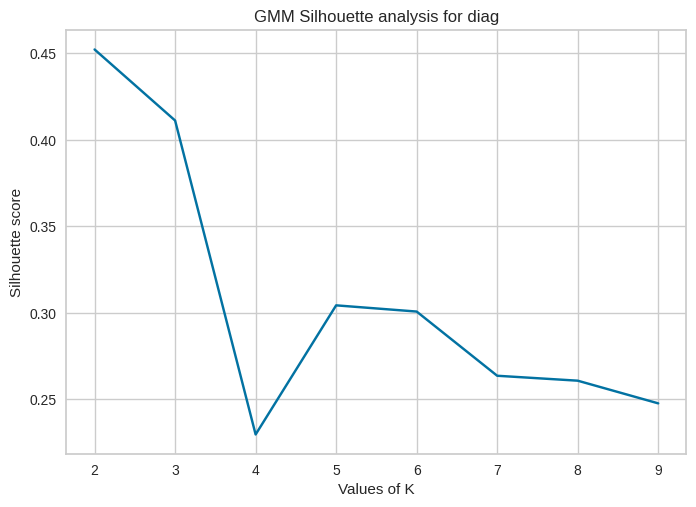

Best K: 2


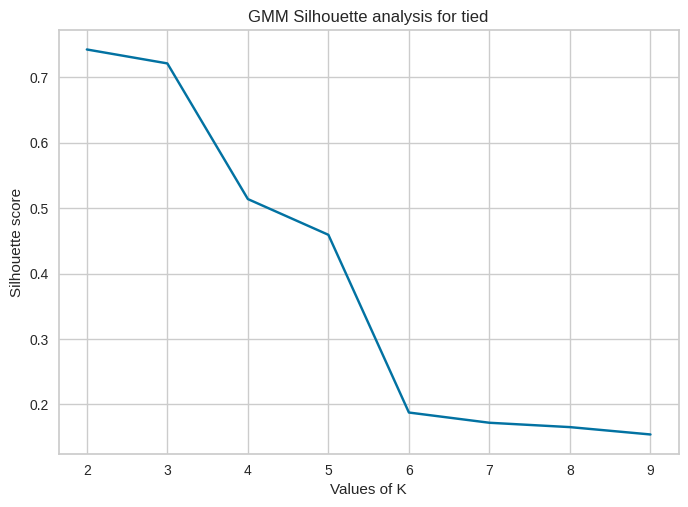

Best K: 2


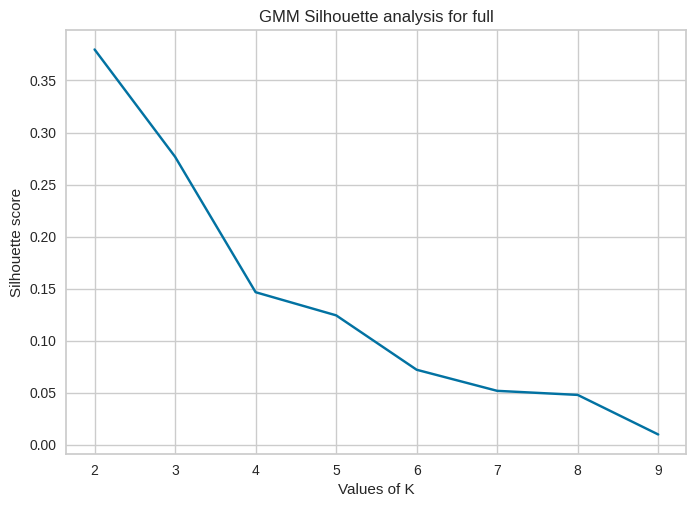

Best K: 2
{'spherical': 2, 'diag': 2, 'tied': 2, 'full': 2}


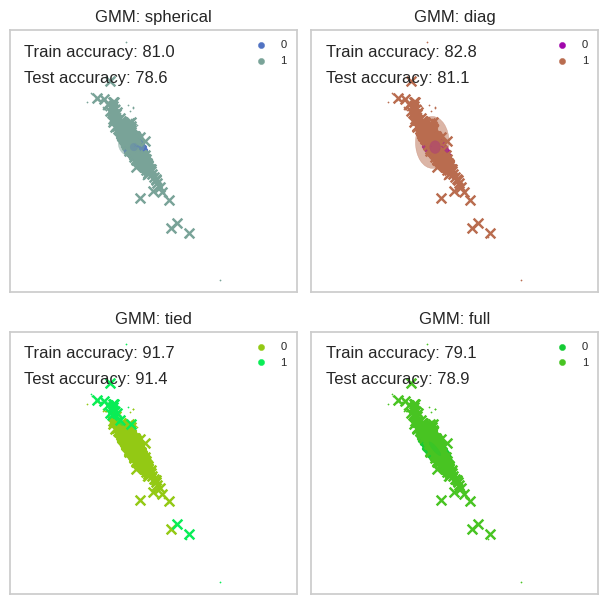

In [205]:
grp_bankrupt_df = pd.DataFrame(grp_bankrupt)
grp_housing_gmm_est = gmm_plots(X_data=grp_bankrupt_df,y_data=y_bankrupt,max_iter=2000,max_cluster=10,text_pos=[0.9,0.8])

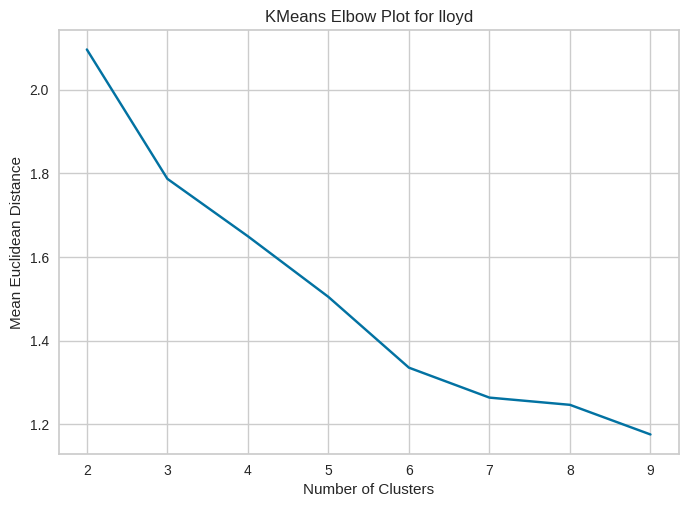

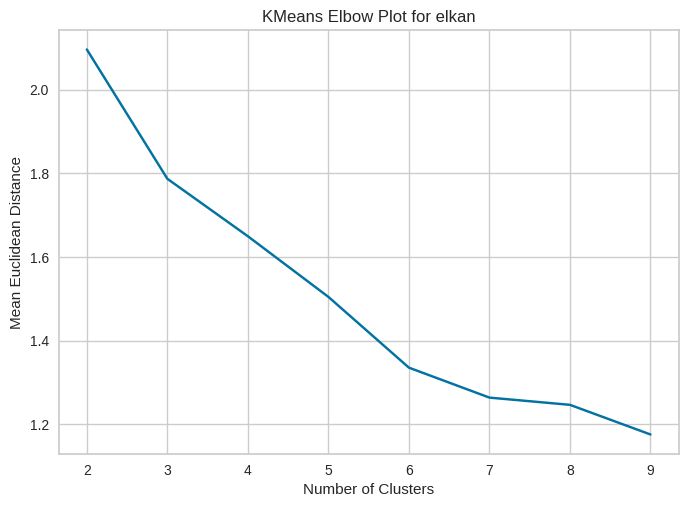

{'lloyd': 7, 'elkan': 7}


In [ ]:
grp_bankrupt_kmeans_est = kmeans_plots(X_data=grp_bankrupt_df,y_data=y_bankrupt,max_iter=5000,max_cluster=10,text_pos=[0.9,0.8])

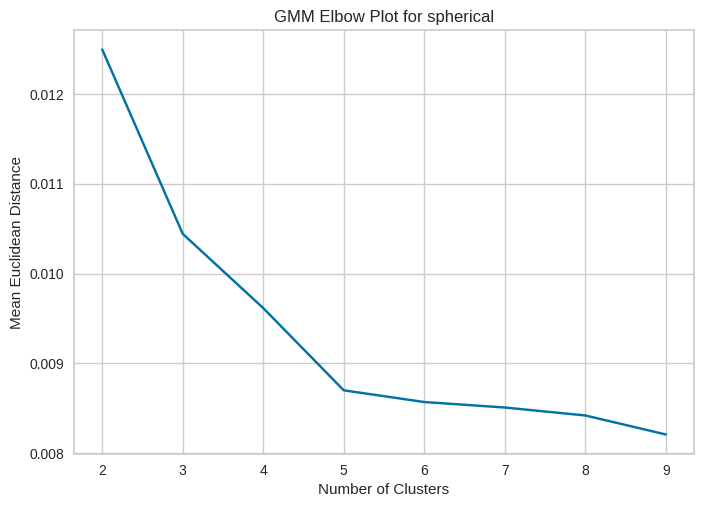

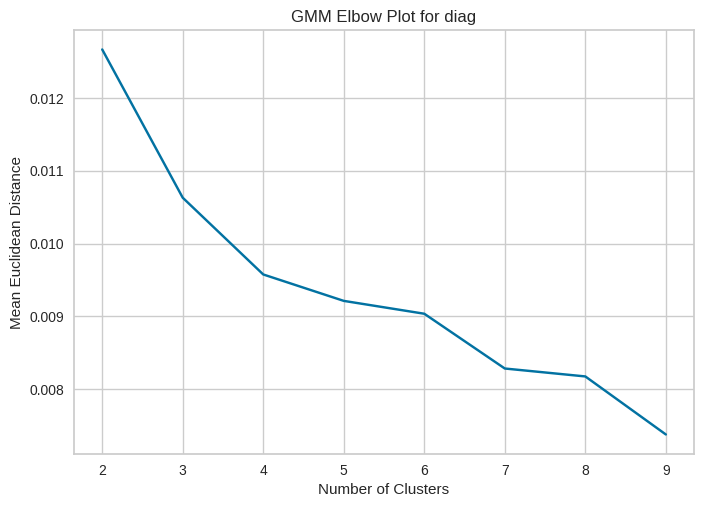

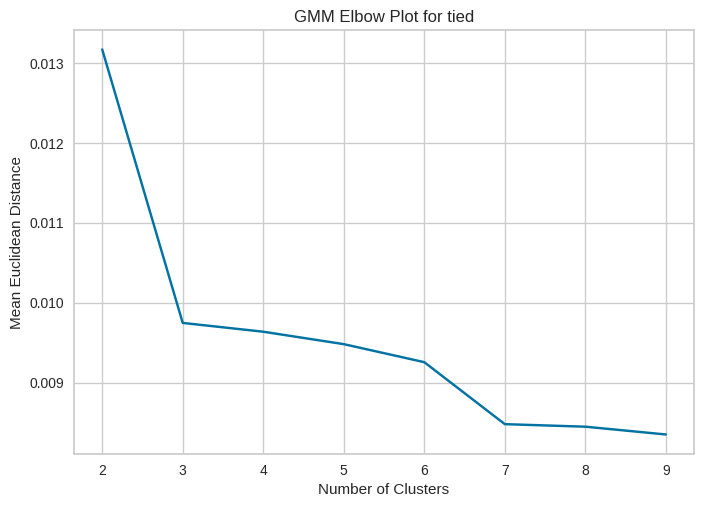

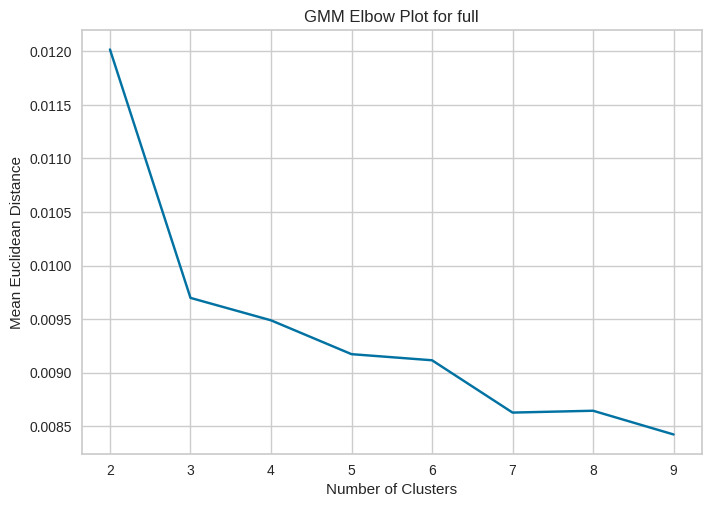

{'spherical': 7, 'diag': 7, 'tied': 7, 'full': 7}


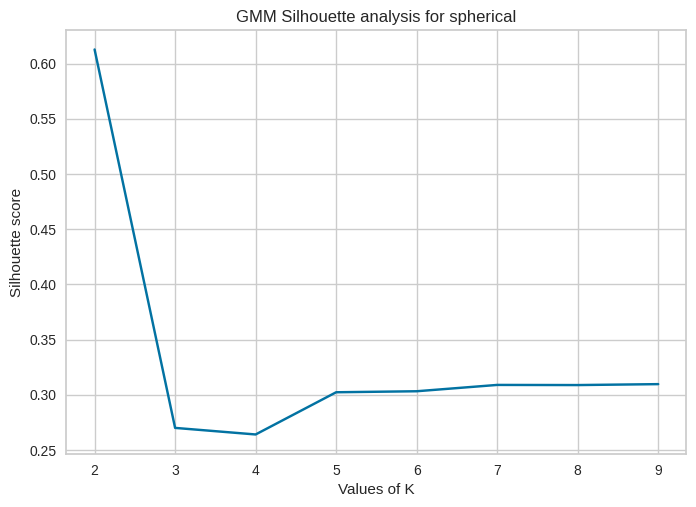

Best K: 2


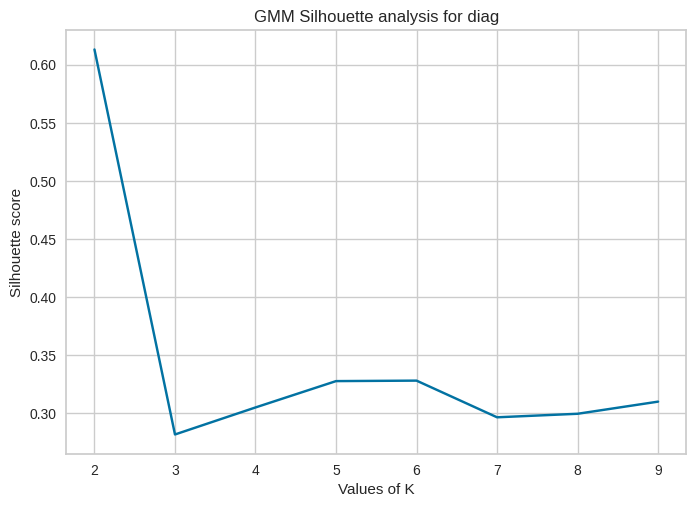

Best K: 2


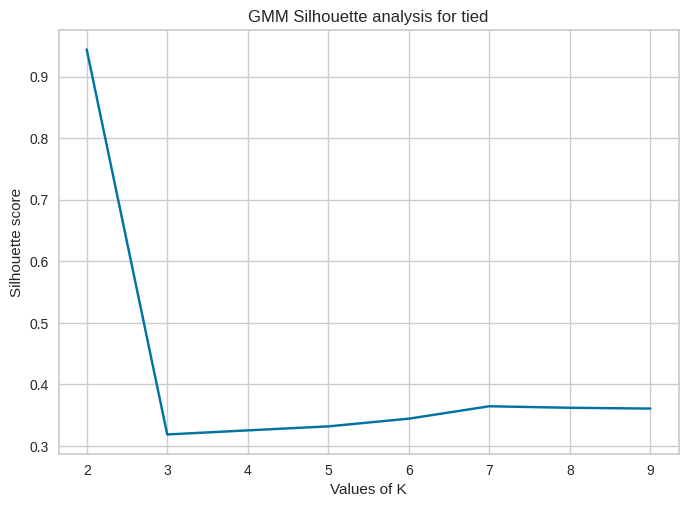

Best K: 2


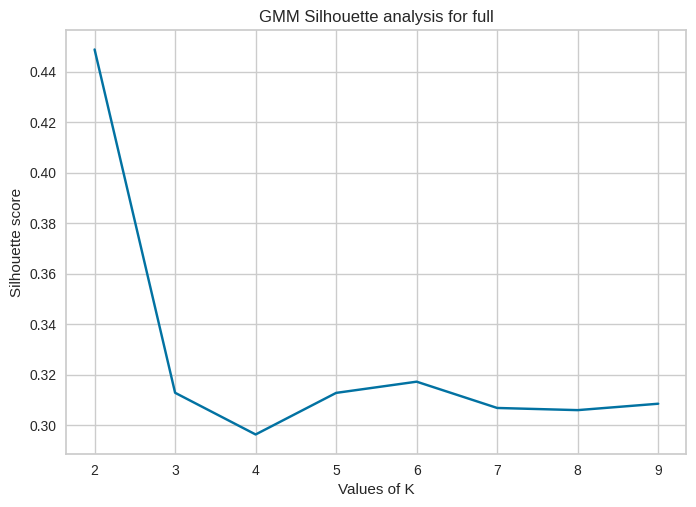

Best K: 2
{'spherical': 2, 'diag': 2, 'tied': 2, 'full': 2}


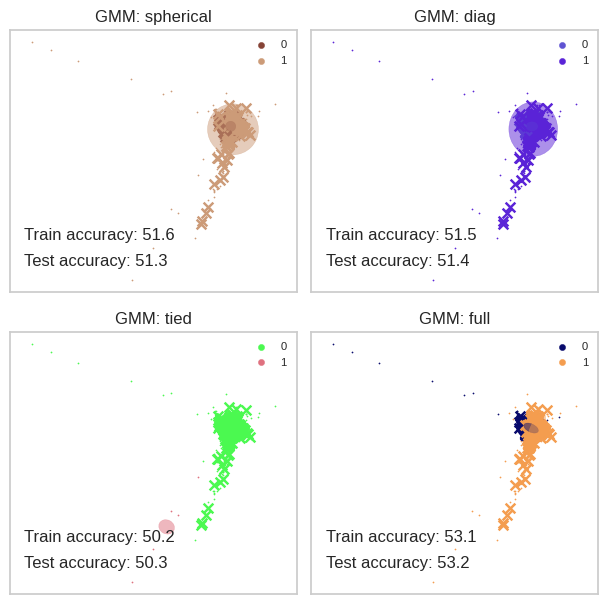

In [261]:
lle_housing_df = pd.DataFrame(lle_housing)
lle_housing_gmm_est = gmm_plots(X_data=lle_housing_df,y_data=y_housing,max_iter=2000,max_cluster=10,text_pos=[0.2,0.1])

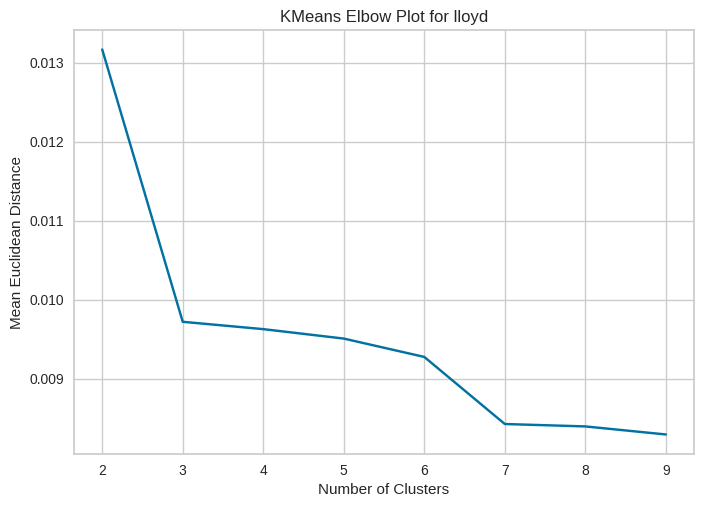

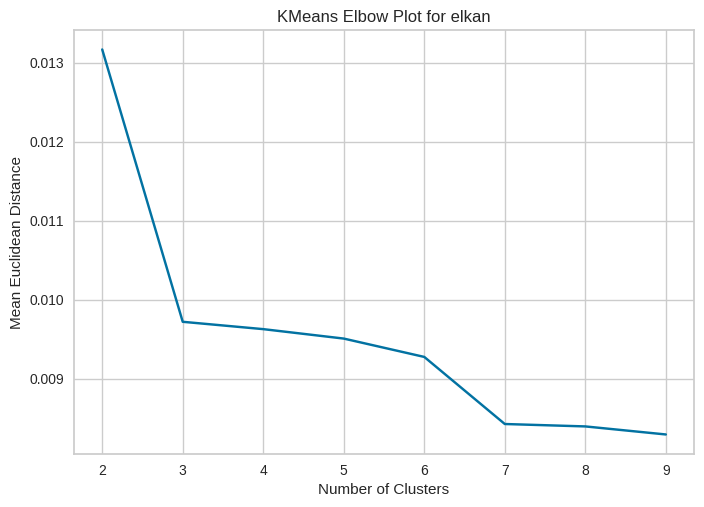

{'lloyd': 7, 'elkan': 7}


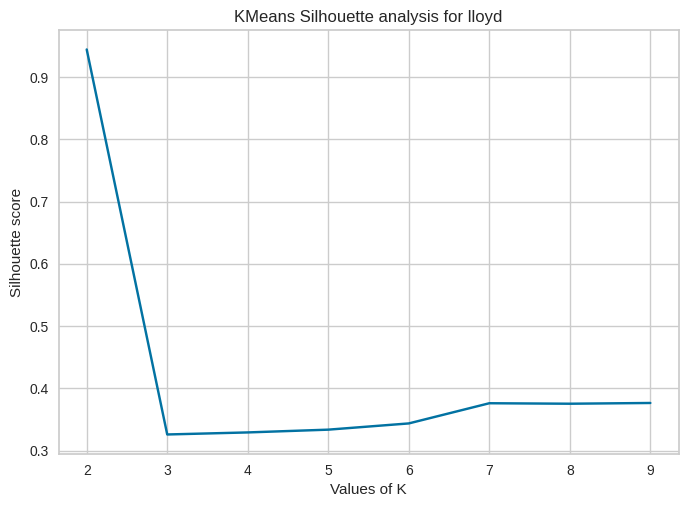

Best K: 2


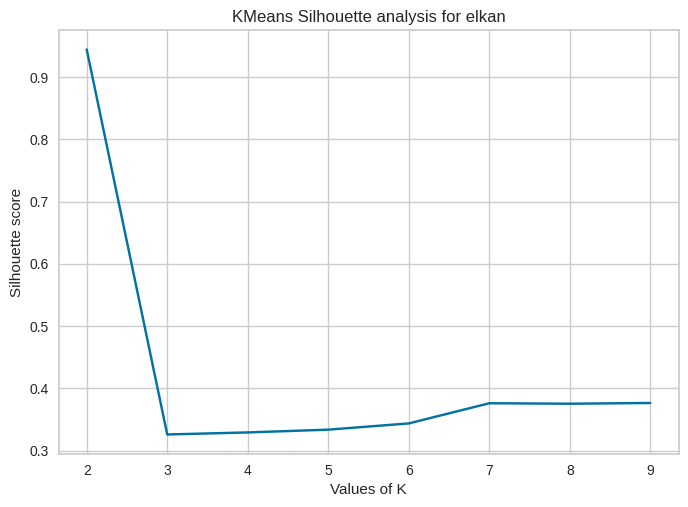

Best K: 2
{'lloyd': 2, 'elkan': 2}


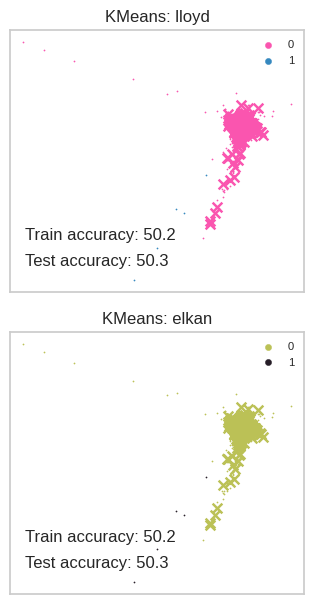

In [258]:
lle_housing_kmeans_est = kmeans_plots(X_data=lle_housing_df,y_data=y_housing,max_iter=5000,max_cluster=10,text_pos=[0.2,0.1])

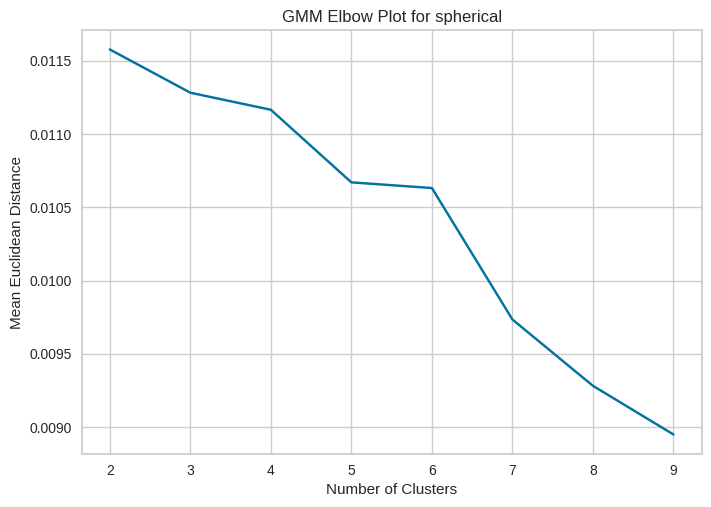

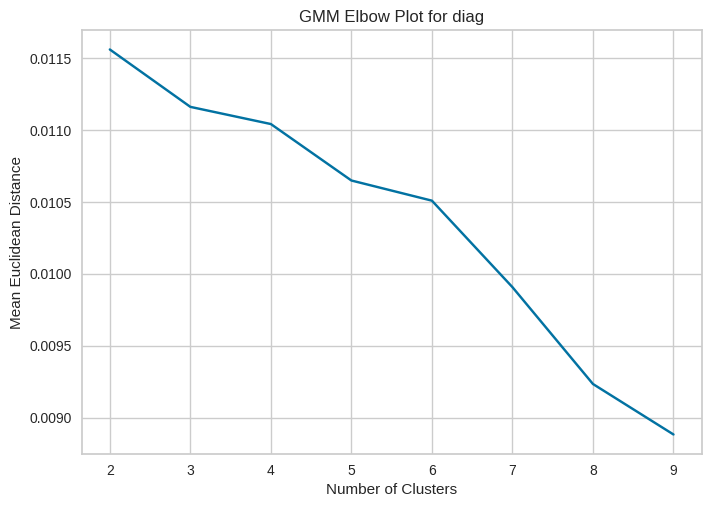

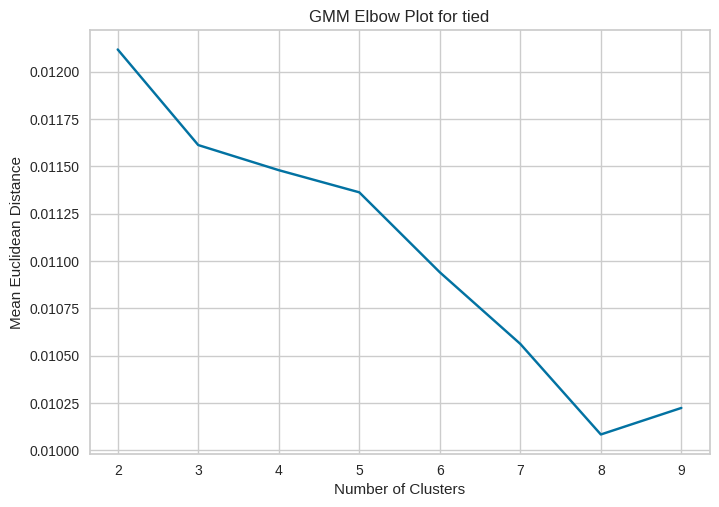

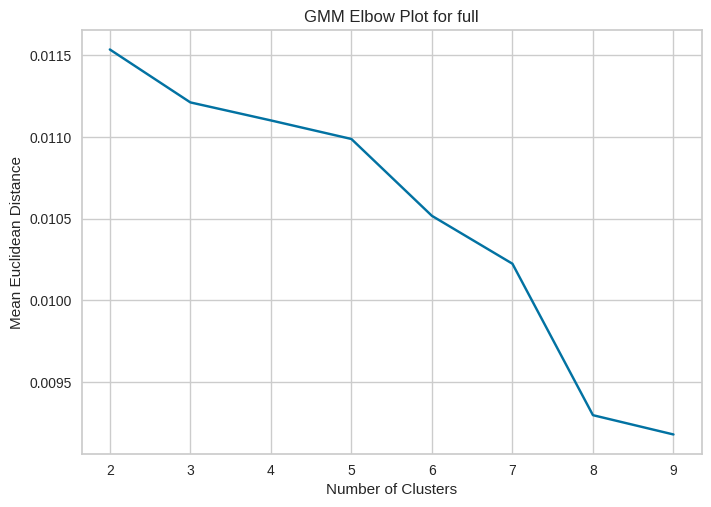

{'spherical': 7, 'diag': 7, 'tied': 6, 'full': 7}


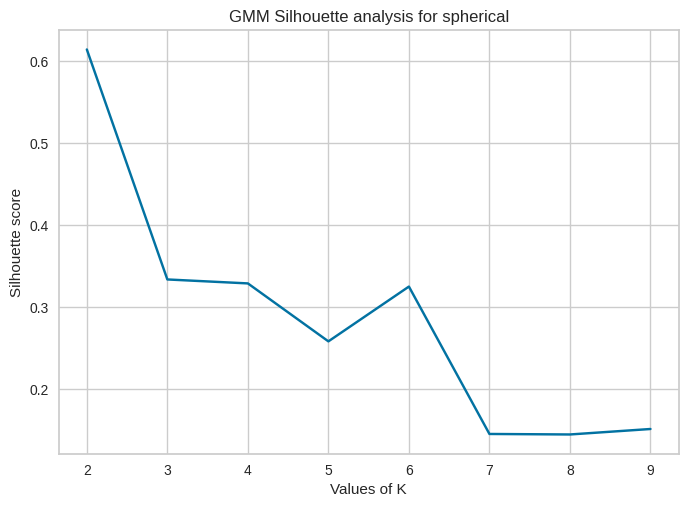

Best K: 2


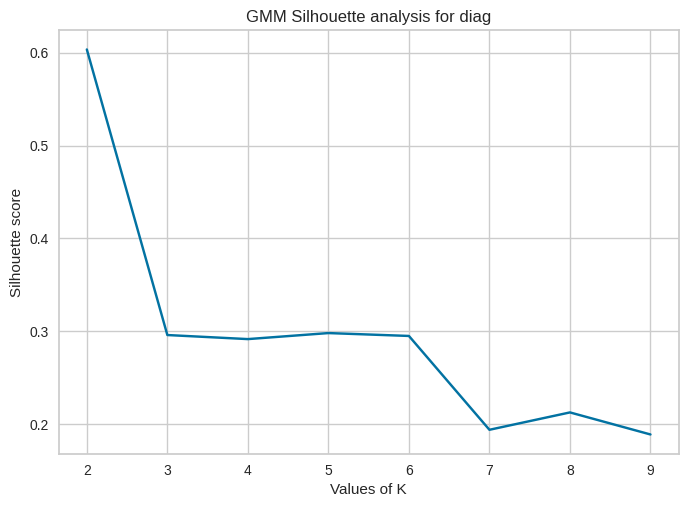

Best K: 2


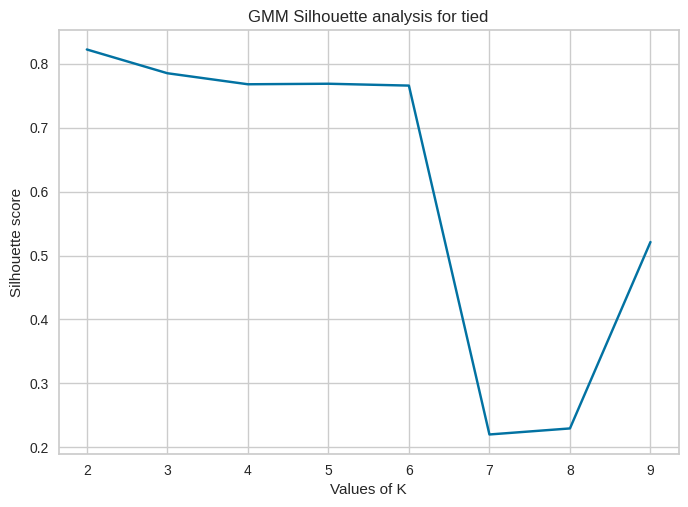

Best K: 2


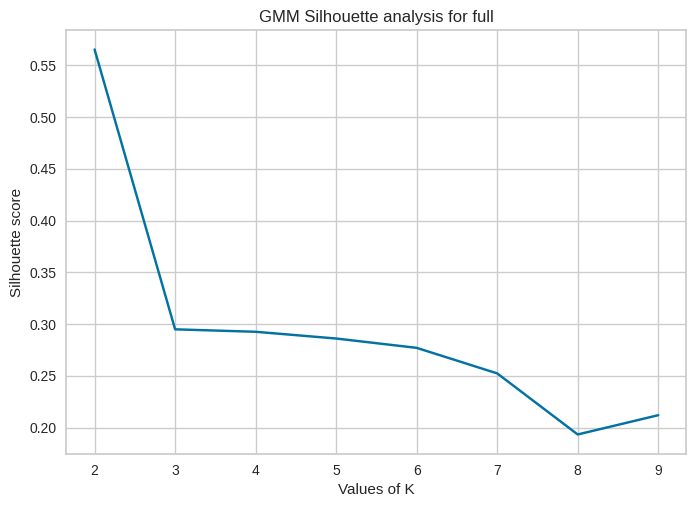

Best K: 2
{'spherical': 2, 'diag': 2, 'tied': 2, 'full': 2}


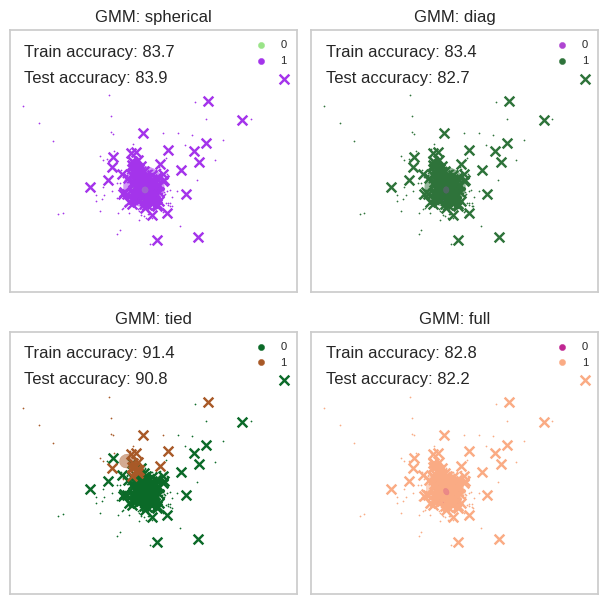

In [259]:
lle_bankrupt_df = pd.DataFrame(lle_bankrupt)
lle_bankrupt_gmm_est = gmm_plots(X_data=lle_bankrupt_df,y_data=y_bankrupt,max_iter=2000,max_cluster=10,text_pos=[0.9,0.8])

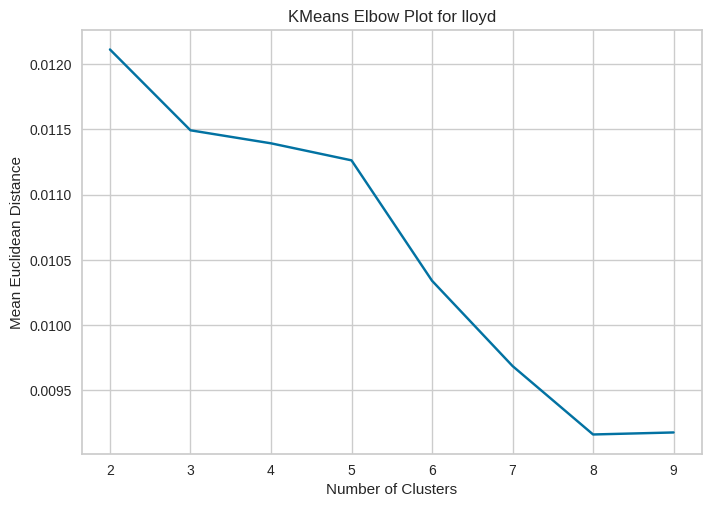

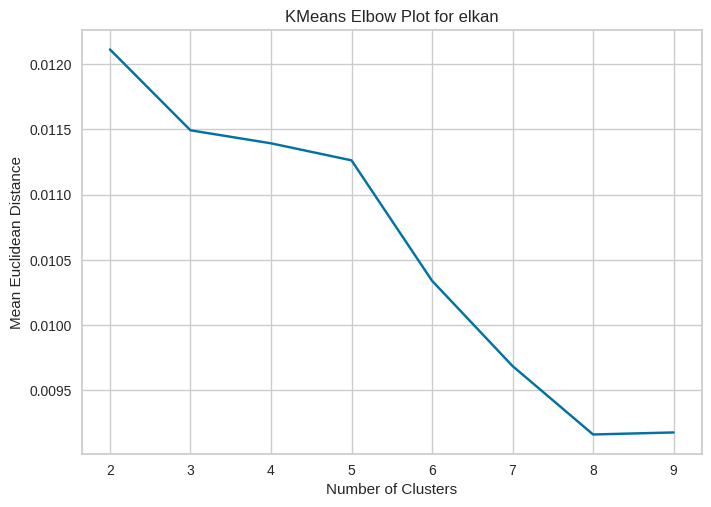

{'lloyd': 6, 'elkan': 6}


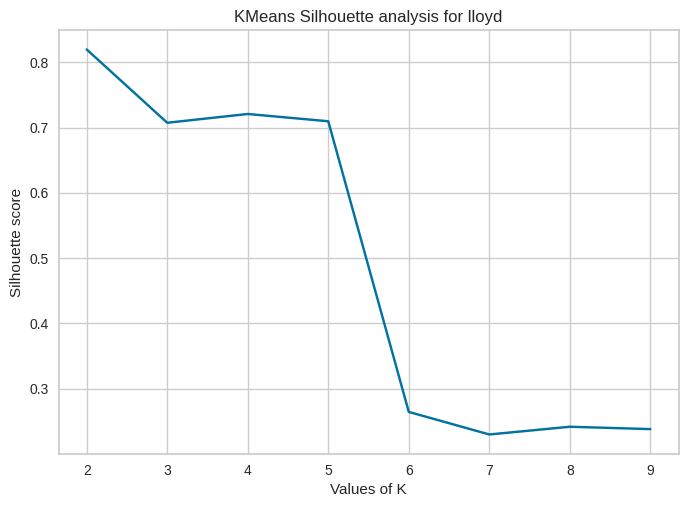

Best K: 2


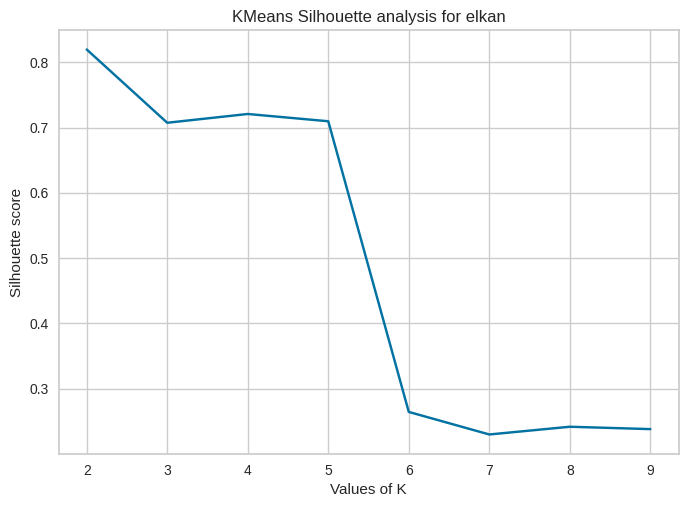

Best K: 2
{'lloyd': 2, 'elkan': 2}


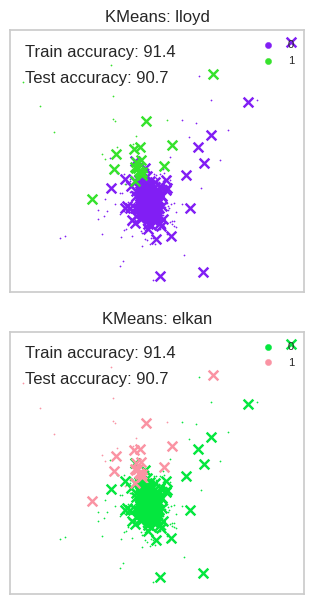

In [260]:
lle_bankrupt_kmeans_est = kmeans_plots(X_data=lle_bankrupt_df,y_data=y_bankrupt,max_iter=5000,max_cluster=10,text_pos=[0.9,0.8])

# Neural Network with Dimensionality Reduction and Clustering

Choose one of your datasets. Re-run your neural network learner from Assignment #1 with each of the dimensionality reduction algorithms applied. You will report on a different linear method from Step 3 (PCA, ICA, or RP) and on the manifold learning algorithm of your choice, resulting in 2 total demonstrations. Justification will be especially important as space is limited in the report.
Neural network with ICA on Housing data
Neural network with Manifold Learning algorithm on Housing data


In [263]:
def run_nn(layer_list,X_train,y_train,epochs,X_test,y_test,plot_type):
    classifier = Sequential()
    for layer in layer_list:
        classifier.add(Dense(layer, activation='relu', kernel_initializer='random_normal', input_dim=X_train.shape[1]))

    #Output Layer
    classifier.add(Dense(1, activation='sigmoid'))
    #Compiling the neural network
    classifier.compile(optimizer ='adam',loss='binary_crossentropy', metrics =['accuracy'])

    #Fitting the data to the training dataset
    time_start = time.time()

    history = classifier.fit(X_train, y_train, epochs=epochs,batch_size=int(X_train.shape[0]/100),  validation_data=(X_test, y_test), shuffle=True)
    fit_time = time.time()
    print(fit_time-time_start)

    # summarize history for accuracy
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title(plot_type+' Adam NN Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title(plot_type+' Adam NN Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

Epoch 1/200
101/101 [==============================] - 2s 5ms/step - loss: 0.6175 - accuracy: 0.7163 - val_loss: 0.4851 - val_accuracy: 0.8196
Epoch 2/200
101/101 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.8230 - val_loss: 0.3950 - val_accuracy: 0.8225
Epoch 3/200
101/101 [==============================] - 0s 3ms/step - loss: 0.3729 - accuracy: 0.8314 - val_loss: 0.3767 - val_accuracy: 0.8283
Epoch 4/200
101/101 [==============================] - 0s 3ms/step - loss: 0.3608 - accuracy: 0.8386 - val_loss: 0.3714 - val_accuracy: 0.8319
Epoch 5/200
101/101 [==============================] - 0s 4ms/step - loss: 0.3547 - accuracy: 0.8440 - val_loss: 0.3727 - val_accuracy: 0.8287
Epoch 6/200
101/101 [==============================] - 1s 12ms/step - loss: 0.3509 - accuracy: 0.8445 - val_loss: 0.3615 - val_accuracy: 0.8363
Epoch 7/200
101/101 [==============================] - 1s 10ms/step - loss: 0.3477 - accuracy: 0.8454 - val_loss: 0.3648 - val_accuracy: 0.83

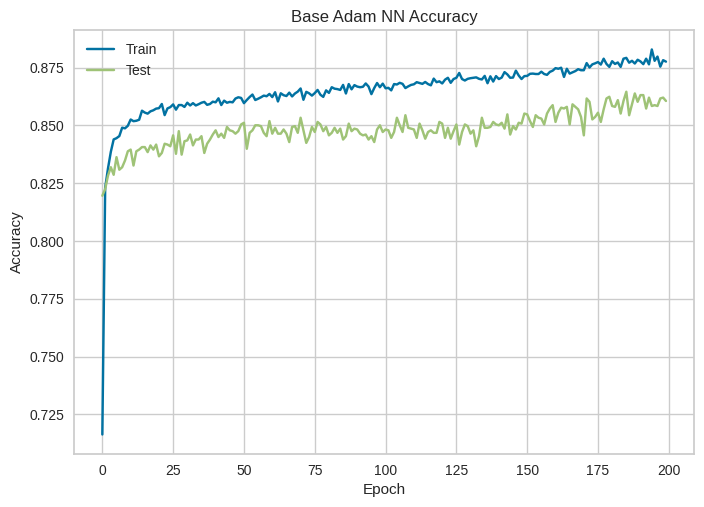

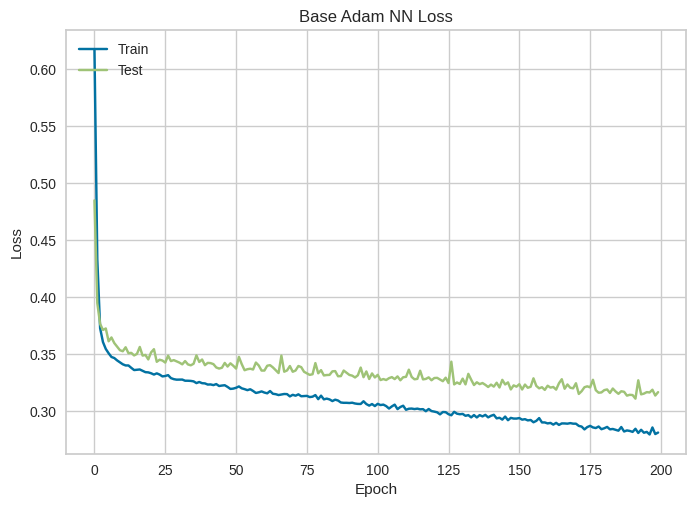

In [264]:
y_housing = np.array(y_housing.astype(int))
X_train, X_test, y_train, y_test = train_test_split(X_housing, y_housing, test_size=0.2, random_state=42)
layer_list = [32,16,8]
run_nn(layer_list=layer_list,X_train=X_train,y_train=y_train,epochs=200,X_test=X_test,y_test=y_test,plot_type='Base')

(13772, 5)
Epoch 1/200
101/101 [==============================] - 1s 5ms/step - loss: 0.6259 - accuracy: 0.7652 - val_loss: 0.4824 - val_accuracy: 0.8040
Epoch 2/200
101/101 [==============================] - 0s 3ms/step - loss: 0.4200 - accuracy: 0.8041 - val_loss: 0.4181 - val_accuracy: 0.8062
Epoch 3/200
101/101 [==============================] - 0s 3ms/step - loss: 0.4031 - accuracy: 0.8083 - val_loss: 0.4113 - val_accuracy: 0.8123
Epoch 4/200
101/101 [==============================] - 0s 3ms/step - loss: 0.3994 - accuracy: 0.8109 - val_loss: 0.4140 - val_accuracy: 0.8040
Epoch 5/200
101/101 [==============================] - 0s 3ms/step - loss: 0.3962 - accuracy: 0.8106 - val_loss: 0.4039 - val_accuracy: 0.8131
Epoch 6/200
101/101 [==============================] - 0s 3ms/step - loss: 0.3932 - accuracy: 0.8121 - val_loss: 0.4037 - val_accuracy: 0.8120
Epoch 7/200
101/101 [==============================] - 0s 5ms/step - loss: 0.3920 - accuracy: 0.8147 - val_loss: 0.4016 - val_accur

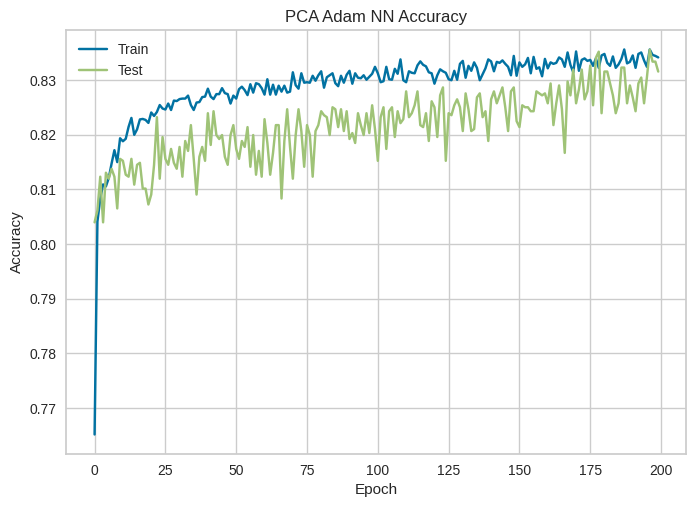

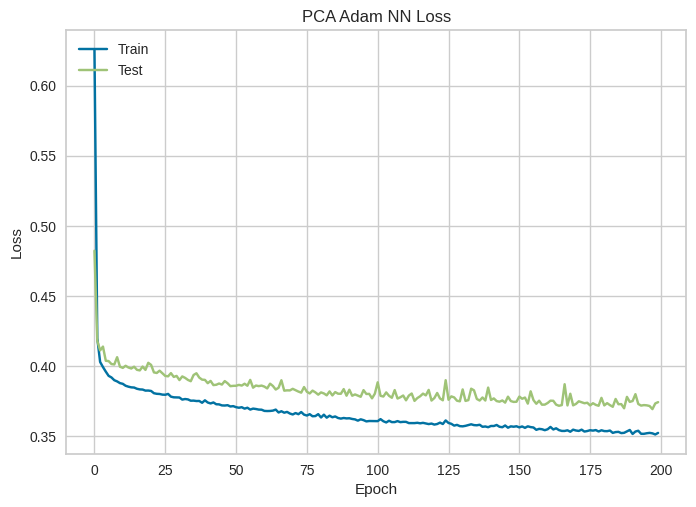

In [265]:
y_housing = np.array(y_housing.astype(int))
pca_housing_df = pd.DataFrame(pca_housing)
print(pca_housing_df.shape)
X_train, X_test, y_train, y_test = train_test_split(pca_housing_df, y_housing, test_size=0.2, random_state=42)
layer_list = [32,16,8]
run_nn(layer_list=layer_list,X_train=X_train,y_train=y_train,epochs=200,X_test=X_test,y_test=y_test,plot_type='PCA')

(13772, 5)
Epoch 1/200
101/101 [==============================] - 2s 5ms/step - loss: 0.6932 - accuracy: 0.5008 - val_loss: 0.6933 - val_accuracy: 0.4733
Epoch 2/200
101/101 [==============================] - 0s 3ms/step - loss: 0.6931 - accuracy: 0.5034 - val_loss: 0.6935 - val_accuracy: 0.4733
Epoch 3/200
101/101 [==============================] - 0s 3ms/step - loss: 0.6929 - accuracy: 0.5034 - val_loss: 0.6927 - val_accuracy: 0.4733
Epoch 4/200
101/101 [==============================] - 0s 3ms/step - loss: 0.6891 - accuracy: 0.5315 - val_loss: 0.6886 - val_accuracy: 0.4740
Epoch 5/200
101/101 [==============================] - 0s 4ms/step - loss: 0.6736 - accuracy: 0.6279 - val_loss: 0.6655 - val_accuracy: 0.6951
Epoch 6/200
101/101 [==============================] - 0s 4ms/step - loss: 0.6510 - accuracy: 0.6975 - val_loss: 0.6452 - val_accuracy: 0.7045
Epoch 7/200
101/101 [==============================] - 0s 4ms/step - loss: 0.6302 - accuracy: 0.7162 - val_loss: 0.6266 - val_accur

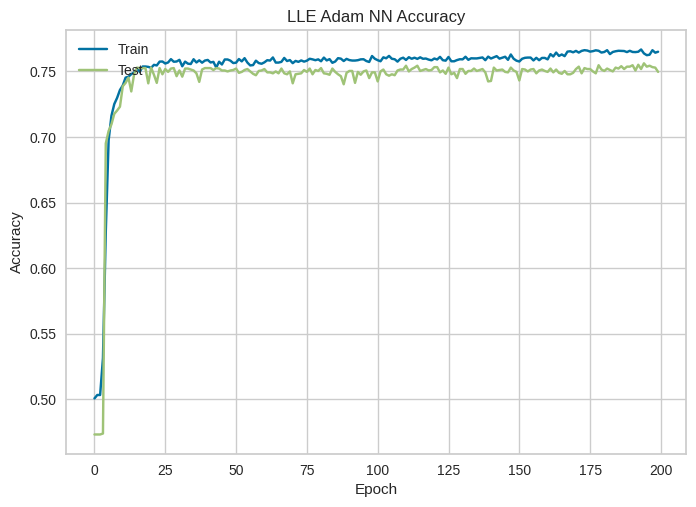

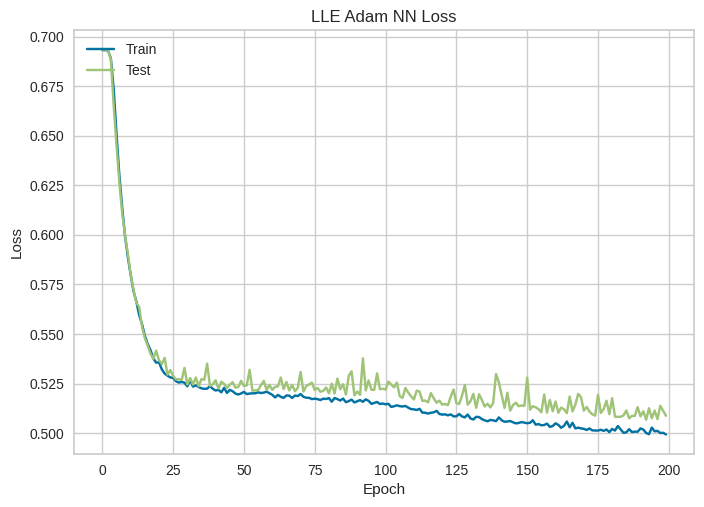

In [273]:
y_housing = np.array(y_housing.astype(int))
lle_housing_df = pd.DataFrame(lle_housing)
print(lle_housing_df.shape)

X_train, X_test, y_train, y_test = train_test_split(lle_housing_df, y_housing, test_size=0.2, random_state=42)
layer_list = [32,16,8]
run_nn(layer_list=layer_list,X_train=X_train,y_train=y_train,epochs=200,X_test=X_test,y_test=y_test,plot_type='LLE')

Epoch 1/200
101/101 [==============================] - 1s 5ms/step - loss: 0.6078 - accuracy: 0.7551 - val_loss: 0.4306 - val_accuracy: 0.8174
Epoch 2/200
101/101 [==============================] - 0s 3ms/step - loss: 0.3895 - accuracy: 0.8222 - val_loss: 0.3868 - val_accuracy: 0.8203
Epoch 3/200
101/101 [==============================] - 1s 6ms/step - loss: 0.3722 - accuracy: 0.8324 - val_loss: 0.3819 - val_accuracy: 0.8243
Epoch 4/200
101/101 [==============================] - 1s 5ms/step - loss: 0.3645 - accuracy: 0.8368 - val_loss: 0.3737 - val_accuracy: 0.8269
Epoch 5/200
101/101 [==============================] - 1s 5ms/step - loss: 0.3605 - accuracy: 0.8422 - val_loss: 0.3724 - val_accuracy: 0.8250
Epoch 6/200
101/101 [==============================] - 0s 4ms/step - loss: 0.3561 - accuracy: 0.8437 - val_loss: 0.3700 - val_accuracy: 0.8283
Epoch 7/200
101/101 [==============================] - 1s 5ms/step - loss: 0.3532 - accuracy: 0.8435 - val_loss: 0.3652 - val_accuracy: 0.8345

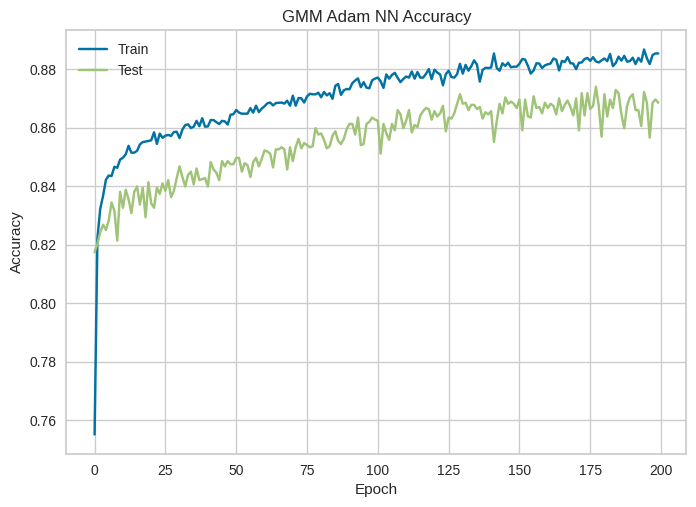

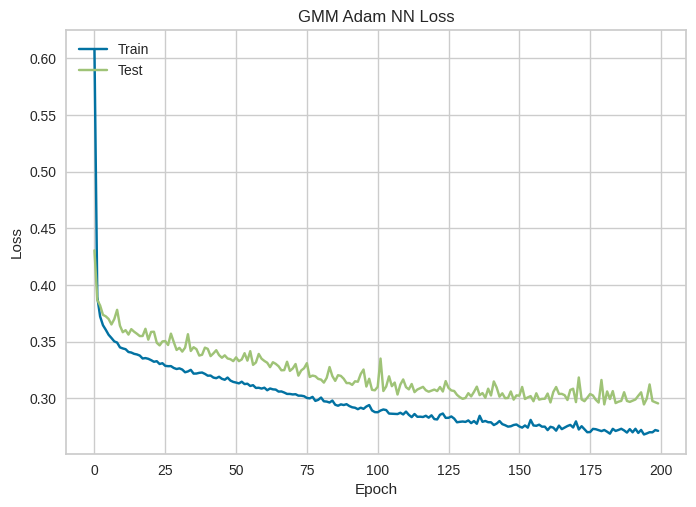

In [267]:
gmm_housing = pd.concat([X_housing,pd.DataFrame(gmm_y_housing)],axis=1)
y_housing = np.array(y_housing.astype(int))

X_train, X_test, y_train, y_test = train_test_split(gmm_housing, y_housing, test_size=0.2, random_state=42)
layer_list = [32,16,8]
run_nn(layer_list=layer_list,X_train=X_train,y_train=y_train,epochs=200,X_test=X_test,y_test=y_test,plot_type='GMM')

Epoch 1/200
101/101 [==============================] - 3s 7ms/step - loss: 0.6219 - accuracy: 0.6853 - val_loss: 0.4801 - val_accuracy: 0.8087
Epoch 2/200
101/101 [==============================] - 0s 4ms/step - loss: 0.4013 - accuracy: 0.8203 - val_loss: 0.3912 - val_accuracy: 0.8243
Epoch 3/200
101/101 [==============================] - 0s 5ms/step - loss: 0.3732 - accuracy: 0.8319 - val_loss: 0.3828 - val_accuracy: 0.8185
Epoch 4/200
101/101 [==============================] - 0s 5ms/step - loss: 0.3654 - accuracy: 0.8377 - val_loss: 0.3756 - val_accuracy: 0.8298
Epoch 5/200
101/101 [==============================] - 0s 5ms/step - loss: 0.3605 - accuracy: 0.8418 - val_loss: 0.3716 - val_accuracy: 0.8279
Epoch 6/200
101/101 [==============================] - 0s 4ms/step - loss: 0.3582 - accuracy: 0.8427 - val_loss: 0.3669 - val_accuracy: 0.8341
Epoch 7/200
101/101 [==============================] - 0s 4ms/step - loss: 0.3549 - accuracy: 0.8434 - val_loss: 0.3677 - val_accuracy: 0.8348

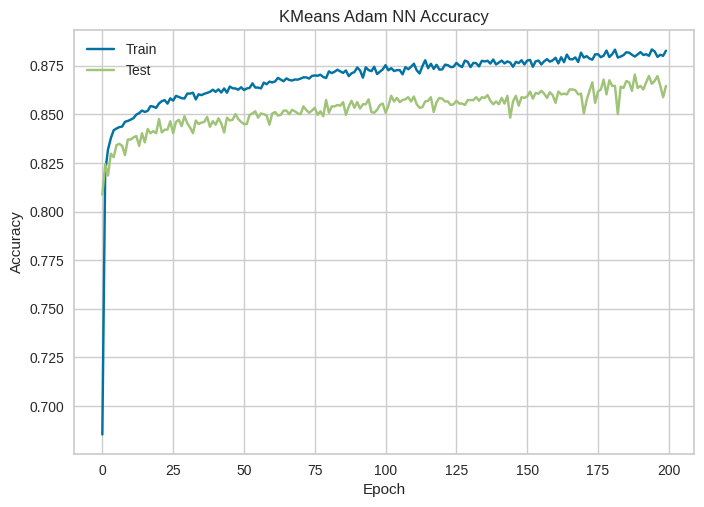

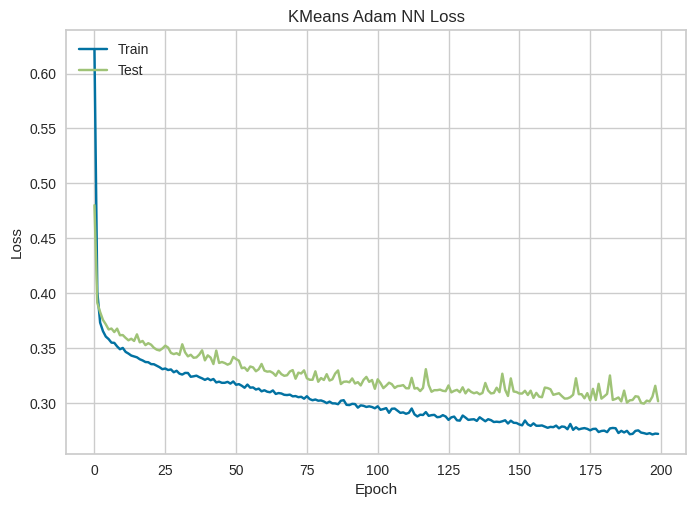

In [268]:
kmeans_housing = pd.concat([X_housing,pd.DataFrame(kmeans_y_housing)],axis=1)
y_housing = np.array(y_housing.astype(int))

X_train, X_test, y_train, y_test = train_test_split(kmeans_housing, y_housing, test_size=0.2, random_state=42)
layer_list = [32,16,8]
run_nn(layer_list=layer_list,X_train=X_train,y_train=y_train,epochs=200,X_test=X_test,y_test=y_test,plot_type='KMeans')